In [2]:
# Necessary imports for this notebook
import os

import numpy as np
import pandas as pd

import datetime
import time

import random

#for plotting 
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

In [3]:
def generate_customer_profiles_table(n_customers, random_state=0):
    
    np.random.seed(random_state)
        
    customer_id_properties=[]
    
    # Generate customer properties from random distributions 
    for customer_id in range(n_customers):
        
        x_customer_id = np.random.uniform(0,100)
        y_customer_id = np.random.uniform(0,100)
        
        mean_amount = np.random.uniform(5,100) # Arbitrary (but sensible) value 
        std_amount = mean_amount/2 # Arbitrary (but sensible) value
        
        mean_nb_tx_per_day = np.random.uniform(0,4) # Arbitrary (but sensible) value 
        
        customer_id_properties.append([customer_id,
                                      x_customer_id, y_customer_id,
                                      mean_amount, std_amount,
                                      mean_nb_tx_per_day])
        
    customer_profiles_table = pd.DataFrame(customer_id_properties, columns=['CUSTOMER_ID',
                                                                      'x_customer_id', 'y_customer_id',
                                                                      'mean_amount', 'std_amount',
                                                                      'mean_nb_tx_per_day'])
    
    return customer_profiles_table

In [4]:
n_customers = 5
customer_profiles_table = generate_customer_profiles_table(n_customers, random_state = 0)
customer_profiles_table

,CUSTOMER_ID,x_customer_id,y_customer_id,mean_amount,std_amount,mean_nb_tx_per_day
0,0,54.881350,71.518937,62.262521,31.131260,2.179533
1,1,42.365480,64.589411,46.570785,23.285393,3.567092
2,2,96.366276,38.344152,80.213879,40.106939,2.115580
3,3,56.804456,92.559664,11.748426,5.874213,0.348517
4,4,2.021840,83.261985,78.924891,39.462446,3.480049


In [5]:
def generate_terminal_profiles_table(n_terminals, random_state=0):
    
    np.random.seed(random_state)
        
    terminal_id_properties=[]
    
    # Generate terminal properties from random distributions 
    for terminal_id in range(n_terminals):
        
        x_terminal_id = np.random.uniform(0,100)
        y_terminal_id = np.random.uniform(0,100)
        
        terminal_id_properties.append([terminal_id,
                                      x_terminal_id, y_terminal_id])
                                       
    terminal_profiles_table = pd.DataFrame(terminal_id_properties, columns=['TERMINAL_ID',
                                                                      'x_terminal_id', 'y_terminal_id'])
    
    return terminal_profiles_table

In [6]:
n_terminals = 5
terminal_profiles_table = generate_terminal_profiles_table(n_terminals, random_state = 0)
terminal_profiles_table

,TERMINAL_ID,x_terminal_id,y_terminal_id
0,0,54.881350,71.518937
1,1,60.276338,54.488318
2,2,42.365480,64.589411
3,3,43.758721,89.177300
4,4,96.366276,38.344152


In [7]:
def get_list_terminals_within_radius(customer_profile, x_y_terminals, r):
    
    # Use numpy arrays in the following to speed up computations
    
    # Location (x,y) of customer as numpy array
    x_y_customer = customer_profile[['x_customer_id','y_customer_id']].values.astype(float)
    
    # Squared difference in coordinates between customer and terminal locations
    squared_diff_x_y = np.square(x_y_customer - x_y_terminals)
    
    # Sum along rows and compute suared root to get distance
    dist_x_y = np.sqrt(np.sum(squared_diff_x_y, axis=1))
    
    # Get the indices of terminals which are at a distance less than r
    available_terminals = list(np.where(dist_x_y<r)[0])
    
    # Return the list of terminal IDs
    return available_terminals
    

In [8]:
# We first get the geographical locations of all terminals as a numpy array
x_y_terminals = terminal_profiles_table[['x_terminal_id','y_terminal_id']].values.astype(float)
# And get the list of terminals within radius of $50$ for the last customer
get_list_terminals_within_radius(customer_profiles_table.iloc[4], x_y_terminals=x_y_terminals, r=50)

[2, 3]

In [9]:
terminal_profiles_table

,TERMINAL_ID,x_terminal_id,y_terminal_id
0,0,54.881350,71.518937
1,1,60.276338,54.488318
2,2,42.365480,64.589411
3,3,43.758721,89.177300
4,4,96.366276,38.344152


In [10]:
%%capture

terminals_available_to_customer_fig, ax = plt.subplots(figsize=(5,5))

# Plot locations of terminals
ax.scatter(terminal_profiles_table.x_terminal_id.values, 
           terminal_profiles_table.y_terminal_id.values, 
           color='blue', label = 'Locations of terminals')

# Plot location of the last customer
customer_id=4
ax.scatter(customer_profiles_table.iloc[customer_id].x_customer_id, 
           customer_profiles_table.iloc[customer_id].y_customer_id, 
           color='red',label="Location of last customer")

ax.legend(loc = 'upper left', bbox_to_anchor=(1.05, 1))

# Plot the region within a radius of 50 of the last customer
circ = plt.Circle((customer_profiles_table.iloc[customer_id].x_customer_id,
                   customer_profiles_table.iloc[customer_id].y_customer_id), radius=50, color='g', alpha=0.2)
ax.add_patch(circ)

fontsize=15

ax.set_title("Green circle: \n Terminals within a radius of 50 \n of the last customer")
ax.set_xlim([0, 100])
ax.set_ylim([0, 100])
    
ax.set_xlabel('x_terminal_id', fontsize=fontsize)
ax.set_ylabel('y_terminal_id', fontsize=fontsize)

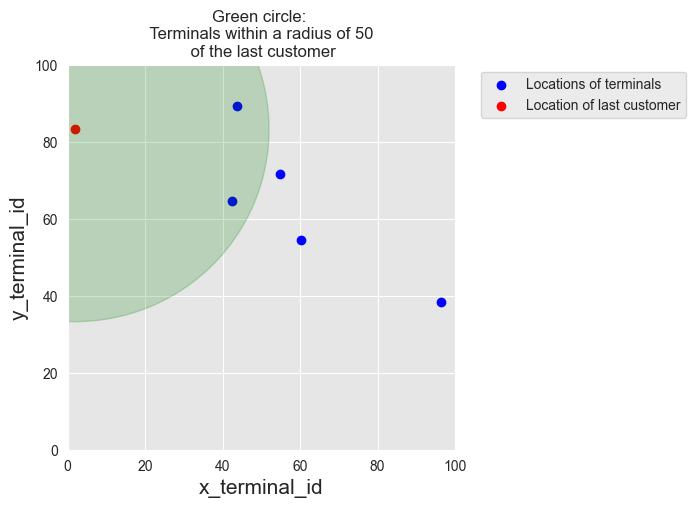

In [11]:
terminals_available_to_customer_fig

In [12]:
customer_profiles_table['available_terminals']=customer_profiles_table.apply(lambda x : get_list_terminals_within_radius(x, x_y_terminals=x_y_terminals, r=50), axis=1)
customer_profiles_table

,CUSTOMER_ID,x_customer_id,y_customer_id,mean_amount,std_amount,mean_nb_tx_per_day,available_terminals
0,0,54.881350,71.518937,62.262521,31.131260,2.179533,"[0, 1, 2, 3]"
1,1,42.365480,64.589411,46.570785,23.285393,3.567092,"[0, 1, 2, 3]"
2,2,96.366276,38.344152,80.213879,40.106939,2.115580,"[1, 4]"
3,3,56.804456,92.559664,11.748426,5.874213,0.348517,"[0, 1, 2, 3]"
4,4,2.021840,83.261985,78.924891,39.462446,3.480049,"[2, 3]"


In [13]:
def generate_transactions_table(customer_profile, start_date = "2018-04-01", nb_days = 10):
    
    customer_transactions = []
    
    random.seed(int(customer_profile.CUSTOMER_ID))
    np.random.seed(int(customer_profile.CUSTOMER_ID))
    
    # For all days
    for day in range(nb_days):
        
        # Random number of transactions for that day 
        nb_tx = np.random.poisson(customer_profile.mean_nb_tx_per_day)
        
        # If nb_tx positive, let us generate transactions
        if nb_tx>0:
            
            for tx in range(nb_tx):
                
                # Time of transaction: Around noon, std 20000 seconds. This choice aims at simulating the fact that 
                # most transactions occur during the day.
                time_tx = int(np.random.normal(86400/2, 20000))
                
                # If transaction time between 0 and 86400, let us keep it, otherwise, let us discard it
                if (time_tx>0) and (time_tx<86400):
                    
                    # Amount is drawn from a normal distribution  
                    amount = np.random.normal(customer_profile.mean_amount, customer_profile.std_amount)
                    
                    # If amount negative, draw from a uniform distribution
                    if amount<0:
                        amount = np.random.uniform(0,customer_profile.mean_amount*2)
                    
                    amount=np.round(amount,decimals=2)
                    
                    if len(customer_profile.available_terminals)>0:
                        
                        terminal_id = random.choice(customer_profile.available_terminals)
                    
                        customer_transactions.append([time_tx+day*86400, day,
                                                      customer_profile.CUSTOMER_ID, 
                                                      terminal_id, amount])
            
    customer_transactions = pd.DataFrame(customer_transactions, columns=['TX_TIME_SECONDS', 'TX_TIME_DAYS', 'CUSTOMER_ID', 'TERMINAL_ID', 'TX_AMOUNT'])
    
    if len(customer_transactions)>0:
        customer_transactions['TX_DATETIME'] = pd.to_datetime(customer_transactions["TX_TIME_SECONDS"], unit='s', origin=start_date)
        customer_transactions=customer_transactions[['TX_DATETIME','CUSTOMER_ID', 'TERMINAL_ID', 'TX_AMOUNT','TX_TIME_SECONDS', 'TX_TIME_DAYS']]
    
    return customer_transactions  
    
    

In [14]:
transaction_table_customer_0=generate_transactions_table(customer_profiles_table.iloc[0], 
                                                         start_date = "2018-04-01", 
                                                         nb_days = 5)
transaction_table_customer_0

,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS
0,2018-04-01 07:19:05,0,3,123.59,26345,0
1,2018-04-01 19:02:02,0,3,46.51,68522,0
2,2018-04-01 18:00:16,0,0,77.34,64816,0
3,2018-04-02 15:13:02,0,2,32.35,141182,1
4,2018-04-02 14:05:38,0,3,63.30,137138,1
5,2018-04-02 15:46:51,0,3,13.59,143211,1
6,2018-04-02 08:51:06,0,2,54.72,118266,1
7,2018-04-02 20:24:47,0,3,51.89,159887,1
8,2018-04-03 12:15:47,0,2,117.91,216947,2
9,2018-04-03 08:50:09,0,1,67.72,204609,2


In [15]:
transactions_df=customer_profiles_table.groupby('CUSTOMER_ID').apply(lambda x : generate_transactions_table(x.iloc[0], nb_days=5)).reset_index(drop=True)
transactions_df

,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS
0,2018-04-01 07:19:05,0,3,123.59,26345,0
1,2018-04-01 19:02:02,0,3,46.51,68522,0
2,2018-04-01 18:00:16,0,0,77.34,64816,0
3,2018-04-02 15:13:02,0,2,32.35,141182,1
4,2018-04-02 14:05:38,0,3,63.30,137138,1
...,...,...,...,...,...,...
60,2018-04-05 07:41:19,4,2,111.38,373279,4
61,2018-04-05 06:59:59,4,3,80.36,370799,4
62,2018-04-05 17:23:34,4,2,53.25,408214,4
63,2018-04-05 12:51:38,4,2,36.44,391898,4


In [16]:
def generate_dataset(n_customers = 10000, n_terminals = 1000000, nb_days=90, start_date="2018-04-01", r=5):
    
    start_time=time.time()
    customer_profiles_table = generate_customer_profiles_table(n_customers, random_state = 0)
    print("Time to generate customer profiles table: {0:.2}s".format(time.time()-start_time))
    
    start_time=time.time()
    terminal_profiles_table = generate_terminal_profiles_table(n_terminals, random_state = 1)
    print("Time to generate terminal profiles table: {0:.2}s".format(time.time()-start_time))
    
    start_time=time.time()
    x_y_terminals = terminal_profiles_table[['x_terminal_id','y_terminal_id']].values.astype(float)
    customer_profiles_table['available_terminals'] = customer_profiles_table.apply(lambda x : get_list_terminals_within_radius(x, x_y_terminals=x_y_terminals, r=r), axis=1)
    # With Pandarallel
    #customer_profiles_table['available_terminals'] = customer_profiles_table.parallel_apply(lambda x : get_list_closest_terminals(x, x_y_terminals=x_y_terminals, r=r), axis=1)
    customer_profiles_table['nb_terminals']=customer_profiles_table.available_terminals.apply(len)
    print("Time to associate terminals to customers: {0:.2}s".format(time.time()-start_time))
    
    start_time=time.time()
    transactions_df=customer_profiles_table.groupby('CUSTOMER_ID').apply(lambda x : generate_transactions_table(x.iloc[0], nb_days=nb_days)).reset_index(drop=True)
    # With Pandarallel
    #transactions_df=customer_profiles_table.groupby('CUSTOMER_ID').parallel_apply(lambda x : generate_transactions_table(x.iloc[0], nb_days=nb_days)).reset_index(drop=True)
    print("Time to generate transactions: {0:.2}s".format(time.time()-start_time))
    
    # Sort transactions chronologically
    transactions_df=transactions_df.sort_values('TX_DATETIME')
    # Reset indices, starting from 0
    transactions_df.reset_index(inplace=True,drop=True)
    transactions_df.reset_index(inplace=True)
    # TRANSACTION_ID are the dataframe indices, starting from 0
    transactions_df.rename(columns = {'index':'TRANSACTION_ID'}, inplace = True)
    
    return (customer_profiles_table, terminal_profiles_table, transactions_df)
    

In [17]:
(customer_profiles_table, terminal_profiles_table, transactions_df)=\
    generate_dataset(n_customers = 5000, 
                     n_terminals = 10000, 
                     nb_days=183, 
                     start_date="2018-04-01", 
                     r=5)

Time to generate customer profiles table: 0.07s
Time to generate terminal profiles table: 0.057s
Time to associate terminals to customers: 2.3s
Time to generate transactions: 8.6e+01s


In [18]:
transactions_df.shape

(1754155, 7)

In [19]:
transactions_df

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS
0,0,2018-04-01 00:00:31,596,3156,57.16,31,0
1,1,2018-04-01 00:02:10,4961,3412,81.51,130,0
2,2,2018-04-01 00:07:56,2,1365,146.00,476,0
3,3,2018-04-01 00:09:29,4128,8737,64.49,569,0
4,4,2018-04-01 00:10:34,927,9906,50.99,634,0
...,...,...,...,...,...,...,...
1754150,1754150,2018-09-30 23:56:36,161,655,54.24,15810996,182
1754151,1754151,2018-09-30 23:57:38,4342,6181,1.23,15811058,182
1754152,1754152,2018-09-30 23:58:21,618,1502,6.62,15811101,182
1754153,1754153,2018-09-30 23:59:52,4056,3067,55.40,15811192,182


In [20]:
%%capture

distribution_amount_times_fig, ax = plt.subplots(1, 2, figsize=(18,4))

amount_val = transactions_df[transactions_df.TX_TIME_DAYS<10]['TX_AMOUNT'].sample(n=10000).values
time_val = transactions_df[transactions_df.TX_TIME_DAYS<10]['TX_TIME_SECONDS'].sample(n=10000).values

sns.distplot(amount_val, ax=ax[0], color='r', hist = True, kde = False)
ax[0].set_title('Distribution of transaction amounts', fontsize=14)
ax[0].set_xlim([min(amount_val), max(amount_val)])
ax[0].set(xlabel = "Amount", ylabel="Number of transactions")

# We divide the time variables by 86400 to transform seconds to days in the plot
sns.distplot(time_val/86400, ax=ax[1], color='b', bins = 100, hist = True, kde = False)
ax[1].set_title('Distribution of transaction times', fontsize=14)
ax[1].set_xlim([min(time_val/86400), max(time_val/86400)])
ax[1].set_xticks(range(10))
ax[1].set(xlabel = "Time (days)", ylabel="Number of transactions")

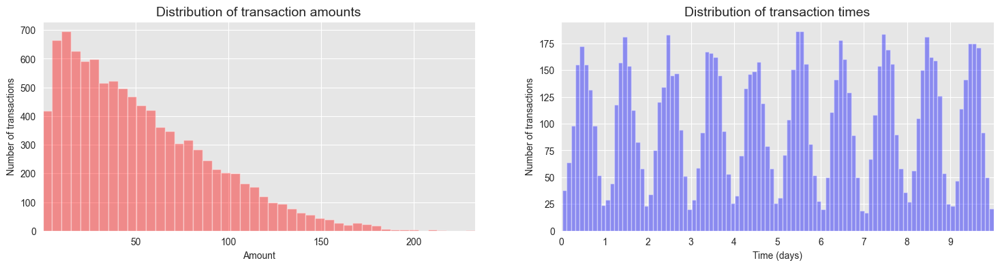

In [21]:
distribution_amount_times_fig

In [22]:
def add_frauds(customer_profiles_table, terminal_profiles_table, transactions_df):
    
    # By default, all transactions are genuine
    transactions_df['TX_FRAUD']=0
    transactions_df['TX_FRAUD_SCENARIO']=0
    
    # Scenario 1
    transactions_df.loc[transactions_df.TX_AMOUNT>220, 'TX_FRAUD']=1
    transactions_df.loc[transactions_df.TX_AMOUNT>220, 'TX_FRAUD_SCENARIO']=1
    nb_frauds_scenario_1=transactions_df.TX_FRAUD.sum()
    print("Number of frauds from scenario 1: "+str(nb_frauds_scenario_1))
    
    # Scenario 2
    for day in range(transactions_df.TX_TIME_DAYS.max()):
        
        compromised_terminals = terminal_profiles_table.TERMINAL_ID.sample(n=2, random_state=day)
        
        compromised_transactions=transactions_df[(transactions_df.TX_TIME_DAYS>=day) & 
                                                    (transactions_df.TX_TIME_DAYS<day+28) & 
                                                    (transactions_df.TERMINAL_ID.isin(compromised_terminals))]
                            
        transactions_df.loc[compromised_transactions.index,'TX_FRAUD']=1
        transactions_df.loc[compromised_transactions.index,'TX_FRAUD_SCENARIO']=2
    
    nb_frauds_scenario_2=transactions_df.TX_FRAUD.sum()-nb_frauds_scenario_1
    print("Number of frauds from scenario 2: "+str(nb_frauds_scenario_2))
    
    # Scenario 3
    for day in range(transactions_df.TX_TIME_DAYS.max()):
        
        compromised_customers = customer_profiles_table.CUSTOMER_ID.sample(n=3, random_state=day).values
        
        compromised_transactions=transactions_df[(transactions_df.TX_TIME_DAYS>=day) & 
                                                    (transactions_df.TX_TIME_DAYS<day+14) & 
                                                    (transactions_df.CUSTOMER_ID.isin(compromised_customers))]
        
        nb_compromised_transactions=len(compromised_transactions)
        
        
        random.seed(day)
        index_fauds = random.sample(list(compromised_transactions.index.values),k=int(nb_compromised_transactions/3))
        
        transactions_df.loc[index_fauds,'TX_AMOUNT']=transactions_df.loc[index_fauds,'TX_AMOUNT']*5
        transactions_df.loc[index_fauds,'TX_FRAUD']=1
        transactions_df.loc[index_fauds,'TX_FRAUD_SCENARIO']=3
        
                             
    nb_frauds_scenario_3=transactions_df.TX_FRAUD.sum()-nb_frauds_scenario_2-nb_frauds_scenario_1
    print("Number of frauds from scenario 3: "+str(nb_frauds_scenario_3))
    
    return transactions_df                 

In [23]:
%time transactions_df = add_frauds(customer_profiles_table, terminal_profiles_table, transactions_df)

Number of frauds from scenario 1: 978
Number of frauds from scenario 2: 9099
Number of frauds from scenario 3: 4604
CPU times: total: 57.2 s
Wall time: 1min 14s


In [24]:
transactions_df.TX_FRAUD.mean()

0.008369271814634397

In [25]:
transactions_df.TX_FRAUD.sum()

14681

In [26]:
transactions_df.head()

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO
0,0,2018-04-01 00:00:31,596,3156,57.16,31,0,0,0
1,1,2018-04-01 00:02:10,4961,3412,81.51,130,0,0,0
2,2,2018-04-01 00:07:56,2,1365,146.00,476,0,0,0
3,3,2018-04-01 00:09:29,4128,8737,64.49,569,0,0,0
4,4,2018-04-01 00:10:34,927,9906,50.99,634,0,0,0


In [27]:
transactions_df[transactions_df.TX_FRAUD_SCENARIO==1].shape

(973, 9)

In [28]:
transactions_df[transactions_df.TX_FRAUD_SCENARIO==2].shape

(9077, 9)

In [29]:
transactions_df[transactions_df.TX_FRAUD_SCENARIO==3].shape

(4631, 9)

In [30]:
def get_stats(transactions_df):
    #Number of transactions per day
    nb_tx_per_day=transactions_df.groupby(['TX_TIME_DAYS'])['CUSTOMER_ID'].count()
    #Number of fraudulent transactions per day
    nb_fraud_per_day=transactions_df.groupby(['TX_TIME_DAYS'])['TX_FRAUD'].sum()
    #Number of fraudulent cards per day
    nb_fraudcard_per_day=transactions_df[transactions_df['TX_FRAUD']>0].groupby(['TX_TIME_DAYS']).CUSTOMER_ID.nunique()
    
    return (nb_tx_per_day,nb_fraud_per_day,nb_fraudcard_per_day)

(nb_tx_per_day,nb_fraud_per_day,nb_fraudcard_per_day)=get_stats(transactions_df)

n_days=len(nb_tx_per_day)
tx_stats=pd.DataFrame({"value":pd.concat([nb_tx_per_day/50,nb_fraud_per_day,nb_fraudcard_per_day])})
tx_stats['stat_type']=["nb_tx_per_day"]*n_days+["nb_fraud_per_day"]*n_days+["nb_fraudcard_per_day"]*n_days
tx_stats=tx_stats.reset_index()

In [31]:
%%capture

sns.set(style='darkgrid')
sns.set(font_scale=1.4)

fraud_and_transactions_stats_fig = plt.gcf()

fraud_and_transactions_stats_fig.set_size_inches(15, 8)

sns_plot = sns.lineplot(x="TX_TIME_DAYS", y="value", data=tx_stats, hue="stat_type", hue_order=["nb_tx_per_day","nb_fraud_per_day","nb_fraudcard_per_day"], legend=False)

sns_plot.set_title('Total transactions, and number of fraudulent transactions \n and number of compromised cards per day', fontsize=20)
sns_plot.set(xlabel = "Number of days since beginning of data generation", ylabel="Number")

sns_plot.set_ylim([0,300])

labels_legend = ["# transactions per day (/50)", "# fraudulent txs per day", "# fraudulent cards per day"]

sns_plot.legend(loc='upper left', labels=labels_legend,bbox_to_anchor=(1.05, 1), fontsize=15)

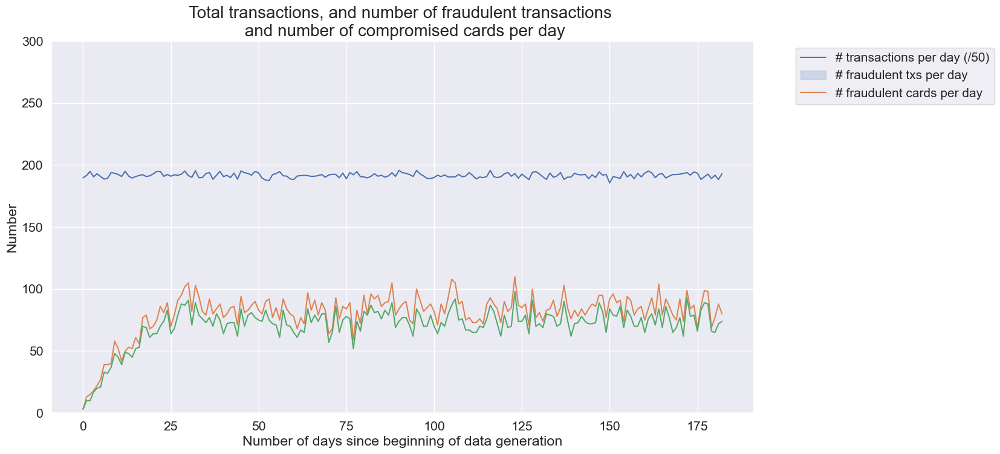

In [32]:
fraud_and_transactions_stats_fig

In [33]:
DIR_OUTPUT = "./simulated-data-raw/"

if not os.path.exists(DIR_OUTPUT):
    os.makedirs(DIR_OUTPUT)

start_date = datetime.datetime.strptime("2018-04-01", "%Y-%m-%d")

for day in range(transactions_df.TX_TIME_DAYS.max()+1):
    
    transactions_day = transactions_df[transactions_df.TX_TIME_DAYS==day].sort_values('TX_TIME_SECONDS')
    
    date = start_date + datetime.timedelta(days=day)
    filename_output = date.strftime("%Y-%m-%d")+'.pkl'
    
    # Protocol=4 required for Google Colab
    transactions_day.to_pickle(DIR_OUTPUT+filename_output, protocol=4)

In [34]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py

# Get simulated data from Github repository
if not os.path.exists("simulated-data-raw"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-raw
        

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:04 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:05 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:06 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:07 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:08 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:09 --:--:--     0
  0     0    0     0    0     0      0      0 --:--

<Figure size 640x480 with 0 Axes>

In [35]:
DIR_INPUT='./simulated-data-raw/data/' 

BEGIN_DATE = "2018-04-01"
END_DATE = "2018-09-30"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

Load  files
CPU times: total: 2.47 s
Wall time: 5.61 s
1754155 transactions loaded, containing 14681 fraudulent transactions


In [36]:
transactions_df.head()

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO
0,0,2018-04-01 00:00:31,596,3156,57.16,31,0,0,0
1,1,2018-04-01 00:02:10,4961,3412,81.51,130,0,0,0
2,2,2018-04-01 00:07:56,2,1365,146.00,476,0,0,0
3,3,2018-04-01 00:09:29,4128,8737,64.49,569,0,0,0
4,4,2018-04-01 00:10:34,927,9906,50.99,634,0,0,0


In [37]:
def is_weekend(tx_datetime):
    
    # Transform date into weekday (0 is Monday, 6 is Sunday)
    weekday = tx_datetime.weekday()
    # Binary value: 0 if weekday, 1 if weekend
    is_weekend = weekday>=5
    
    return int(is_weekend)

In [38]:
%time transactions_df['TX_DURING_WEEKEND']=transactions_df.TX_DATETIME.apply(is_weekend)

CPU times: total: 1.61 s
Wall time: 3.32 s


In [39]:
def is_night(tx_datetime):
    
    # Get the hour of the transaction
    tx_hour = tx_datetime.hour
    # Binary value: 1 if hour less than 6, and 0 otherwise
    is_night = tx_hour<=6
    
    return int(is_night)

In [40]:
%time transactions_df['TX_DURING_NIGHT']=transactions_df.TX_DATETIME.apply(is_night)

CPU times: total: 1.42 s
Wall time: 2.91 s


In [41]:
transactions_df[transactions_df.TX_TIME_DAYS>=30]

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,TX_DURING_NIGHT
288062,288062,2018-05-01 00:01:21,3546,2944,18.71,2592081,30,0,0,0,1
288063,288063,2018-05-01 00:01:48,206,3521,18.60,2592108,30,0,0,0,1
288064,288064,2018-05-01 00:02:22,2610,4470,66.67,2592142,30,0,0,0,1
288065,288065,2018-05-01 00:03:15,4578,1520,79.41,2592195,30,0,0,0,1
288066,288066,2018-05-01 00:03:51,1246,7809,52.08,2592231,30,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
1754150,1754150,2018-09-30 23:56:36,161,655,54.24,15810996,182,0,0,1,0
1754151,1754151,2018-09-30 23:57:38,4342,6181,1.23,15811058,182,0,0,1,0
1754152,1754152,2018-09-30 23:58:21,618,1502,6.62,15811101,182,0,0,1,0
1754153,1754153,2018-09-30 23:59:52,4056,3067,55.40,15811192,182,0,0,1,0


In [42]:
def get_customer_spending_behaviour_features(customer_transactions, windows_size_in_days=[1,7,30]):
    
    # Let us first order transactions chronologically
    customer_transactions=customer_transactions.sort_values('TX_DATETIME')
    
    # The transaction date and time is set as the index, which will allow the use of the rolling function 
    customer_transactions.index=customer_transactions.TX_DATETIME
    
    # For each window size
    for window_size in windows_size_in_days:
        
        # Compute the sum of the transaction amounts and the number of transactions for the given window size
        SUM_AMOUNT_TX_WINDOW=customer_transactions['TX_AMOUNT'].rolling(str(window_size)+'d').sum()
        NB_TX_WINDOW=customer_transactions['TX_AMOUNT'].rolling(str(window_size)+'d').count()
    
        # Compute the average transaction amount for the given window size
        # NB_TX_WINDOW is always >0 since current transaction is always included
        AVG_AMOUNT_TX_WINDOW=SUM_AMOUNT_TX_WINDOW/NB_TX_WINDOW
    
        # Save feature values
        customer_transactions['CUSTOMER_ID_NB_TX_'+str(window_size)+'DAY_WINDOW']=list(NB_TX_WINDOW)
        customer_transactions['CUSTOMER_ID_AVG_AMOUNT_'+str(window_size)+'DAY_WINDOW']=list(AVG_AMOUNT_TX_WINDOW)
    
    # Reindex according to transaction IDs
    customer_transactions.index=customer_transactions.TRANSACTION_ID
        
    # And return the dataframe with the new features
    return customer_transactions

In [43]:
spending_behaviour_customer_0=get_customer_spending_behaviour_features(transactions_df[transactions_df.CUSTOMER_ID==0])
spending_behaviour_customer_0

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,TX_DURING_NIGHT,CUSTOMER_ID_NB_TX_1DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW,CUSTOMER_ID_NB_TX_7DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW,CUSTOMER_ID_NB_TX_30DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW
TRANSACTION_ID,,,,,,,,,,,,,,,,,
1758,1758,2018-04-01 07:19:05,0,6076,123.59,26345,0,0,0,1,0,1.0,123.590000,1.0,123.590000,1.0,123.590000
8275,8275,2018-04-01 18:00:16,0,858,77.34,64816,0,0,0,1,0,2.0,100.465000,2.0,100.465000,2.0,100.465000
8640,8640,2018-04-01 19:02:02,0,6698,46.51,68522,0,0,0,1,0,3.0,82.480000,3.0,82.480000,3.0,82.480000
12169,12169,2018-04-02 08:51:06,0,6569,54.72,118266,1,0,0,0,0,3.0,59.523333,4.0,75.540000,4.0,75.540000
15764,15764,2018-04-02 14:05:38,0,7707,63.30,137138,1,0,0,0,0,4.0,60.467500,5.0,73.092000,5.0,73.092000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1750390,1750390,2018-09-30 13:38:41,0,3096,38.23,15773921,182,0,0,1,0,5.0,64.388000,28.0,57.306429,89.0,63.097640
1750758,1750758,2018-09-30 14:10:21,0,9441,43.60,15775821,182,0,0,1,0,6.0,60.923333,29.0,56.833793,89.0,62.433933
1751039,1751039,2018-09-30 14:34:30,0,1138,69.69,15777270,182,0,0,1,0,7.0,62.175714,29.0,57.872414,90.0,62.514556


In [44]:
%time transactions_df=transactions_df.groupby('CUSTOMER_ID').apply(lambda x: get_customer_spending_behaviour_features(x, windows_size_in_days=[1,7,30]))
transactions_df=transactions_df.sort_values('TX_DATETIME').reset_index(drop=True)

CPU times: total: 16.9 s
Wall time: 20.7 s


In [45]:
transactions_df

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,TX_DURING_NIGHT,CUSTOMER_ID_NB_TX_1DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW,CUSTOMER_ID_NB_TX_7DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW,CUSTOMER_ID_NB_TX_30DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW
0,0,2018-04-01 00:00:31,596,3156,57.16,31,0,0,0,1,1,1.0,57.160000,1.0,57.160000,1.0,57.160000
1,1,2018-04-01 00:02:10,4961,3412,81.51,130,0,0,0,1,1,1.0,81.510000,1.0,81.510000,1.0,81.510000
2,2,2018-04-01 00:07:56,2,1365,146.00,476,0,0,0,1,1,1.0,146.000000,1.0,146.000000,1.0,146.000000
3,3,2018-04-01 00:09:29,4128,8737,64.49,569,0,0,0,1,1,1.0,64.490000,1.0,64.490000,1.0,64.490000
4,4,2018-04-01 00:10:34,927,9906,50.99,634,0,0,0,1,1,1.0,50.990000,1.0,50.990000,1.0,50.990000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1754150,1754150,2018-09-30 23:56:36,161,655,54.24,15810996,182,0,0,1,0,2.0,75.280000,12.0,67.047500,72.0,69.521111
1754151,1754151,2018-09-30 23:57:38,4342,6181,1.23,15811058,182,0,0,1,0,1.0,1.230000,21.0,22.173810,93.0,24.780753
1754152,1754152,2018-09-30 23:58:21,618,1502,6.62,15811101,182,0,0,1,0,5.0,7.368000,21.0,7.400476,65.0,7.864462
1754153,1754153,2018-09-30 23:59:52,4056,3067,55.40,15811192,182,0,0,1,0,3.0,100.696667,16.0,107.052500,51.0,102.919608


In [46]:
def get_count_risk_rolling_window(terminal_transactions, delay_period=7, windows_size_in_days=[1,7,30], feature="TERMINAL_ID"):
    
    terminal_transactions=terminal_transactions.sort_values('TX_DATETIME')
    
    terminal_transactions.index=terminal_transactions.TX_DATETIME
    
    NB_FRAUD_DELAY=terminal_transactions['TX_FRAUD'].rolling(str(delay_period)+'d').sum()
    NB_TX_DELAY=terminal_transactions['TX_FRAUD'].rolling(str(delay_period)+'d').count()
    
    for window_size in windows_size_in_days:
    
        NB_FRAUD_DELAY_WINDOW=terminal_transactions['TX_FRAUD'].rolling(str(delay_period+window_size)+'d').sum()
        NB_TX_DELAY_WINDOW=terminal_transactions['TX_FRAUD'].rolling(str(delay_period+window_size)+'d').count()
    
        NB_FRAUD_WINDOW=NB_FRAUD_DELAY_WINDOW-NB_FRAUD_DELAY
        NB_TX_WINDOW=NB_TX_DELAY_WINDOW-NB_TX_DELAY
    
        RISK_WINDOW=NB_FRAUD_WINDOW/NB_TX_WINDOW
        
        terminal_transactions[feature+'_NB_TX_'+str(window_size)+'DAY_WINDOW']=list(NB_TX_WINDOW)
        terminal_transactions[feature+'_RISK_'+str(window_size)+'DAY_WINDOW']=list(RISK_WINDOW)
        
    terminal_transactions.index=terminal_transactions.TRANSACTION_ID
    
    # Replace NA values with 0 (all undefined risk scores where NB_TX_WINDOW is 0) 
    terminal_transactions.fillna(0,inplace=True)
    
    return terminal_transactions

In [47]:
transactions_df[transactions_df.TX_FRAUD==1]

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,TX_DURING_NIGHT,CUSTOMER_ID_NB_TX_1DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW,CUSTOMER_ID_NB_TX_7DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW,CUSTOMER_ID_NB_TX_30DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW
3527,3527,2018-04-01 10:17:43,3774,3059,225.41,37063,0,1,1,1,0,3.0,158.073333,3.0,158.073333,3.0,158.073333
5789,5790,2018-04-01 13:31:48,4944,6050,222.26,48708,0,1,1,1,0,2.0,127.605000,2.0,127.605000,2.0,127.605000
6549,6549,2018-04-01 14:42:02,4625,9102,226.40,52922,0,1,1,1,0,4.0,167.165000,4.0,167.165000,4.0,167.165000
9583,9583,2018-04-02 01:01:05,3814,6893,59.15,90065,1,1,3,0,1,6.0,29.138333,6.0,29.138333,6.0,29.138333
10356,10355,2018-04-02 05:03:35,2513,1143,222.04,104615,1,1,1,0,1,5.0,123.740000,5.0,123.740000,5.0,123.740000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1753524,1753524,2018-09-30 19:51:48,1671,3192,128.60,15796308,182,1,3,1,0,6.0,138.358333,25.0,106.957200,82.0,75.621341
1753600,1753600,2018-09-30 20:09:00,4166,632,17.39,15797340,182,1,2,1,0,3.0,19.766667,19.0,15.984737,86.0,15.846512
1753673,1753673,2018-09-30 20:30:52,4097,1558,24.04,15798652,182,1,2,1,0,3.0,23.050000,16.0,40.440625,63.0,41.877460
1754014,1754014,2018-09-30 22:27:04,100,8604,73.85,15805624,182,1,3,1,0,2.0,48.010000,26.0,30.384231,103.0,23.627184


In [48]:
# Get the first terminal ID that contains frauds
transactions_df[transactions_df.TX_FRAUD==0].TERMINAL_ID[0]

3156

In [49]:
get_count_risk_rolling_window(transactions_df[transactions_df.TERMINAL_ID==3059], delay_period=7, windows_size_in_days=[1,7,30])

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,...,CUSTOMER_ID_NB_TX_7DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW,CUSTOMER_ID_NB_TX_30DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW,TERMINAL_ID_NB_TX_1DAY_WINDOW,TERMINAL_ID_RISK_1DAY_WINDOW,TERMINAL_ID_NB_TX_7DAY_WINDOW,TERMINAL_ID_RISK_7DAY_WINDOW,TERMINAL_ID_NB_TX_30DAY_WINDOW,TERMINAL_ID_RISK_30DAY_WINDOW
TRANSACTION_ID,,,,,,,,,,,,,,,,,,,,,
3527,3527,2018-04-01 10:17:43,3774,3059,225.41,37063,0,1,1,1,...,3.0,158.073333,3.0,158.073333,0.0,0.0,0.0,0.0,0.0,0.0
4732,4732,2018-04-01 11:59:14,55,3059,36.28,43154,0,0,0,1,...,2.0,35.670000,2.0,35.670000,0.0,0.0,0.0,0.0,0.0,0.0
16216,16216,2018-04-02 14:47:34,4879,3059,105.00,139654,1,0,0,0,...,10.0,76.010000,10.0,76.010000,0.0,0.0,0.0,0.0,0.0,0.0
18249,18249,2018-04-02 19:08:10,2263,3059,90.89,155290,1,0,0,0,...,7.0,50.458571,7.0,50.458571,0.0,0.0,0.0,0.0,0.0,0.0
26512,26512,2018-04-03 15:44:49,4879,3059,58.51,229489,2,0,0,0,...,14.0,71.070000,14.0,71.070000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1697944,1697944,2018-09-25 05:32:56,402,3059,57.30,15312776,177,0,0,0,...,14.0,65.167857,46.0,68.163261,1.0,0.0,9.0,0.0,36.0,0.0
1701971,1701971,2018-09-25 12:30:54,1035,3059,7.56,15337854,177,0,0,0,...,23.0,7.052174,107.0,6.763738,2.0,0.0,10.0,0.0,36.0,0.0
1704512,1704512,2018-09-25 16:37:41,1519,3059,35.79,15352661,177,0,0,0,...,7.0,41.404286,30.0,46.780000,1.0,0.0,9.0,0.0,36.0,0.0


In [50]:
%time transactions_df=transactions_df.groupby('TERMINAL_ID').apply(lambda x: get_count_risk_rolling_window(x, delay_period=7, windows_size_in_days=[1,7,30], feature="TERMINAL_ID"))
transactions_df=transactions_df.sort_values('TX_DATETIME').reset_index(drop=True)

CPU times: total: 29.6 s
Wall time: 49 s


In [51]:
transactions_df

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,...,CUSTOMER_ID_NB_TX_7DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW,CUSTOMER_ID_NB_TX_30DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW,TERMINAL_ID_NB_TX_1DAY_WINDOW,TERMINAL_ID_RISK_1DAY_WINDOW,TERMINAL_ID_NB_TX_7DAY_WINDOW,TERMINAL_ID_RISK_7DAY_WINDOW,TERMINAL_ID_NB_TX_30DAY_WINDOW,TERMINAL_ID_RISK_30DAY_WINDOW
0,0,2018-04-01 00:00:31,596,3156,57.16,31,0,0,0,1,...,1.0,57.160000,1.0,57.160000,0.0,0.0,0.0,0.0,0.0,0.00000
1,1,2018-04-01 00:02:10,4961,3412,81.51,130,0,0,0,1,...,1.0,81.510000,1.0,81.510000,0.0,0.0,0.0,0.0,0.0,0.00000
2,2,2018-04-01 00:07:56,2,1365,146.00,476,0,0,0,1,...,1.0,146.000000,1.0,146.000000,0.0,0.0,0.0,0.0,0.0,0.00000
3,3,2018-04-01 00:09:29,4128,8737,64.49,569,0,0,0,1,...,1.0,64.490000,1.0,64.490000,0.0,0.0,0.0,0.0,0.0,0.00000
4,4,2018-04-01 00:10:34,927,9906,50.99,634,0,0,0,1,...,1.0,50.990000,1.0,50.990000,0.0,0.0,0.0,0.0,0.0,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1754150,1754150,2018-09-30 23:56:36,161,655,54.24,15810996,182,0,0,1,...,12.0,67.047500,72.0,69.521111,1.0,0.0,4.0,0.0,28.0,0.00000
1754151,1754151,2018-09-30 23:57:38,4342,6181,1.23,15811058,182,0,0,1,...,21.0,22.173810,93.0,24.780753,1.0,0.0,9.0,0.0,39.0,0.00000
1754152,1754152,2018-09-30 23:58:21,618,1502,6.62,15811101,182,0,0,1,...,21.0,7.400476,65.0,7.864462,1.0,0.0,5.0,0.0,33.0,0.00000
1754153,1754153,2018-09-30 23:59:52,4056,3067,55.40,15811192,182,0,0,1,...,16.0,107.052500,51.0,102.919608,1.0,0.0,6.0,0.0,28.0,0.00000


In [52]:
DIR_OUTPUT = "./simulated-data-transformed/"

if not os.path.exists(DIR_OUTPUT):
    os.makedirs(DIR_OUTPUT)

start_date = datetime.datetime.strptime("2018-04-01", "%Y-%m-%d")

for day in range(transactions_df.TX_TIME_DAYS.max()+1):
    
    transactions_day = transactions_df[transactions_df.TX_TIME_DAYS==day].sort_values('TX_TIME_SECONDS')
    
    date = start_date + datetime.timedelta(days=day)
    filename_output = date.strftime("%Y-%m-%d")+'.pkl'
    
    # Protocol=4 required for Google Colab
    transactions_day.to_pickle(DIR_OUTPUT+filename_output, protocol=4)

In [53]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed
        

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:04 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:05 --:--:--     0
 81 63257   81 51351    0     0   7778      0  0:00:08  0:00:06  0:00:02 11403
100 63257  100 63257    0     0   9580      0  0:00:06  0:00:06 --:--:-- 16236


In [54]:
# Load data from the 2018-07-25 to the 2018-08-14

DIR_INPUT='./simulated-data-transformed/data/' 

BEGIN_DATE = "2018-07-25"
END_DATE = "2018-08-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

Load  files
CPU times: total: 78.1 ms
Wall time: 490 ms
201295 transactions loaded, containing 1792 fraudulent transactions


In [55]:
# Compute the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

def get_tx_stats(transactions_df, start_date_df="2018-04-01"):
    
    #Number of transactions per day
    nb_tx_per_day=transactions_df.groupby(['TX_TIME_DAYS'])['CUSTOMER_ID'].count()
    #Number of fraudulent transactions per day
    nb_fraudulent_transactions_per_day=transactions_df.groupby(['TX_TIME_DAYS'])['TX_FRAUD'].sum()
    #Number of compromised cards per day
    nb_compromised_cards_per_day=transactions_df[transactions_df['TX_FRAUD']==1].groupby(['TX_TIME_DAYS']).CUSTOMER_ID.nunique()
    
    tx_stats=pd.DataFrame({"nb_tx_per_day":nb_tx_per_day,
                           "nb_fraudulent_transactions_per_day":nb_fraudulent_transactions_per_day,
                           "nb_compromised_cards_per_day":nb_compromised_cards_per_day})

    tx_stats=tx_stats.reset_index()
    
    start_date = datetime.datetime.strptime(start_date_df, "%Y-%m-%d")
    tx_date=start_date+tx_stats['TX_TIME_DAYS'].apply(datetime.timedelta)
    
    tx_stats['tx_date']=tx_date
    
    return tx_stats

tx_stats=get_tx_stats(transactions_df, start_date_df="2018-04-01")

In [56]:
%%capture

# Plot the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

def get_template_tx_stats(ax ,fs,
                          start_date_training,
                          title='',
                          delta_train=7,
                          delta_delay=7,
                          delta_test=7,
                          ylim=300):
    
    ax.set_title(title, fontsize=fs*1.5)
    ax.set_ylim([0, ylim])
    
    ax.set_xlabel('Date', fontsize=fs)
    ax.set_ylabel('Number', fontsize=fs)
    
    plt.yticks(fontsize=fs*0.7) 
    plt.xticks(fontsize=fs*0.7)    

    ax.axvline(start_date_training+datetime.timedelta(days=delta_train), 0,ylim, color="black")
    ax.axvline(start_date_test, 0, ylim, color="black")
    
    ax.text(start_date_training+datetime.timedelta(days=2), ylim-20,'Training period', fontsize=fs)
    ax.text(start_date_training+datetime.timedelta(days=delta_train+2), ylim-20,'Delay period', fontsize=fs)
    ax.text(start_date_training+datetime.timedelta(days=delta_train+delta_delay+2), ylim-20,'Test period', fontsize=fs)


cmap = plt.get_cmap('jet')
colors={'nb_tx_per_day':cmap(0), 
        'nb_fraudulent_transactions_per_day':cmap(200), 
        'nb_compromised_cards_per_day':cmap(250)}

fraud_and_transactions_stats_fig, ax = plt.subplots(1, 1, figsize=(15,8))

# Training period
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = 7

end_date_training = start_date_training+datetime.timedelta(days=delta_train-1)

# Test period
start_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay)
end_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay+delta_test-1)

get_template_tx_stats(ax, fs=20,
                      start_date_training=start_date_training,
                      title='Total transactions, and number of fraudulent transactions \n and number of compromised cards per day',
                      delta_train=delta_train,
                      delta_delay=delta_delay,
                      delta_test=delta_test
                     )

ax.plot(tx_stats['tx_date'], tx_stats['nb_tx_per_day']/50, 'b', color=colors['nb_tx_per_day'], label = '# transactions per day (/50)')
ax.plot(tx_stats['tx_date'], tx_stats['nb_fraudulent_transactions_per_day'], 'b', color=colors['nb_fraudulent_transactions_per_day'], label = '# fraudulent txs per day')
ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day'], 'b', color=colors['nb_compromised_cards_per_day'], label = '# compromised cards per day')

ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1),fontsize=20)

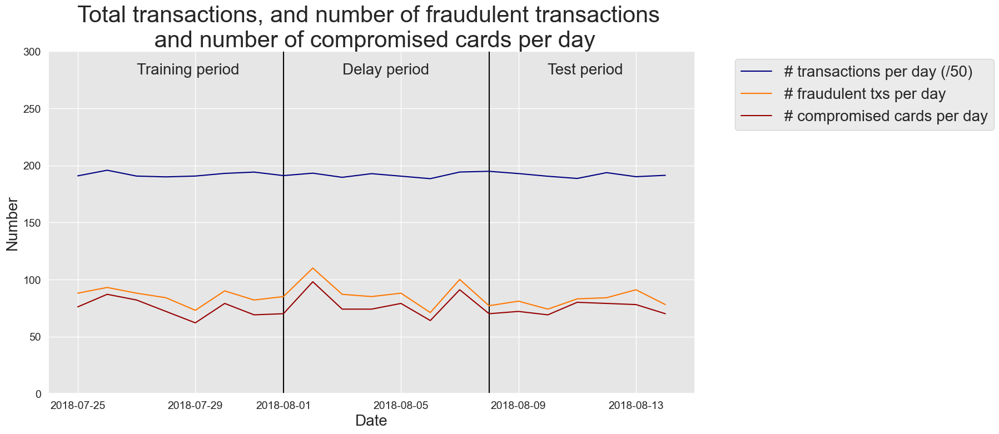

In [57]:
fraud_and_transactions_stats_fig

In [58]:
def get_train_test_set(transactions_df,
                       start_date_training,
                       delta_train=7,delta_delay=7,delta_test=7):
    
    # Get the training set data
    train_df = transactions_df[(transactions_df.TX_DATETIME>=start_date_training) &
                               (transactions_df.TX_DATETIME<start_date_training+datetime.timedelta(days=delta_train))]
    
    # Get the test set data
    test_df = []
    
    # Note: Cards known to be compromised after the delay period are removed from the test set
    # That is, for each test day, all frauds known at (test_day-delay_period) are removed
    
    # First, get known defrauded customers from the training set
    known_defrauded_customers = set(train_df[train_df.TX_FRAUD==1].CUSTOMER_ID)
    
    # Get the relative starting day of training set (easier than TX_DATETIME to collect test data)
    start_tx_time_days_training = train_df.TX_TIME_DAYS.min()
    
    # Then, for each day of the test set
    for day in range(delta_test):
    
        # Get test data for that day
        test_df_day = transactions_df[transactions_df.TX_TIME_DAYS==start_tx_time_days_training+
                                                                    delta_train+delta_delay+
                                                                    day]
        
        # Compromised cards from that test day, minus the delay period, are added to the pool of known defrauded customers
        test_df_day_delay_period = transactions_df[transactions_df.TX_TIME_DAYS==start_tx_time_days_training+
                                                                                delta_train+
                                                                                day-1]
        
        new_defrauded_customers = set(test_df_day_delay_period[test_df_day_delay_period.TX_FRAUD==1].CUSTOMER_ID)
        known_defrauded_customers = known_defrauded_customers.union(new_defrauded_customers)
        
        test_df_day = test_df_day[~test_df_day.CUSTOMER_ID.isin(known_defrauded_customers)]
        
        test_df.append(test_df_day)
        
    test_df = pd.concat(test_df)
    
    # Sort data sets by ascending order of transaction ID
    train_df=train_df.sort_values('TRANSACTION_ID')
    test_df=test_df.sort_values('TRANSACTION_ID')
    
    return (train_df, test_df)

In [59]:
(train_df, test_df)=get_train_test_set(transactions_df,start_date_training,
                                       delta_train=7,delta_delay=7,delta_test=7)

In [60]:
train_df.shape

(67240, 23)

In [61]:
train_df[train_df.TX_FRAUD==1].shape

(598, 23)

In [62]:
test_df.shape

(58264, 23)

In [63]:
test_df[test_df.TX_FRAUD==1].shape

(385, 23)

In [64]:
385/58264

0.00660785390635727

In [65]:
output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

In [66]:
def fit_model_and_get_predictions(classifier, train_df, test_df, 
                                  input_features, output_feature="TX_FRAUD",scale=True):

    # By default, scales input data
    if scale:
        (train_df, test_df)=scaleData(train_df,test_df,input_features)
    
    # We first train the classifier using the `fit` method, and pass as arguments the input and output features
    start_time=time.time()
    classifier.fit(train_df[input_features], train_df[output_feature])
    training_execution_time=time.time()-start_time

    # We then get the predictions on the training and test data using the `predict_proba` method
    # The predictions are returned as a numpy array, that provides the probability of fraud for each transaction 
    start_time=time.time()
    predictions_test=classifier.predict_proba(test_df[input_features])[:,1]
    prediction_execution_time=time.time()-start_time
    
    predictions_train=classifier.predict_proba(train_df[input_features])[:,1]

    # The result is returned as a dictionary containing the fitted models, 
    # and the predictions on the training and test sets
    model_and_predictions_dictionary = {'classifier': classifier,
                                        'predictions_test': predictions_test,
                                        'predictions_train': predictions_train,
                                        'training_execution_time': training_execution_time,
                                        'prediction_execution_time': prediction_execution_time
                                       }
    
    return model_and_predictions_dictionary

In [67]:
# We first create a decision tree object. We will limit its depth to 2 for interpretability, 
# and set the random state to zero for reproducibility
classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df, 
                                                                 input_features, output_feature,
                                                                 scale=False)

In [68]:
test_df['TX_FRAUD_PREDICTED']=model_and_predictions_dictionary['predictions_test']
test_df.head()

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_SECONDS,TX_TIME_DAYS,TX_FRAUD,TX_FRAUD_SCENARIO,TX_DURING_WEEKEND,...,CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW,CUSTOMER_ID_NB_TX_30DAY_WINDOW,CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW,TERMINAL_ID_NB_TX_1DAY_WINDOW,TERMINAL_ID_RISK_1DAY_WINDOW,TERMINAL_ID_NB_TX_7DAY_WINDOW,TERMINAL_ID_RISK_7DAY_WINDOW,TERMINAL_ID_NB_TX_30DAY_WINDOW,TERMINAL_ID_RISK_30DAY_WINDOW,TX_FRAUD_PREDICTED
134215,1236698,2018-08-08 00:01:14,2765,2747,42.32,11145674,129,0,0,0,...,67.468529,120.0,64.611750,2.0,0.0,9.0,0.0,31.0,0.000000,0.003536
134216,1236699,2018-08-08 00:02:33,714,2073,108.19,11145753,129,0,0,0,...,79.955455,124.0,85.365645,2.0,0.0,10.0,0.0,23.0,0.000000,0.003536
134218,1236701,2018-08-08 00:08:40,4982,1258,26.13,11146120,129,0,0,0,...,56.269167,61.0,49.095902,1.0,0.0,10.0,0.0,26.0,0.076923,0.003536
134219,1236702,2018-08-08 00:08:41,704,8501,65.81,11146121,129,0,0,0,...,62.643333,11.0,63.287273,1.0,0.0,6.0,0.0,23.0,0.000000,0.003536
134220,1236703,2018-08-08 00:10:34,3085,4208,55.22,11146234,129,0,0,0,...,71.993846,72.0,59.899306,1.0,0.0,5.0,0.0,21.0,0.523810,0.003536


In [69]:
def card_precision_top_k_day(df_day,top_k):
    
    # This takes the max of the predictions AND the max of label TX_FRAUD for each CUSTOMER_ID, 
    # and sorts by decreasing order of fraudulent prediction
    df_day = df_day.groupby('CUSTOMER_ID').max().sort_values(by="predictions", ascending=False).reset_index(drop=False)
            
    # Get the top k most suspicious cards
    df_day_top_k=df_day.head(top_k)
    list_detected_compromised_cards=list(df_day_top_k[df_day_top_k.TX_FRAUD==1].CUSTOMER_ID)
    
    # Compute precision top k
    card_precision_top_k = len(list_detected_compromised_cards) / top_k
    
    return list_detected_compromised_cards, card_precision_top_k

def card_precision_top_k(predictions_df, top_k, remove_detected_compromised_cards=True):

    # Sort days by increasing order
    list_days=list(predictions_df['TX_TIME_DAYS'].unique())
    list_days.sort()
    
    # At first, the list of detected compromised cards is empty
    list_detected_compromised_cards = []
    
    card_precision_top_k_per_day_list = []
    nb_compromised_cards_per_day = []
    
    # For each day, compute precision top k
    for day in list_days:
        
        df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
        df_day = df_day[['predictions', 'CUSTOMER_ID', 'TX_FRAUD']]
        
        # Let us remove detected compromised cards from the set of daily transactions
        df_day = df_day[df_day.CUSTOMER_ID.isin(list_detected_compromised_cards)==False]
        
        nb_compromised_cards_per_day.append(len(df_day[df_day.TX_FRAUD==1].CUSTOMER_ID.unique()))
        
        detected_compromised_cards, card_precision_top_k = card_precision_top_k_day(df_day,top_k)
        
        card_precision_top_k_per_day_list.append(card_precision_top_k)
        
        # Let us update the list of detected compromised cards
        if remove_detected_compromised_cards:
            list_detected_compromised_cards.extend(detected_compromised_cards)
        
    # Compute the mean
    mean_card_precision_top_k = np.array(card_precision_top_k_per_day_list).mean()
    
    # Returns precision top k per day as a list, and resulting mean
    return nb_compromised_cards_per_day,card_precision_top_k_per_day_list,mean_card_precision_top_k

def performance_assessment(predictions_df, output_feature='TX_FRAUD', 
                           prediction_feature='predictions', top_k_list=[100],
                           rounded=True):
    
    AUC_ROC = metrics.roc_auc_score(predictions_df[output_feature], predictions_df[prediction_feature])
    AP = metrics.average_precision_score(predictions_df[output_feature], predictions_df[prediction_feature])
    
    performances = pd.DataFrame([[AUC_ROC, AP]], 
                           columns=['AUC ROC','Average precision'])
    
    for top_k in top_k_list:
    
        _, _, mean_card_precision_top_k = card_precision_top_k(predictions_df, top_k)
        performances['Card Precision@'+str(top_k)]=mean_card_precision_top_k
        
    if rounded:
        performances = performances.round(3)
    
    return performances

In [70]:
predictions_df=test_df
predictions_df['predictions']=model_and_predictions_dictionary['predictions_test']
    
performance_assessment(predictions_df, top_k_list=[100])

,AUC ROC,Average precision,Card Precision@100
0,0.763,0.496,0.241


In [71]:
predictions_df['predictions']=0.5
    
performance_assessment(predictions_df, top_k_list=[100])

,AUC ROC,Average precision,Card Precision@100
0,0.5,0.007,0.017


In [72]:
classifiers_dictionary={'Logistic regression':sklearn.linear_model.LogisticRegression(random_state=0), 
                        'Decision tree with depth of two':sklearn.tree.DecisionTreeClassifier(max_depth=2,random_state=0), 
                        'Decision tree - unlimited depth':sklearn.tree.DecisionTreeClassifier(random_state=0), 
                        'Random forest':sklearn.ensemble.RandomForestClassifier(random_state=0,n_jobs=-1),
                        'XGBoost':xgboost.XGBClassifier(random_state=0,n_jobs=-1),
                       }

fitted_models_and_predictions_dictionary={}

for classifier_name in classifiers_dictionary:
    
    model_and_predictions = fit_model_and_get_predictions(classifiers_dictionary[classifier_name], train_df, test_df, 
                                                                                  input_features=input_features,
                                                                                output_feature=output_feature)
    fitted_models_and_predictions_dictionary[classifier_name]=model_and_predictions

In [73]:
def performance_assessment_model_collection(fitted_models_and_predictions_dictionary, 
                                            transactions_df, 
                                            type_set='test',
                                            top_k_list=[100]):

    performances=pd.DataFrame() 
    
    for classifier_name, model_and_predictions in fitted_models_and_predictions_dictionary.items():
    
        predictions_df=transactions_df
            
        predictions_df['predictions']=model_and_predictions['predictions_'+type_set]
        
        performances_model=performance_assessment(predictions_df, output_feature='TX_FRAUD', 
                                                   prediction_feature='predictions', top_k_list=top_k_list)
        performances_model.index=[classifier_name]
        
        performances=performances.append(performances_model)
        
    return performances

In [74]:
# performances on test set
df_performances=performance_assessment_model_collection(fitted_models_and_predictions_dictionary, test_df, 
                                                        type_set='test', 
                                                        top_k_list=[100])
df_performances

,AUC ROC,Average precision,Card Precision@100
Logistic regression,0.871,0.606,0.291
Decision tree with depth of two,0.763,0.496,0.241
Decision tree - unlimited depth,0.788,0.309,0.243
Random forest,0.867,0.658,0.287
XGBoost,0.862,0.639,0.273


In [75]:
# performances on training set
df_performances=performance_assessment_model_collection(fitted_models_and_predictions_dictionary, train_df, 
                                                        type_set='train', 
                                                        top_k_list=[100])
df_performances

,AUC ROC,Average precision,Card Precision@100
Logistic regression,0.892,0.663,0.419
Decision tree with depth of two,0.802,0.586,0.394
Decision tree - unlimited depth,1.000,1.000,0.576
Random forest,1.000,1.000,0.576
XGBoost,1.000,0.995,0.574


In [76]:
def execution_times_model_collection(fitted_models_and_predictions_dictionary):

    execution_times=pd.DataFrame() 
    
    for classifier_name, model_and_predictions in fitted_models_and_predictions_dictionary.items():
    
        execution_times_model=pd.DataFrame() 
        execution_times_model['Training execution time']=[model_and_predictions['training_execution_time']]
        execution_times_model['Prediction execution time']=[model_and_predictions['prediction_execution_time']]
        execution_times_model.index=[classifier_name]
        
        execution_times=execution_times.append(execution_times_model)
        
    return execution_times

In [77]:
# Execution times
df_execution_times=execution_times_model_collection(fitted_models_and_predictions_dictionary)
df_execution_times

,Training execution time,Prediction execution time
Logistic regression,0.223340,0.015984
Decision tree with depth of two,0.154920,0.016091
Decision tree - unlimited depth,1.749345,0.024344
Random forest,2.991328,0.118244
XGBoost,4.457769,0.056000


In [78]:
# Getting classes from a vector of fraud probabilities and a threshold
def get_class_from_fraud_probability(fraud_probabilities, threshold=0.5):
    
    predicted_classes = [0 if fraud_probability<threshold else 1 
                         for fraud_probability in fraud_probabilities]

    return predicted_classes

In [79]:
# Implementation of the mean misclassification error
def compute_MME(true_labels,predicted_classes):
    
    N = len(true_labels)
    
    MME = np.sum(np.array(true_labels)!=np.array(predicted_classes))/N
    
    return MME

In [80]:
# 2 fraudulent and 8 genuine transactions
true_labels = [1,1,0,0,0,0,0,0,0,0]

# Probability of fraud for each transaction
fraud_probabilities = [0.9,0.35,0.45,0.4,0.2,0.2,0.2,0.1,0.1,0]

In [81]:
def threshold_based_metrics(fraud_probabilities, true_label, thresholds_list):
    
    results = []
    
    for threshold in thresholds_list:
    
        predicted_classes = get_class_from_fraud_probability(fraud_probabilities, threshold=threshold)
    
        (TN, FP, FN, TP) = metrics.confusion_matrix(true_label, predicted_classes).ravel()
    
        MME = (FP+FN)/(TN+FP+FN+TP)
    
        TPR = TP/(TP+FN)
        TNR = TN/(TN+FP)
    
        FPR = FP/(TN+FP)
        FNR = FN/(TP+FN)
        
        BER = 1/2*(FPR+FNR)
        
        Gmean = np.sqrt(TPR*TNR)
    
        precision = 0
        FDR = 0
        F1_score=0
        
        if TP+FP>0:
            precision = TP/(TP+FP)
            FDR=FP/(TP+FP)
        
        NPV = 0
        FOR = 0
        
        if TN+FN>0:
            NPV = TN/(TN+FN)
            FOR = FN/(TN+FN)
            
        
        if precision+TPR>0:
            F1_score = 2*(precision*TPR)/(precision+TPR)
    
        results.append([threshold, MME, TPR, TNR, FPR, FNR, BER, Gmean, precision, NPV, FDR, FOR, F1_score])
        
    results_df = pd.DataFrame(results,columns=['Threshold' ,'MME', 'TPR', 'TNR', 'FPR', 'FNR', 'BER', 'G-mean', 'Precision', 'NPV', 'FDR', 'FOR', 'F1 Score'])
    
    return results_df

In [82]:
unique_thresholds = list(set(fraud_probabilities))
unique_thresholds.sort(reverse=True)
unique_thresholds

[0.9, 0.45, 0.4, 0.35, 0.2, 0.1, 0]

In [83]:
results_df = threshold_based_metrics(fraud_probabilities, true_labels, unique_thresholds)

In [84]:
results_df

,Threshold,MME,TPR,TNR,FPR,FNR,BER,G-mean,Precision,NPV,FDR,FOR,F1 Score
0,0.90,0.1,0.5,1.000,0.000,0.5,0.2500,0.707107,1.000000,0.888889,0.000000,0.111111,0.666667
1,0.45,0.2,0.5,0.875,0.125,0.5,0.3125,0.661438,0.500000,0.875000,0.500000,0.125000,0.500000
2,0.40,0.3,0.5,0.750,0.250,0.5,0.3750,0.612372,0.333333,0.857143,0.666667,0.142857,0.400000
3,0.35,0.2,1.0,0.750,0.250,0.0,0.1250,0.866025,0.500000,1.000000,0.500000,0.000000,0.666667
4,0.20,0.5,1.0,0.375,0.625,0.0,0.3125,0.612372,0.285714,1.000000,0.714286,0.000000,0.444444
5,0.10,0.7,1.0,0.125,0.875,0.0,0.4375,0.353553,0.222222,1.000000,0.777778,0.000000,0.363636
6,0.00,0.8,1.0,0.000,1.000,0.0,0.5000,0.000000,0.200000,0.000000,0.800000,0.000000,0.333333


In [85]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed
        

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:04 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:05 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:06 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:07 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:08 --:--:--     0
  0     0    0     0    0     0      0      0 --:--

<Figure size 640x480 with 0 Axes>

In [86]:
# 2 fraudulent and 8 genuine transactions
true_labels = [1,1,0,0,0,0,0,0,0,0]

# Probability of fraud for each transaction
fraud_probabilities = [0.9,0.35,0.45,0.4,0.2,0.2,0.2,0.1,0.1,0]

In [87]:
unique_thresholds = [1.1]+list(set(fraud_probabilities))
unique_thresholds.sort(reverse=True)
unique_thresholds

[1.1, 0.9, 0.45, 0.4, 0.35, 0.2, 0.1, 0]

In [88]:
performance_metrics=threshold_based_metrics(fraud_probabilities, true_labels, unique_thresholds)
performance_metrics[['Threshold','TPR','FPR']]

,Threshold,TPR,FPR
0,1.10,0.0,0.000
1,0.90,0.5,0.000
2,0.45,0.5,0.125
3,0.40,0.5,0.250
4,0.35,1.0,0.250
5,0.20,1.0,0.625
6,0.10,1.0,0.875
7,0.00,1.0,1.000


In [89]:
FPR_list, TPR_list, threshold = sklearn.metrics.roc_curve(true_labels, fraud_probabilities, drop_intermediate=False)
FPR_list, TPR_list, threshold

(array([0.   , 0.   , 0.125, 0.25 , 0.25 , 0.625, 0.875, 1.   ]),
 array([0. , 0.5, 0.5, 0.5, 1. , 1. , 1. , 1. ]),
 array([1.9 , 0.9 , 0.45, 0.4 , 0.35, 0.2 , 0.1 , 0.  ]))

In [90]:
%%capture
def get_template_roc_curve(ax, title,fs,random=True):
    
    ax.set_title(title, fontsize=fs)
    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])
    
    ax.set_xlabel('False Positive Rate', fontsize=fs)
    ax.set_ylabel('True Positive Rate', fontsize=fs)
    
    if random:
        ax.plot([0, 1], [0, 1],'r--',label="AUC ROC Random = 0.5")

ROC_AUC = metrics.auc(FPR_list, TPR_list)    
    
roc_curve, ax = plt.subplots(figsize=(5,5))
get_template_roc_curve(ax, "Receiver Operating Characteristic (ROC) Curve",fs=15)
ax.plot(FPR_list, TPR_list, 'b', color='blue', label = 'AUC ROC Classifier = {0:0.3f}'.format(ROC_AUC))
ax.legend(loc = 'lower right')

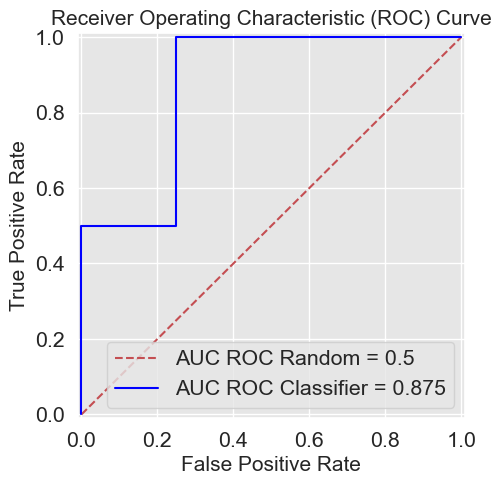

In [91]:
roc_curve

In [92]:
# 2 fraudulent and 8 genuine transactions
true_labels = [1,1,0,0,0,0,0,0,0,0]

# Probability of fraud for each transaction
fraud_probabilities = [0.5]*10

FPR_list, TPR_list, threshold = metrics.roc_curve(true_labels, fraud_probabilities, drop_intermediate=False)
FPR_list, TPR_list, threshold

(array([0., 1.]), array([0., 1.]), array([1.5, 0.5]))

In [93]:
%%capture

ROC_AUC = metrics.auc(FPR_list, TPR_list)    
    
roc_curve, ax = plt.subplots(figsize=(5,5))
get_template_roc_curve(ax, "Receiver Operating Characteristic (ROC) Curve\n Random classifier",fs=15,random=False)
ax.plot(FPR_list, TPR_list, 'b', color='blue', label = 'AUC ROC Classifier = {0:0.3f}'.format(ROC_AUC))
ax.legend(loc = 'lower right')

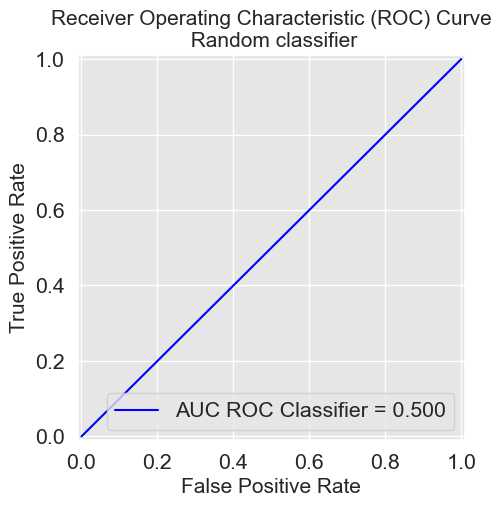

In [94]:
roc_curve

In [95]:
# Load data from the 2018-07-25 to the 2018-08-14

DIR_INPUT='./simulated-data-transformed/data' 

BEGIN_DATE = "2018-07-25"
END_DATE = "2018-08-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))


start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=delta_delay=delta_test=7

(train_df,test_df)=get_train_test_set(transactions_df,start_date_training,
                                      delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

classifiers_dictionary={'Logistic regression':sklearn.linear_model.LogisticRegression(random_state=0), 
                        'Decision tree with depth of two':sklearn.tree.DecisionTreeClassifier(max_depth=2,random_state=0), 
                        'Decision tree - unlimited depth':sklearn.tree.DecisionTreeClassifier(random_state=0), 
                        'Random forest':sklearn.ensemble.RandomForestClassifier(random_state=0,n_jobs=-1),
                        'XGBoost':xgboost.XGBClassifier(random_state=0,n_jobs=-1),
                       }

fitted_models_and_predictions_dictionary={}

for classifier_name in classifiers_dictionary:
    
    start_time=time.time()
    model_and_predictions = fit_model_and_get_predictions(classifiers_dictionary[classifier_name], train_df, test_df, 
                                                          input_features=input_features,
                                                          output_feature=output_feature)
    
    print("Time to fit the "+classifier_name+" model: "+str(round(time.time()-start_time,2)))
    
    fitted_models_and_predictions_dictionary[classifier_name]=model_and_predictions
    

Load  files
CPU times: total: 141 ms
Wall time: 225 ms
201295 transactions loaded, containing 1792 fraudulent transactions
Time to fit the Logistic regression model: 0.36
Time to fit the Decision tree with depth of two model: 0.3
Time to fit the Decision tree - unlimited depth model: 1.71
Time to fit the Random forest model: 3.13
Time to fit the XGBoost model: 3.04


In [96]:
%%capture
roc_curve, ax = plt.subplots(1, 1, figsize=(5,5))

cmap = plt.get_cmap('jet')
colors={'Logistic regression':cmap(0), 'Decision tree with depth of two':cmap(200), 
        'Decision tree - unlimited depth':cmap(250),
        'Random forest':cmap(70), 'XGBoost':cmap(40)}

get_template_roc_curve(ax,title='Receiver Operating Characteristic Curve\nTest data',fs=15)
    
for classifier_name in classifiers_dictionary:
    
    model_and_predictions=fitted_models_and_predictions_dictionary[classifier_name]

    FPR_list, TPR_list, threshold = metrics.roc_curve(test_df[output_feature], model_and_predictions['predictions_test'])
    ROC_AUC = metrics.auc(FPR_list, TPR_list)

    ax.plot(FPR_list, TPR_list, 'b', color=colors[classifier_name], label = 'AUC ROC {0}= {1:0.3f}'.format(classifier_name,ROC_AUC))
    ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1))
    

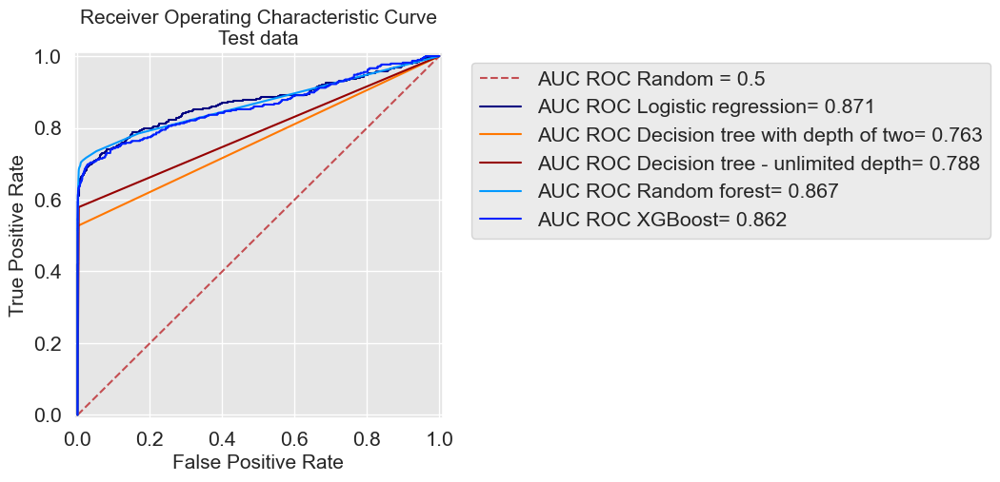

In [97]:
roc_curve

In [98]:
test_df[test_df.TX_FRAUD==0].shape

(57879, 23)

In [99]:
test_df[test_df.TX_FRAUD==1].shape

(385, 23)

In [100]:
# 2 fraudulent and 8 genuine transactions
true_labels = [1,1,0,0,0,0,0,0,0,0]

# Probability of fraud for each transaction
fraud_probabilities = [0.9,0.35,0.45,0.4,0.2,0.2,0.2,0.1,0.1,0]

unique_thresholds = [1.1]+list(set(fraud_probabilities))
unique_thresholds.sort(reverse=True)

performance_metrics=threshold_based_metrics(fraud_probabilities, true_labels, unique_thresholds)
performance_metrics[['Threshold','Precision','TPR']]

,Threshold,Precision,TPR
0,1.10,1.000000,0.0
1,0.90,1.000000,0.5
2,0.45,0.500000,0.5
3,0.40,0.333333,0.5
4,0.35,0.500000,1.0
5,0.20,0.285714,1.0
6,0.10,0.222222,1.0
7,0.00,0.200000,1.0


In [101]:
def compute_AP(precision, recall):
    
    AP = 0
    
    n_thresholds = len(precision)
    
    for i in range(1, n_thresholds):
        
        if recall[i]-recall[i-1]>=0:
            
            AP = AP+(recall[i]-recall[i-1])*precision[i]
        
    return AP

In [102]:
%%capture
def get_template_pr_curve(ax, title,fs, baseline=0.5):
    ax.set_title(title, fontsize=fs)
    ax.set_xlim([-0.01, 1.01])
    ax.set_ylim([-0.01, 1.01])
    
    ax.set_xlabel('Recall (True Positive Rate)', fontsize=fs)
    ax.set_ylabel('Precision', fontsize=fs)
    
    ax.plot([0, 1], [baseline, baseline],'r--',label='AP Random = {0:0.3f}'.format(baseline))

precision = performance_metrics.Precision.values
recall = performance_metrics.TPR.values
    
pr_curve, ax = plt.subplots(figsize=(5,5))
get_template_pr_curve(ax, "Precision Recall (PR) Curve",fs=15,baseline=sum(true_labels)/len(true_labels))
AP2 = metrics.average_precision_score(true_labels, fraud_probabilities)
AP = compute_AP(precision, recall)
ax.step(recall, precision, 'b', color='blue', label = 'AP Classifier = {0:0.3f}'.format(AP))
ax.legend(loc = 'lower right')

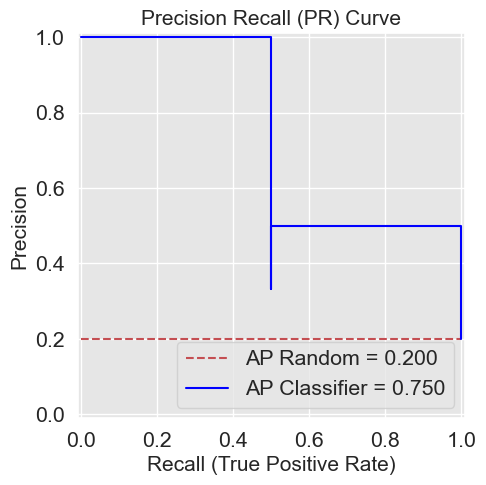

In [103]:
pr_curve

In [104]:
%%capture
pr_curve, ax = plt.subplots(1, 1, figsize=(6,6))
cmap = plt.get_cmap('jet')
colors={'Logistic regression':cmap(0), 'Decision tree with depth of two':cmap(200), 
        'Decision tree - unlimited depth':cmap(250),
        'Random forest':cmap(70), 'XGBoost':cmap(40)}

get_template_pr_curve(ax, "Precision Recall (PR) Curve\nTest data",fs=15,baseline=sum(test_df[output_feature])/len(test_df[output_feature]))
    
for classifier_name in classifiers_dictionary:
    
    model_and_predictions=fitted_models_and_predictions_dictionary[classifier_name]

    precision, recall, threshold = metrics.precision_recall_curve(test_df[output_feature], model_and_predictions['predictions_test'])
    precision=precision[::-1]
    recall=recall[::-1]
    
    AP = metrics.average_precision_score(test_df[output_feature], model_and_predictions['predictions_test'])
    
    ax.step(recall, precision, 'b', color=colors[classifier_name], label = 'AP {0}= {1:0.3f}'.format(classifier_name,AP))
    ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1))
    
    
plt.subplots_adjust(wspace=0.5, hspace=0.8)

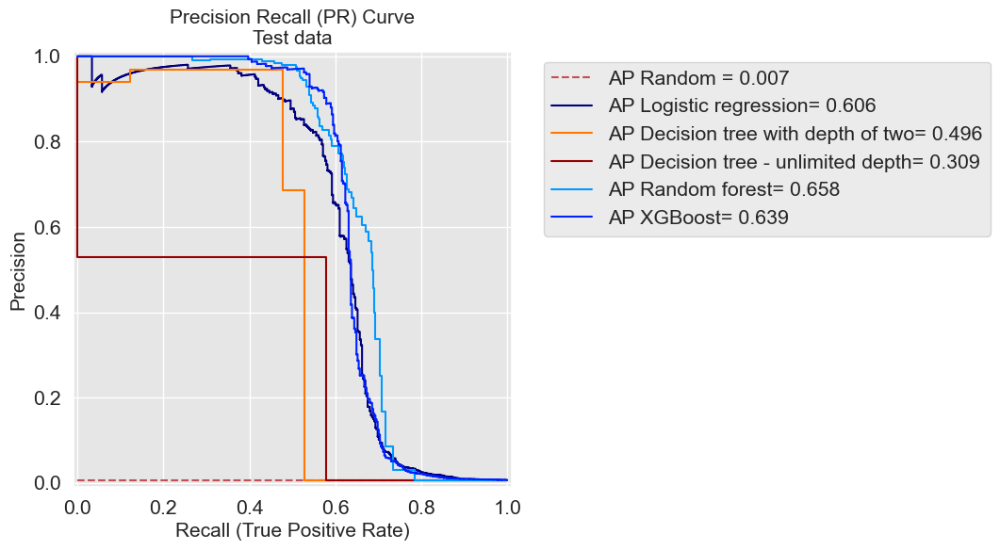

In [105]:
pr_curve

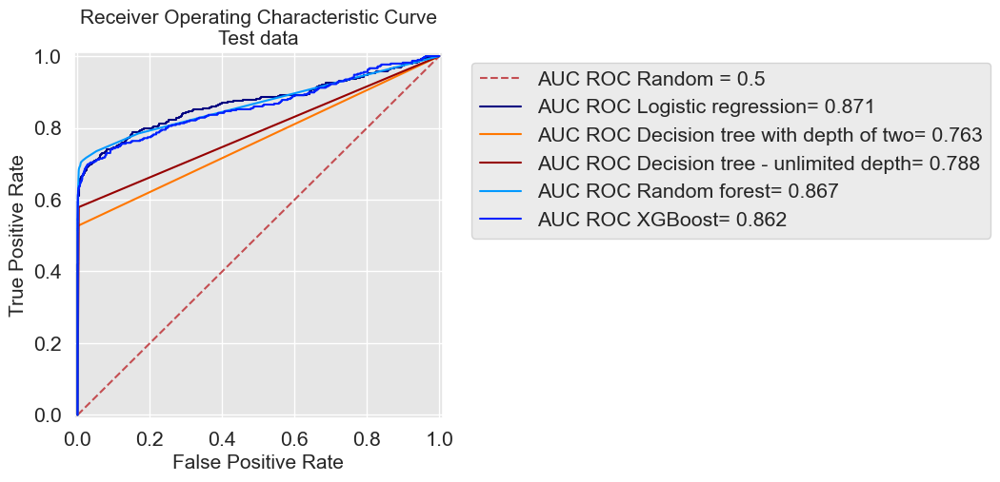

In [106]:
roc_curve

In [107]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed
        

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:04 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:05 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:06 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:07 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:09 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:10 --:--:--     0
  0     0    0     0    0     0      0      0 --:--

<Figure size 640x480 with 0 Axes>

In [108]:
# Load data from the 2018-07-25 to the 2018-08-14

DIR_INPUT='./simulated-data-transformed/data/' 

BEGIN_DATE = "2018-07-25"
END_DATE = "2018-08-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=delta_delay=delta_test=7

(train_df,test_df)=get_train_test_set(transactions_df,start_date_training,
                                      delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df, 
                                                                 input_features, output_feature)    

Load  files
CPU times: total: 141 ms
Wall time: 262 ms
201295 transactions loaded, containing 1792 fraudulent transactions


In [109]:
assert len(model_and_predictions_dictionary['predictions_test'])==len(test_df)

In [110]:
predictions_df=test_df
predictions_df['predictions']=model_and_predictions_dictionary['predictions_test']
predictions_df[['TRANSACTION_ID','TX_DATETIME','CUSTOMER_ID','TERMINAL_ID','TX_AMOUNT','TX_TIME_DAYS','TX_FRAUD','predictions']].head()

,TRANSACTION_ID,TX_DATETIME,CUSTOMER_ID,TERMINAL_ID,TX_AMOUNT,TX_TIME_DAYS,TX_FRAUD,predictions
134215,1236698,2018-08-08 00:01:14,2765,2747,-0.266899,129,0,0.003536
134216,1236699,2018-08-08 00:02:33,714,2073,1.295440,129,0,0.003536
134218,1236701,2018-08-08 00:08:40,4982,1258,-0.650902,129,0,0.003536
134219,1236702,2018-08-08 00:08:41,704,8501,0.290249,129,0,0.003536
134220,1236703,2018-08-08 00:10:34,3085,4208,0.039070,129,0,0.003536


In [111]:
def precision_top_k_day(df_day, top_k=100):
    
    # Order transactions by decreasing probabilities of frauds
    df_day = df_day.sort_values(by="predictions", ascending=False).reset_index(drop=False)
        
    # Get the top k most suspicious transactions
    df_day_top_k=df_day.head(top_k)
    list_detected_fraudulent_transactions=list(df_day_top_k[df_day_top_k.TX_FRAUD==1].TRANSACTION_ID)
    
    # Compute precision top k
    precision_top_k = len(list_detected_fraudulent_transactions) / top_k
    
    return list_detected_fraudulent_transactions, precision_top_k


day=129

df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
df_day = df_day[['TRANSACTION_ID','CUSTOMER_ID', 'TX_FRAUD', 'predictions']]

_, precision_top_k= precision_top_k_day(df_day=df_day, top_k=100)
precision_top_k

0.26

In [112]:
df_day.TX_FRAUD.sum()

55

In [113]:
def precision_top_k(predictions_df, top_k=100):

    # Sort days by increasing order
    list_days=list(predictions_df['TX_TIME_DAYS'].unique())
    list_days.sort()
    
    precision_top_k_per_day_list = []
    nb_fraudulent_transactions_per_day = []
    
    # For each day, compute precision top k
    for day in list_days:
        
        df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
        df_day = df_day[['TRANSACTION_ID', 'CUSTOMER_ID', 'TX_FRAUD', 'predictions']]
        
        nb_fraudulent_transactions_per_day.append(len(df_day[df_day.TX_FRAUD==1]))
        
        _, _precision_top_k = precision_top_k_day(df_day, top_k=top_k)
        
        precision_top_k_per_day_list.append(_precision_top_k)
        
    # Compute the mean
    mean_precision_top_k = np.round(np.array(precision_top_k_per_day_list).mean(),3)
    
    # Returns number of fraudulent transactions per day,
    # precision top k per day, and resulting mean
    return nb_fraudulent_transactions_per_day,precision_top_k_per_day_list,mean_precision_top_k

In [114]:
nb_fraudulent_transactions_per_day_remaining,\
precision_top_k_per_day_list,\
mean_precision_top_k = precision_top_k(predictions_df=predictions_df, top_k=100)

print("Number of remaining fraudulent transactions: "+str(nb_fraudulent_transactions_per_day_remaining))
print("Precision top-k: "+str(precision_top_k_per_day_list))
print("Average Precision top-k: "+str(mean_precision_top_k))

Number of remaining fraudulent transactions: [55, 60, 56, 56, 59, 58, 41]
Precision top-k: [0.26, 0.35, 0.26, 0.33, 0.3, 0.35, 0.19]
Average Precision top-k: 0.291


In [115]:
# Compute the number of transactions per day, 
#fraudulent transactions per day and fraudulent cards per day
tx_stats=get_tx_stats(transactions_df, start_date_df="2018-04-01")

# Add the remaining number of fraudulent transactions for the last 7 days (test period)
tx_stats.loc[14:20,'nb_fraudulent_transactions_per_day_remaining']=list(nb_fraudulent_transactions_per_day_remaining)
# Add precision top k for the last 7 days (test period) 
tx_stats.loc[14:20,'precision_top_k_per_day']=precision_top_k_per_day_list

In [116]:
%%capture

# Plot the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

cmap = plt.get_cmap('jet')
colors={'precision_top_k_per_day':cmap(0), 
        'nb_fraudulent_transactions_per_day':cmap(200),
        'nb_fraudulent_transactions_per_day_remaining':cmap(250),
       }

fraud_and_transactions_stats_fig, ax = plt.subplots(1, 1, figsize=(15,8))

# Training period
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = 7

end_date_training = start_date_training+datetime.timedelta(days=delta_train-1)

# Test period
start_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay)
end_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay+delta_test-1)

get_template_tx_stats(ax, fs=20,
                      start_date_training=start_date_training,
                      title='Number of fraudulent transactions per day \n and number of detected fraudulent transactions',
                      delta_train=delta_train,
                      delta_delay=delta_delay,
                      delta_test=delta_test,
                      ylim=150
                     )

ax.plot(tx_stats['tx_date'], tx_stats['nb_fraudulent_transactions_per_day'], 'b', color=colors['nb_fraudulent_transactions_per_day'], label = '# fraudulent txs per day - Original')
ax.plot(tx_stats['tx_date'], tx_stats['nb_fraudulent_transactions_per_day_remaining'], 'b', color=colors['nb_fraudulent_transactions_per_day_remaining'], label = '# fraudulent txs per day - Remaining')
ax.plot(tx_stats['tx_date'], tx_stats['precision_top_k_per_day']*100, 'b', color=colors['precision_top_k_per_day'], label = '# detected fraudulent txs per day')
ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1),fontsize=20)
    

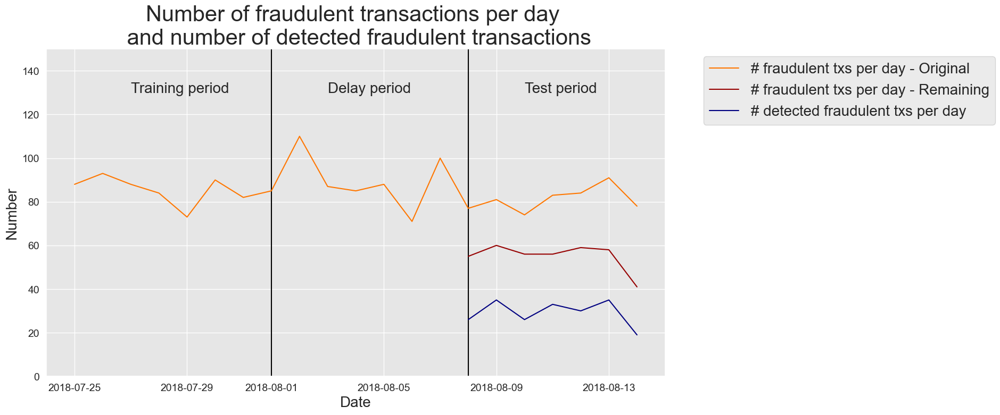

In [117]:
fraud_and_transactions_stats_fig

In [118]:
def card_precision_top_k_day(df_day, top_k):
    
    # This takes the max of the predictions AND the max of label TX_FRAUD for each CUSTOMER_ID, 
    # and sorts by decreasing order of fraudulent prediction
    df_day = df_day.groupby('CUSTOMER_ID').max().sort_values(by="predictions", ascending=False).reset_index(drop=False)
    
    # Get the top k most suspicious cards
    df_day_top_k=df_day.head(top_k)
    list_detected_compromised_cards=list(df_day_top_k[df_day_top_k.TX_FRAUD==1].CUSTOMER_ID)
    
    # Compute precision top k
    card_precision_top_k = len(list_detected_compromised_cards) / top_k
    
    return list_detected_compromised_cards, card_precision_top_k

day=129

df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
df_day = df_day[['predictions', 'CUSTOMER_ID', 'TX_FRAUD']]

_,card_precision_top_k= card_precision_top_k_day(df_day=df_day, top_k=100)
card_precision_top_k

0.24

In [119]:
df_day.groupby('CUSTOMER_ID').max().TX_FRAUD.sum()

50

In [120]:
def card_precision_top_k(predictions_df, top_k):

    # Sort days by increasing order
    list_days=list(predictions_df['TX_TIME_DAYS'].unique())
    list_days.sort()
    
    card_precision_top_k_per_day_list = []
    nb_compromised_cards_per_day = []
    
    # For each day, compute precision top k
    for day in list_days:
        
        df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
        df_day = df_day[['predictions', 'CUSTOMER_ID', 'TX_FRAUD']]
        
        nb_compromised_cards_per_day.append(len(df_day[df_day.TX_FRAUD==1].CUSTOMER_ID.unique()))
        
        _, card_precision_top_k = card_precision_top_k_day(df_day,top_k)
        
        card_precision_top_k_per_day_list.append(card_precision_top_k)
        
    # Compute the mean
    mean_card_precision_top_k = np.array(card_precision_top_k_per_day_list).mean()
    
    # Returns precision top k per day as a list, and resulting mean
    return nb_compromised_cards_per_day,card_precision_top_k_per_day_list,mean_card_precision_top_k

In [121]:
nb_compromised_cards_per_day_remaining\
,card_precision_top_k_per_day_list\
,mean_card_precision_top_k=card_precision_top_k(predictions_df=predictions_df, top_k=100)

print("Number of remaining compromised cards: "+str(nb_compromised_cards_per_day_remaining))
print("Precision top-k: "+str(card_precision_top_k_per_day_list))
print("Average Precision top-k: "+str(mean_card_precision_top_k))

Number of remaining compromised cards: [50, 54, 51, 54, 55, 54, 38]
Precision top-k: [0.24, 0.35, 0.26, 0.32, 0.3, 0.34, 0.19]
Average Precision top-k: 0.2857142857142857


In [122]:
# Compute the number of transactions per day, 
# fraudulent transactions per day and fraudulent cards per day
tx_stats=get_tx_stats(transactions_df, start_date_df="2018-04-01")

# Add the remaining number of compromised cards for the last 7 days (test period)
tx_stats.loc[14:20,'nb_compromised_cards_per_day_remaining']=list(nb_compromised_cards_per_day_remaining)

# Add the card precision top k for the last 7 days (test period) 
tx_stats.loc[14:20,'card_precision_top_k_per_day']=card_precision_top_k_per_day_list

In [123]:
%%capture

# Plot the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

cmap = plt.get_cmap('jet')
colors={'card_precision_top_k_per_day':cmap(0), 
        'nb_compromised_cards_per_day':cmap(200),
        'nb_compromised_cards_per_day_remaining':cmap(250),
       }

fraud_and_transactions_stats_fig, ax = plt.subplots(1, 1, figsize=(15,8))

# Training period
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = 7

end_date_training = start_date_training+datetime.timedelta(days=delta_train-1)

# Test period
start_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay)
end_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay+delta_test-1)

get_template_tx_stats(ax, fs=20,
                      start_date_training=start_date_training,
                      title='Number of fraudulent transactions per day \n and number of detected fraudulent transactions',
                      delta_train=delta_train,
                      delta_delay=delta_delay,
                      delta_test=delta_test,
                      ylim=150
                     )

ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day'], 'b', color=colors['nb_compromised_cards_per_day'], label = '# fraudulent txs per day - Original')
ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day_remaining'], 'b', color=colors['nb_compromised_cards_per_day_remaining'], label = '# compromised cards per day - Remaining')
ax.plot(tx_stats['tx_date'], tx_stats['card_precision_top_k_per_day']*100, 'b', color=colors['card_precision_top_k_per_day'], label = '# detected compromised cards per day')
ax.legend(loc = 'upper left', bbox_to_anchor=(1.05, 1), fontsize=20)
    

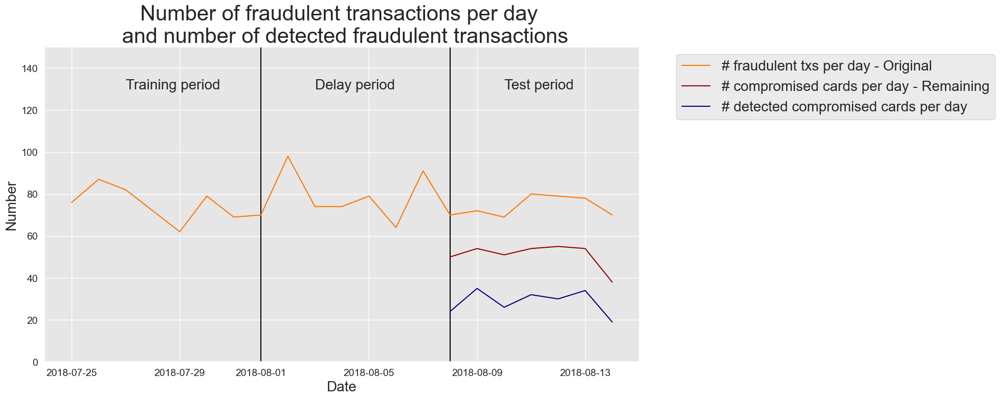

In [124]:
fraud_and_transactions_stats_fig

In [125]:
def card_precision_top_k(predictions_df, top_k, remove_detected_compromised_cards=True):

    # Sort days by increasing order
    list_days=list(predictions_df['TX_TIME_DAYS'].unique())
    list_days.sort()
    
    # At first, the list of detected compromised cards is empty
    list_detected_compromised_cards = []
    
    card_precision_top_k_per_day_list = []
    nb_compromised_cards_per_day = []
    
    # For each day, compute precision top k
    for day in list_days:
        
        df_day = predictions_df[predictions_df['TX_TIME_DAYS']==day]
        df_day = df_day[['predictions', 'CUSTOMER_ID', 'TX_FRAUD']]
        
        # Let us remove detected compromised cards from the set of daily transactions
        df_day = df_day[df_day.CUSTOMER_ID.isin(list_detected_compromised_cards)==False]
        
        nb_compromised_cards_per_day.append(len(df_day[df_day.TX_FRAUD==1].CUSTOMER_ID.unique()))
        
        detected_compromised_cards, card_precision_top_k = card_precision_top_k_day(df_day,top_k)
        
        card_precision_top_k_per_day_list.append(card_precision_top_k)
        
        # Let us update the list of detected compromised cards
        if remove_detected_compromised_cards:
            list_detected_compromised_cards.extend(detected_compromised_cards)
        
    # Compute the mean
    mean_card_precision_top_k = np.array(card_precision_top_k_per_day_list).mean()
    
    # Returns precision top k per day as a list, and resulting mean
    return nb_compromised_cards_per_day,card_precision_top_k_per_day_list,mean_card_precision_top_k

In [126]:
nb_compromised_cards_per_day_remaining\
,card_precision_top_k_per_day_list\
,mean_card_precision_top_k=card_precision_top_k(predictions_df=predictions_df, top_k=100)

print("Number of remaining compromised cards: "+str(nb_compromised_cards_per_day_remaining))
print("Precision top-k: "+str(card_precision_top_k_per_day_list))
print("Average Precision top-k: "+str(mean_card_precision_top_k))

Number of remaining compromised cards: [50, 50, 49, 47, 46, 44, 31]
Precision top-k: [0.24, 0.32, 0.27, 0.25, 0.23, 0.26, 0.12]
Average Precision top-k: 0.2414285714285714


In [127]:
# Compute the number of transactions per day, 
#fraudulent transactions per day and fraudulent cards per day
tx_stats=get_tx_stats(transactions_df, start_date_df="2018-04-01")

# Add the remaining number of compromised cards for the last 7 days (test period)
tx_stats.loc[14:20,'nb_compromised_cards_per_day_remaining']=list(nb_compromised_cards_per_day_remaining)

# Add the card precision top k for the last 7 days (test period) 
tx_stats.loc[14:20,'card_precision_top_k_per_day']=card_precision_top_k_per_day_list

In [128]:
%%capture

# Plot the number of transactions per day, fraudulent transactions per day and fraudulent cards per day

cmap = plt.get_cmap('jet')
colors={'card_precision_top_k_per_day':cmap(0), 
        'nb_compromised_cards_per_day':cmap(200),
        'nb_compromised_cards_per_day_remaining':cmap(250),
       }

fraud_and_transactions_stats_fig, ax = plt.subplots(1, 1, figsize=(15,8))

# Training period
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = 7

end_date_training = start_date_training+datetime.timedelta(days=delta_train-1)

# Test period
start_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay)
end_date_test = start_date_training+datetime.timedelta(days=delta_train+delta_delay+delta_test-1)

get_template_tx_stats(ax, fs=20,
                      start_date_training=start_date_training,
                      title='Number of fraudulent transactions per day \n and number of detected fraudulent transactions',
                      delta_train=delta_train,
                      delta_delay=delta_delay,
                      delta_test=delta_test,
                      ylim=150
                     )

ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day'], 'b', color=colors['nb_compromised_cards_per_day'], label = '# compromised cards per day - Original')
ax.plot(tx_stats['tx_date'], tx_stats['nb_compromised_cards_per_day_remaining'], 'b', color=colors['nb_compromised_cards_per_day_remaining'], label = '# compromised cards per day - Remaining')
ax.plot(tx_stats['tx_date'], tx_stats['card_precision_top_k_per_day']*100, 'b', color=colors['card_precision_top_k_per_day'], label = '# detected compromised compromised cards per day')

ax.legend(loc = 'upper left',bbox_to_anchor=(1.05, 1),fontsize=20)

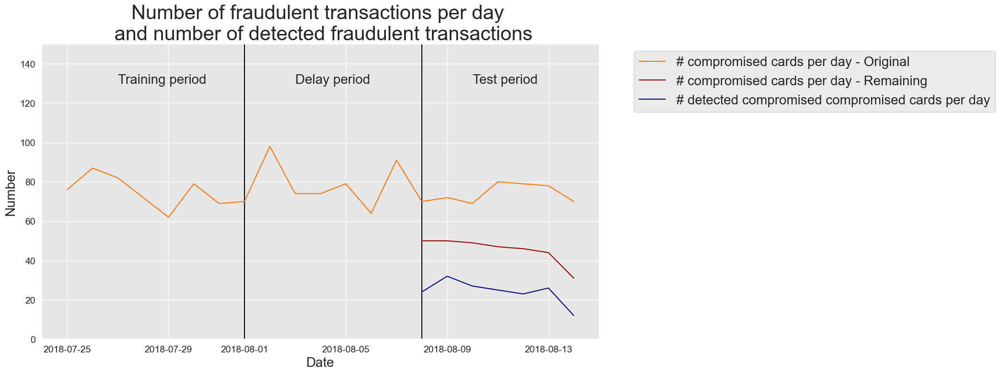

In [129]:
fraud_and_transactions_stats_fig

In [130]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed
        

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:04 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:05 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:06 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:07 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:08 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:09 --:--:--     0
  0     0    0     0    0     0      0      0 --:--

<Figure size 640x480 with 0 Axes>

In [131]:
# Note: We load more data than three weeks, as the experiments in the next sections
# will require up to three months of data

# Load data from the 2018-06-11 to the 2018-09-14

DIR_INPUT='simulated-data-transformed/data/' 

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

Load  files
CPU times: total: 641 ms
Wall time: 1.82 s
919767 transactions loaded, containing 8195 fraudulent transactions


In [132]:
# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7

In [133]:
def get_performances_train_test_sets(transactions_df, classifier,
                                     input_features, output_feature,
                                     start_date_training, 
                                     delta_train=7, delta_delay=7, delta_test=7,
                                     top_k_list=[100],
                                     type_test="Test", parameter_summary=""):

    # Get the training and test sets
    (train_df, test_df)=get_train_test_set(transactions_df,start_date_training,
                                           delta_train=delta_train,
                                           delta_delay=delta_delay,
                                           delta_test=delta_test)
    
    # Fit model
    start_time=time.time() 
    model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df, 
                                                                     input_features, output_feature)
    execution_time=time.time()-start_time
    
    # Compute fraud detection performances
    test_df['predictions']=model_and_predictions_dictionary['predictions_test']
    performances_df_test=performance_assessment(test_df, top_k_list=top_k_list)
    performances_df_test.columns=performances_df_test.columns.values+' '+type_test
    
    train_df['predictions']=model_and_predictions_dictionary['predictions_train']
    performances_df_train=performance_assessment(train_df, top_k_list=top_k_list)
    performances_df_train.columns=performances_df_train.columns.values+' Train'
    
    performances_df=pd.concat([performances_df_test,performances_df_train],axis=1)
    
    performances_df['Execution time']=execution_time
    performances_df['Parameters summary']=parameter_summary
    
    return performances_df

In [134]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=2, random_state=0)

performances_df=get_performances_train_test_sets(transactions_df, classifier, 
                                                 input_features, output_feature,
                                                 start_date_training=start_date_training, 
                                                 delta_train=delta_train, 
                                                 delta_delay=delta_delay, 
                                                 delta_test=delta_test,
                                                 parameter_summary=2
                                                )

In [135]:
performances_df

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.763,0.496,0.241,0.802,0.586,0.394,0.271536,2


In [136]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

performances_df=pd.DataFrame()

for max_depth in list_params:
    
    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df=performances_df.append(
        get_performances_train_test_sets(transactions_df, classifier, 
                                         input_features, output_feature, 
                                         start_date_training=start_date_training, 
                                         delta_train=delta_train, 
                                         delta_delay=delta_delay, 
                                         delta_test=delta_test,            
                                         parameter_summary=max_depth
                           )
    )
    
performances_df.reset_index(inplace=True,drop=True)

In [137]:
performances_df

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.763,0.496,0.241,0.802,0.586,0.394,0.290100,2
1,0.795,0.562,0.267,0.815,0.615,0.409,0.358124,3
2,0.802,0.570,0.269,0.829,0.635,0.411,0.444302,4
3,0.814,0.581,0.280,0.835,0.649,0.419,0.504972,5
4,0.817,0.588,0.280,0.842,0.662,0.421,0.554615,6
5,0.793,0.542,0.254,0.876,0.679,0.427,0.642510,7
6,0.786,0.546,0.257,0.884,0.717,0.436,0.705541,8
7,0.756,0.499,0.246,0.896,0.737,0.437,0.781584,9
8,0.750,0.484,0.244,0.901,0.756,0.440,0.828277,10
9,0.739,0.392,0.243,0.974,0.907,0.506,1.081861,20


In [138]:
# Get the performance plot for a single performance metric
def get_performance_plot(performances_df, 
                         ax, 
                         performance_metric, 
                         expe_type_list=['Test','Train'], 
                         expe_type_color_list=['#008000','#2F4D7E'],
                         parameter_name="Tree maximum depth",
                         summary_performances=None):
    
    # expe_type_list is the list of type of experiments, typically containing 'Test', 'Train', or 'Valid'
    # For all types of experiments
    for i in range(len(expe_type_list)):
    
        # Column in performances_df for which to retrieve the data 
        performance_metric_expe_type=performance_metric+' '+expe_type_list[i]
    
        # Plot data on graph
        ax.plot(performances_df['Parameters summary'], performances_df[performance_metric_expe_type], 
                color=expe_type_color_list[i], label = expe_type_list[i])
        
        # If performances_df contains confidence intervals, add them to the graph
        if performance_metric_expe_type+' Std' in performances_df.columns:
        
            conf_min = performances_df[performance_metric_expe_type]\
                        -2*performances_df[performance_metric_expe_type+' Std']
            conf_max = performances_df[performance_metric_expe_type]\
                        +2*performances_df[performance_metric_expe_type+' Std']
    
            ax.fill_between(performances_df['Parameters summary'], conf_min, conf_max, color=expe_type_color_list[i], alpha=.1)

    # If summary_performances table is present, adds vertical dashed bar for best estimated parameter 
    if summary_performances is not None:
        best_estimated_parameter=summary_performances[performance_metric][['Best estimated parameters ($k^*$)']].values[0]
        best_estimated_performance=float(summary_performances[performance_metric][['Validation performance']].values[0].split("+/-")[0])
        ymin, ymax = ax.get_ylim()
        ax.vlines(best_estimated_parameter, ymin, best_estimated_performance,
                  linestyles="dashed")
    
    # Set title, and x and y axes labels
    ax.set_title(performance_metric+'\n', fontsize=14)
    ax.set(xlabel = parameter_name, ylabel=performance_metric)

# Get the performance plots for a set of performance metric
def get_performances_plots(performances_df, 
                           performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                           expe_type_list=['Test','Train'], expe_type_color_list=['#008000','#2F4D7E'],
                           parameter_name="Tree maximum depth",
                           summary_performances=None):
    
    # Create as many graphs as there are performance metrics to display
    n_performance_metrics = len(performance_metrics_list)
    fig, ax = plt.subplots(1, n_performance_metrics, figsize=(5*n_performance_metrics,4))
    
    # Plot performance metric for each metric in performance_metrics_list
    for i in range(n_performance_metrics):
    
        get_performance_plot(performances_df, ax[i], performance_metric=performance_metrics_list[i], 
                             expe_type_list=expe_type_list, 
                             expe_type_color_list=expe_type_color_list,
                             parameter_name=parameter_name,
                             summary_performances=summary_performances)
    
    ax[n_performance_metrics-1].legend(loc='upper left', 
                                       labels=expe_type_list, 
                                       bbox_to_anchor=(1.05, 1),
                                       title="Type set")

    plt.subplots_adjust(wspace=0.5, 
                        hspace=0.8)

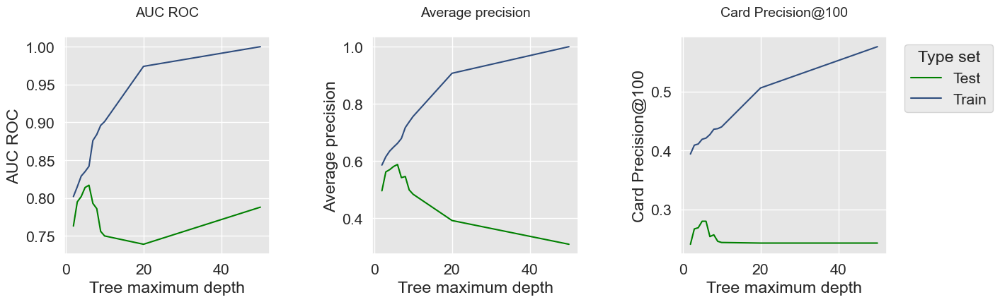

In [139]:
get_performances_plots(performances_df, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Train'],expe_type_color_list=['#008000','#2F4D7E'])

In [140]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

delta_valid = delta_test

start_date_training_with_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))

performances_df_validation=get_performances_train_test_sets(transactions_df, 
                                                            classifier, 
                                                            input_features, output_feature,
                                                            start_date_training=start_date_training_with_valid, 
                                                            delta_train=delta_train, 
                                                            delta_delay=delta_delay, 
                                                            delta_test=delta_test,
                                                            type_test='Validation', parameter_summary='2')

In [141]:
performances_df_validation

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.775,0.524,0.243,0.791,0.577,0.399,0.251622,2


In [142]:
performances_df[:1]

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.763,0.496,0.241,0.802,0.586,0.394,0.2901,2


In [143]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

performances_df_validation=pd.DataFrame()

for max_depth in list_params:
    
    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df_validation=performances_df_validation.append(
        get_performances_train_test_sets(transactions_df, 
                                         classifier,
                                         input_features, output_feature,
                                         start_date_training=start_date_training_with_valid, 
                                         delta_train=delta_train, 
                                         delta_delay=delta_delay, 
                                         delta_test=delta_test, 
                                         type_test='Validation', parameter_summary=max_depth
                                        )
    )
    
performances_df_validation.reset_index(inplace=True,drop=True)

In [144]:
performances_df_validation

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.775,0.524,0.243,0.791,0.577,0.399,0.251777,2
1,0.778,0.538,0.247,0.803,0.604,0.413,0.266510,3
2,0.784,0.535,0.249,0.815,0.624,0.419,0.332804,4
3,0.791,0.533,0.257,0.824,0.642,0.430,0.392337,5
4,0.798,0.532,0.257,0.835,0.659,0.431,0.421875,6
5,0.804,0.537,0.256,0.848,0.671,0.434,0.486897,7
6,0.796,0.524,0.253,0.850,0.691,0.437,0.531463,8
7,0.781,0.473,0.249,0.852,0.699,0.437,0.578237,9
8,0.802,0.466,0.251,0.879,0.706,0.439,0.642644,10
9,0.775,0.445,0.259,0.967,0.849,0.481,1.081587,20


In [145]:
performances_df_validation['AUC ROC Test']=performances_df['AUC ROC Test']
performances_df_validation['Average precision Test']=performances_df['Average precision Test']
performances_df_validation['Card Precision@100 Test']=performances_df['Card Precision@100 Test']

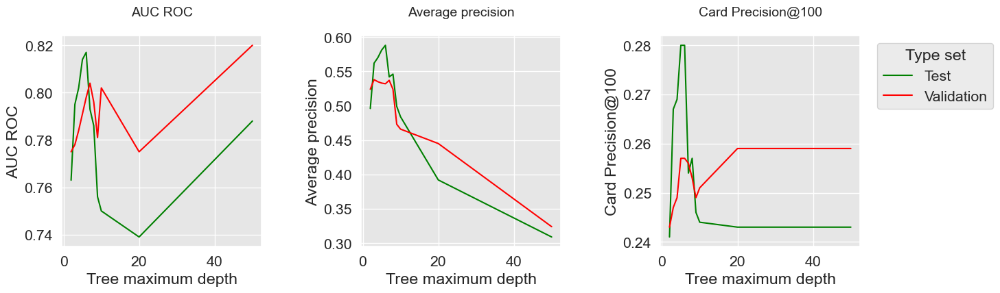

In [146]:
get_performances_plots(performances_df_validation, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'],expe_type_color_list=['#008000','#FF0000'])

In [147]:
def repeated_holdout_validation(transactions_df, classifier, 
                                start_date_training, 
                                delta_train=7, delta_delay=7, delta_test=7,
                                n_folds=4,
                                sampling_ratio=0.7,
                                top_k_list=[100],
                                type_test="Test", parameter_summary=""):

    performances_df_folds=pd.DataFrame()
    
    start_time=time.time() 
    
    for fold in range(n_folds):
        
        # Get the training and test sets
        (train_df, test_df)=get_train_test_set(transactions_df,
                                               start_date_training,
                                               delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test,
                                               sampling_ratio=sampling_ratio,
                                               random_state=fold)
    
        
        # Fit model  
        model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df, 
                                                                         input_features, output_feature)
        
        # Compute fraud detection performances
        test_df['predictions']=model_and_predictions_dictionary['predictions_test']
        performances_df_test=performance_assessment(test_df, top_k_list=top_k_list)
        performances_df_test.columns=performances_df_test.columns.values+' '+type_test
        
        train_df['predictions']=model_and_predictions_dictionary['predictions_train']
        performances_df_train=performance_assessment(train_df, top_k_list=top_k_list)
        performances_df_train.columns=performances_df_train.columns.values+' Train'
    
        performances_df_folds=performances_df_folds.append(pd.concat([performances_df_test,performances_df_train],axis=1))
    
    execution_time=time.time()-start_time
    
    performances_df_folds_mean=performances_df_folds.mean()
    performances_df_folds_std=performances_df_folds.std(ddof=0)
    
    performances_df_folds_mean=pd.DataFrame(performances_df_folds_mean).transpose()
    performances_df_folds_std=pd.DataFrame(performances_df_folds_std).transpose()
    performances_df_folds_std.columns=performances_df_folds_std.columns.values+" Std"
    performances_df=pd.concat([performances_df_folds_mean,performances_df_folds_std],axis=1)
    
    performances_df['Execution time']=execution_time
    
    performances_df['Parameters summary']=parameter_summary
    
    return performances_df, performances_df_folds

In [148]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

performances_df_repeated_holdout_summary, \
performances_df_repeated_holdout_folds=repeated_holdout_validation(
    transactions_df, classifier, 
    start_date_training=start_date_training_with_valid, 
    delta_train=delta_train, 
    delta_delay=delta_delay, 
    delta_test=delta_test, 
    n_folds=4,
    sampling_ratio=0.7,
    type_test="Validation", parameter_summary='2'
)

In [149]:
performances_df_repeated_holdout_summary

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.776,0.51875,0.24475,0.79475,0.57575,0.2985,0.001225,0.006495,0.001785,0.003961,0.008871,0.009341,1.609191,2


In [150]:
performances_df_repeated_holdout_folds

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train
0,0.778,0.514,0.247,0.797,0.569,0.311
0,0.776,0.511,0.246,0.798,0.572,0.304
0,0.775,0.523,0.243,0.788,0.571,0.289
0,0.775,0.527,0.243,0.796,0.591,0.290


In [151]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

performances_df_repeated_holdout=pd.DataFrame()

start_time=time.time()

for max_depth in list_params:
    
    print("Computing performances for a decision tree with max_depth="+str(max_depth))
    
    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df_repeated_holdout=performances_df_repeated_holdout.append(
        repeated_holdout_validation(
            transactions_df, classifier, 
            start_date_training=start_date_training_with_valid, 
            delta_train=delta_train, 
            delta_delay=delta_delay, 
            delta_test=delta_test,
            n_folds=4,
            sampling_ratio=0.7,
            type_test="Validation", parameter_summary=max_depth
        )[0]
    )
    
performances_df_repeated_holdout.reset_index(inplace=True,drop=True)

print("Total execution time: "+str(round(time.time()-start_time,2))+"s")

Computing performances for a decision tree with max_depth=2
Computing performances for a decision tree with max_depth=3
Computing performances for a decision tree with max_depth=4
Computing performances for a decision tree with max_depth=5
Computing performances for a decision tree with max_depth=6
Computing performances for a decision tree with max_depth=7
Computing performances for a decision tree with max_depth=8
Computing performances for a decision tree with max_depth=9
Computing performances for a decision tree with max_depth=10
Computing performances for a decision tree with max_depth=20
Computing performances for a decision tree with max_depth=50
Total execution time: 27.56s


In [152]:
performances_df_repeated_holdout

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.77600,0.51875,0.24475,0.79475,0.57575,0.29850,0.001225,0.006495,0.001785,0.003961,0.008871,0.009341,1.451334,2
1,0.78200,0.53800,0.24900,0.80650,0.60525,0.30675,0.002449,0.003937,0.001414,0.002958,0.003832,0.007189,1.641153,3
2,0.78550,0.54100,0.25125,0.81425,0.62325,0.31075,0.006185,0.007649,0.006180,0.004969,0.006220,0.007790,1.829176,4
3,0.78200,0.52900,0.24825,0.82025,0.63625,0.31175,0.008515,0.014036,0.003700,0.007529,0.009575,0.008871,1.973212,5
4,0.78350,0.51725,0.25225,0.82875,0.64800,0.31825,0.007018,0.006300,0.005761,0.007395,0.008062,0.006759,2.165857,6
5,0.78450,0.51725,0.25175,0.83825,0.66375,0.32250,0.005025,0.015833,0.003491,0.002773,0.010779,0.005500,2.284595,7
6,0.78700,0.51150,0.25125,0.84625,0.67950,0.32400,0.009274,0.020267,0.002681,0.002861,0.003905,0.006285,2.396886,8
7,0.78400,0.50150,0.24850,0.85625,0.69000,0.32625,0.010700,0.024005,0.003841,0.011584,0.005244,0.005890,2.626491,9
8,0.79675,0.49800,0.25075,0.87400,0.70425,0.33000,0.015352,0.024321,0.003112,0.009192,0.007562,0.008832,2.672554,10
9,0.80125,0.45425,0.26300,0.97150,0.86500,0.37025,0.014289,0.030938,0.004637,0.008789,0.016837,0.011099,3.996946,20


In [153]:
performances_df

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.763,0.496,0.241,0.802,0.586,0.394,0.290100,2
1,0.795,0.562,0.267,0.815,0.615,0.409,0.358124,3
2,0.802,0.570,0.269,0.829,0.635,0.411,0.444302,4
3,0.814,0.581,0.280,0.835,0.649,0.419,0.504972,5
4,0.817,0.588,0.280,0.842,0.662,0.421,0.554615,6
5,0.793,0.542,0.254,0.876,0.679,0.427,0.642510,7
6,0.786,0.546,0.257,0.884,0.717,0.436,0.705541,8
7,0.756,0.499,0.246,0.896,0.737,0.437,0.781584,9
8,0.750,0.484,0.244,0.901,0.756,0.440,0.828277,10
9,0.739,0.392,0.243,0.974,0.907,0.506,1.081861,20


In [154]:
performances_df_repeated_holdout['AUC ROC Test']=performances_df['AUC ROC Test']
performances_df_repeated_holdout['Average precision Test']=performances_df['Average precision Test']
performances_df_repeated_holdout['Card Precision@100 Test']=performances_df['Card Precision@100 Test']

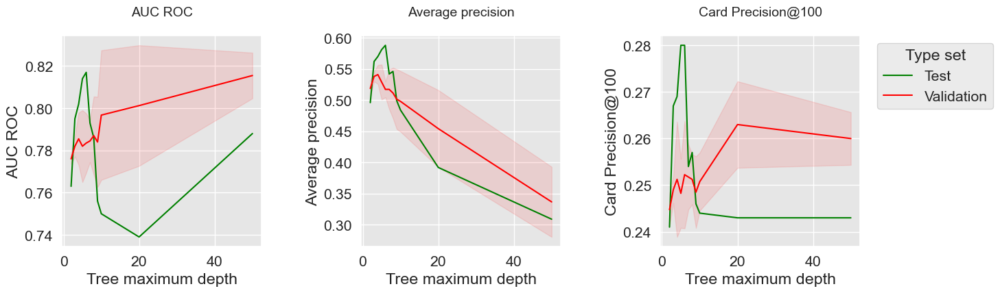

In [155]:
get_performances_plots(
    performances_df_repeated_holdout, 
    performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
    expe_type_list=['Test','Validation'],expe_type_color_list=['#008000','#FF0000']
)

In [156]:
def prequential_validation(transactions_df, classifier, 
                           start_date_training, 
                           delta_train=7, 
                           delta_delay=7, 
                           delta_assessment=7,
                           n_folds=4,
                           top_k_list=[100],
                           type_test="Test", parameter_summary=""):

    performances_df_folds=pd.DataFrame()
    
    start_time=time.time() 
    
    for fold in range(n_folds):
        
        start_date_training_fold=start_date_training-datetime.timedelta(days=fold*delta_assessment)
        
        # Get the training and test sets
        (train_df, test_df)=get_train_test_set(transactions_df,
                                               start_date_training=start_date_training_fold,
                                               delta_train=delta_train,
                                               delta_delay=delta_delay,
                                               delta_test=delta_assessment)
    
        # Fit model
        model_and_predictions_dictionary = fit_model_and_get_predictions(classifier, train_df, test_df, 
                                                                     input_features, output_feature)
        
        # Compute fraud detection performances    
        test_df['predictions']=model_and_predictions_dictionary['predictions_test']
        performances_df_test=performance_assessment(test_df, top_k_list=top_k_list, rounded=False)
        performances_df_test.columns=performances_df_test.columns.values+' '+type_test
        
        train_df['predictions']=model_and_predictions_dictionary['predictions_train']
        performances_df_train=performance_assessment(train_df, top_k_list=top_k_list, rounded=False)
        performances_df_train.columns=performances_df_train.columns.values+' Train'
    
        performances_df_folds=performances_df_folds.append(pd.concat([performances_df_test,performances_df_train],axis=1))
    
    execution_time=time.time()-start_time
    
    performances_df_folds_mean=performances_df_folds.mean()
    performances_df_folds_std=performances_df_folds.std(ddof=0)
    
    performances_df_folds_mean=pd.DataFrame(performances_df_folds_mean).transpose()
    performances_df_folds_std=pd.DataFrame(performances_df_folds_std).transpose()
    performances_df_folds_std.columns=performances_df_folds_std.columns.values+" Std"
    performances_df=pd.concat([performances_df_folds_mean,performances_df_folds_std],axis=1)
    
    performances_df['Execution time']=execution_time
    
    performances_df['Parameters summary']=parameter_summary
    
    return performances_df, performances_df_folds

In [157]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth = 2, random_state=0)

performances_df_prequential_summary, performances_df_prequential_folds=prequential_validation(
    transactions_df, classifier, 
    start_date_training=start_date_training_with_valid, 
    delta_train=delta_train, 
    delta_delay=delta_delay, 
    delta_assessment=delta_valid, 
    n_folds=4,
    type_test="Validation", parameter_summary='2'
)

In [158]:
performances_df_prequential_summary

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.790786,0.549767,0.256429,0.804231,0.593561,0.4025,0.012035,0.022134,0.014481,0.013359,0.018224,0.040474,1.745532,2


In [159]:
performances_df_prequential_folds

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train
0,0.775012,0.523548,0.242857,0.791004,0.576732,0.398571
0,0.808739,0.584663,0.242857,0.791234,0.576985,0.347143
0,0.791405,0.542531,0.262857,0.813726,0.599954,0.402857
0,0.787988,0.548326,0.277143,0.820960,0.620572,0.461429


In [160]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

start_time=time.time()

performances_df_prequential=pd.DataFrame()

for max_depth in list_params:
    
    print("Computing performances for a decision tree with max_depth="+str(max_depth))
    
    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df_prequential=performances_df_prequential.append(
        prequential_validation(
            transactions_df, classifier,
            start_date_training=start_date_training_with_valid, 
            delta_train=delta_train, 
            delta_delay=delta_delay, 
            delta_assessment=delta_test,
            n_folds=4,
            type_test="Validation", parameter_summary=max_depth
        )[0]
    )
    
performances_df_prequential.reset_index(inplace=True,drop=True)

print("Total execution time: "+str(round(time.time()-start_time,2))+"s")

Computing performances for a decision tree with max_depth=2
Computing performances for a decision tree with max_depth=3
Computing performances for a decision tree with max_depth=4
Computing performances for a decision tree with max_depth=5
Computing performances for a decision tree with max_depth=6
Computing performances for a decision tree with max_depth=7
Computing performances for a decision tree with max_depth=8
Computing performances for a decision tree with max_depth=9
Computing performances for a decision tree with max_depth=10
Computing performances for a decision tree with max_depth=20
Computing performances for a decision tree with max_depth=50
Total execution time: 35.35s


In [161]:
performances_df_prequential

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.790786,0.549767,0.256429,0.804231,0.593561,0.402500,0.012035,0.022134,0.014481,0.013359,0.018224,0.040474,1.560332,2
1,0.802717,0.573414,0.267143,0.818140,0.623562,0.421429,0.017607,0.027186,0.016067,0.011437,0.016412,0.032214,1.764118,3
2,0.800690,0.554134,0.264286,0.825978,0.644766,0.426429,0.017878,0.038293,0.014321,0.009928,0.018337,0.034144,2.075930,4
3,0.804218,0.546094,0.267857,0.831289,0.657368,0.431429,0.016505,0.042197,0.013869,0.007867,0.016387,0.029881,2.370921,5
4,0.798603,0.537006,0.264643,0.839032,0.669597,0.432143,0.024225,0.037056,0.008474,0.002592,0.012448,0.028383,2.669629,6
5,0.795636,0.530609,0.262500,0.846446,0.681837,0.436429,0.023144,0.040323,0.006804,0.005559,0.008949,0.026351,2.884928,7
6,0.795142,0.516246,0.260714,0.859548,0.694885,0.440000,0.023081,0.033545,0.009715,0.008063,0.009498,0.031380,2.866438,8
7,0.785849,0.505189,0.260357,0.864869,0.717259,0.447500,0.026249,0.040393,0.009813,0.011527,0.015346,0.028453,3.221306,9
8,0.786784,0.493543,0.257143,0.887622,0.727672,0.448571,0.031165,0.048307,0.009949,0.011532,0.018154,0.028962,3.617075,10
9,0.780408,0.450980,0.264286,0.964275,0.862459,0.496786,0.022168,0.031413,0.007890,0.007512,0.014831,0.031483,5.550665,20


In [162]:
performances_df_prequential['AUC ROC Test']=performances_df['AUC ROC Test']
performances_df_prequential['Average precision Test']=performances_df['Average precision Test']
performances_df_prequential['Card Precision@100 Test']=performances_df['Card Precision@100 Test']

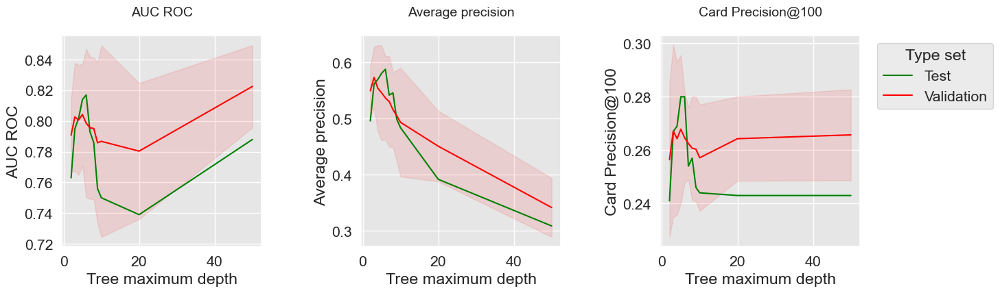

In [163]:
get_performances_plots(performances_df_prequential, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'])

In [164]:
list_params = [2,3,4,5,6,7,8,9,10,20,50]

start_time=time.time()

n_folds=4

performances_df_prequential_test=pd.DataFrame()

for max_depth in list_params:
    
    classifier = sklearn.tree.DecisionTreeClassifier(max_depth = max_depth, random_state=0)

    performances_df_prequential_test=performances_df_prequential_test.append(
        prequential_validation(
            transactions_df, classifier, 
            start_date_training=start_date_training 
                +datetime.timedelta(days=delta_test*(n_folds-1)), 
            delta_train=delta_train, 
            delta_delay=delta_delay, 
            delta_assessment=delta_test,
            n_folds=n_folds,
            type_test="Test", parameter_summary=max_depth
        )[0]
    )
    
performances_df_prequential_test.reset_index(inplace=True,drop=True)

print("Total execution time: "+str(round(time.time()-start_time,2))+"s")

Total execution time: 34.84s


In [165]:
performances_df_prequential_test

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Test Std,Average precision Test Std,Card Precision@100 Test Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary
0,0.791909,0.541761,0.265000,0.807785,0.592120,0.394643,0.017769,0.031476,0.019756,0.011559,0.017914,0.004088,1.681697,2
1,0.809012,0.578885,0.281429,0.820076,0.623315,0.410714,0.009125,0.014434,0.015940,0.007795,0.015303,0.003712,1.835532,3
2,0.812555,0.601088,0.282500,0.829963,0.645225,0.412500,0.010319,0.020216,0.015199,0.006963,0.015748,0.005285,2.091269,4
3,0.810138,0.600306,0.284286,0.835835,0.658589,0.416071,0.008586,0.016797,0.004286,0.008285,0.015249,0.008353,2.238440,5
4,0.804437,0.585132,0.281429,0.847145,0.671259,0.420000,0.007974,0.005053,0.007626,0.007900,0.016706,0.006145,2.651664,6
5,0.782710,0.554860,0.268929,0.859658,0.692724,0.427500,0.012483,0.011771,0.009813,0.013379,0.012199,0.012990,2.868500,7
6,0.774783,0.544933,0.263571,0.865567,0.708766,0.429643,0.014568,0.003392,0.007593,0.015050,0.009896,0.012951,3.221729,8
7,0.761763,0.520208,0.258571,0.877844,0.721114,0.431786,0.012098,0.012309,0.009949,0.012280,0.014920,0.012792,3.180925,9
8,0.758138,0.504909,0.257500,0.881659,0.737896,0.435357,0.011140,0.013154,0.010467,0.012795,0.012402,0.012990,3.461598,10
9,0.754024,0.439422,0.261071,0.969552,0.878847,0.491429,0.009848,0.034828,0.014335,0.010886,0.026480,0.021500,5.383641,20


In [166]:
performances_df_prequential['AUC ROC Test']=performances_df_prequential_test['AUC ROC Test']
performances_df_prequential['Average precision Test']=performances_df_prequential_test['Average precision Test']
performances_df_prequential['Card Precision@100 Test']=performances_df_prequential_test['Card Precision@100 Test']
performances_df_prequential['AUC ROC Test Std']=performances_df_prequential_test['AUC ROC Test Std']
performances_df_prequential['Average precision Test Std']=performances_df_prequential_test['Average precision Test Std']
performances_df_prequential['Card Precision@100 Test Std']=performances_df_prequential_test['Card Precision@100 Test Std']

In [167]:
performances_df_prequential

,AUC ROC Validation,Average precision Validation,Card Precision@100 Validation,AUC ROC Train,Average precision Train,Card Precision@100 Train,AUC ROC Validation Std,Average precision Validation Std,Card Precision@100 Validation Std,AUC ROC Train Std,Average precision Train Std,Card Precision@100 Train Std,Execution time,Parameters summary,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Test Std,Average precision Test Std,Card Precision@100 Test Std
0,0.790786,0.549767,0.256429,0.804231,0.593561,0.402500,0.012035,0.022134,0.014481,0.013359,0.018224,0.040474,1.560332,2,0.791909,0.541761,0.265000,0.017769,0.031476,0.019756
1,0.802717,0.573414,0.267143,0.818140,0.623562,0.421429,0.017607,0.027186,0.016067,0.011437,0.016412,0.032214,1.764118,3,0.809012,0.578885,0.281429,0.009125,0.014434,0.015940
2,0.800690,0.554134,0.264286,0.825978,0.644766,0.426429,0.017878,0.038293,0.014321,0.009928,0.018337,0.034144,2.075930,4,0.812555,0.601088,0.282500,0.010319,0.020216,0.015199
3,0.804218,0.546094,0.267857,0.831289,0.657368,0.431429,0.016505,0.042197,0.013869,0.007867,0.016387,0.029881,2.370921,5,0.810138,0.600306,0.284286,0.008586,0.016797,0.004286
4,0.798603,0.537006,0.264643,0.839032,0.669597,0.432143,0.024225,0.037056,0.008474,0.002592,0.012448,0.028383,2.669629,6,0.804437,0.585132,0.281429,0.007974,0.005053,0.007626
5,0.795636,0.530609,0.262500,0.846446,0.681837,0.436429,0.023144,0.040323,0.006804,0.005559,0.008949,0.026351,2.884928,7,0.782710,0.554860,0.268929,0.012483,0.011771,0.009813
6,0.795142,0.516246,0.260714,0.859548,0.694885,0.440000,0.023081,0.033545,0.009715,0.008063,0.009498,0.031380,2.866438,8,0.774783,0.544933,0.263571,0.014568,0.003392,0.007593
7,0.785849,0.505189,0.260357,0.864869,0.717259,0.447500,0.026249,0.040393,0.009813,0.011527,0.015346,0.028453,3.221306,9,0.761763,0.520208,0.258571,0.012098,0.012309,0.009949
8,0.786784,0.493543,0.257143,0.887622,0.727672,0.448571,0.031165,0.048307,0.009949,0.011532,0.018154,0.028962,3.617075,10,0.758138,0.504909,0.257500,0.011140,0.013154,0.010467
9,0.780408,0.450980,0.264286,0.964275,0.862459,0.496786,0.022168,0.031413,0.007890,0.007512,0.014831,0.031483,5.550665,20,0.754024,0.439422,0.261071,0.009848,0.034828,0.014335


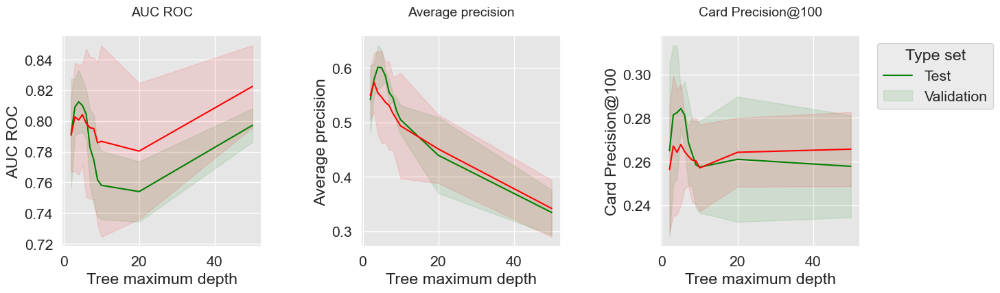

In [168]:
get_performances_plots(performances_df_prequential, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'])

In [169]:
def prequentialSplit(transactions_df,
                     start_date_training, 
                     n_folds=4, 
                     delta_train=7,
                     delta_delay=7,
                     delta_assessment=7):
    
    prequential_split_indices=[]
        
    # For each fold
    for fold in range(n_folds):
        
        # Shift back start date for training by the fold index times the assessment period (delta_assessment)
        # (See Fig. 5)
        start_date_training_fold = start_date_training-datetime.timedelta(days=fold*delta_assessment)
        
        # Get the training and test (assessment) sets
        (train_df, test_df)=get_train_test_set(transactions_df,
                                               start_date_training=start_date_training_fold,
                                               delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_assessment)
    
        # Get the indices from the two sets, and add them to the list of prequential splits
        indices_train=list(train_df.index)
        indices_test=list(test_df.index)
        
        prequential_split_indices.append((indices_train,indices_test))
    
    return prequential_split_indices

In [170]:
def card_precision_top_k_custom(y_true, y_pred, top_k, transactions_df):
    
    # Let us create a predictions_df DataFrame, that contains all transactions matching the indices of the current fold
    # (indices of the y_true vector)
    predictions_df=transactions_df.iloc[y_true.index.values].copy()
    predictions_df['predictions']=y_pred
    
    # Compute the CP@k using the function implemented in Chapter 4, Section 4.2
    nb_compromised_cards_per_day,card_precision_top_k_per_day_list,mean_card_precision_top_k=\
        card_precision_top_k(predictions_df, top_k)
    
    # Return the mean_card_precision_top_k
    return mean_card_precision_top_k

# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer=transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

# Make scorer using card_precision_top_k_custom
card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom, 
                                                     needs_proba=True, 
                                                     top_k=100, 
                                                     transactions_df=transactions_df_scorer)

In [171]:
# Estimator to use
classifier = sklearn.tree.DecisionTreeClassifier()

# Hyperparameters to test
parameters = {'clf__max_depth':[2,4], 'clf__random_state':[0]}

# Scoring functions. AUC ROC and Average Precision are readily available from sklearn 
# with `auc_roc` and `average_precision`. Card Precision@100 was implemented with the make_scorer factory function. 
scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100
           }

# A pipeline is created to scale data before fitting a model
estimators = [('scaler', sklearn.preprocessing.StandardScaler()), ('clf', classifier)]
pipe = sklearn.pipeline.Pipeline(estimators)

# Indices for the prequential validation are obtained with the prequentialSplit function
prequential_split_indices = prequentialSplit(transactions_df,
                                             start_date_training_with_valid, 
                                             n_folds=n_folds,
                                             delta_train=delta_train, 
                                             delta_delay=delta_delay, 
                                             delta_assessment=delta_valid)

# Let us instantiate the GridSearchCV
grid_search = sklearn.model_selection.GridSearchCV(pipe, param_grid=parameters, scoring=scoring, \
                                                   cv=prequential_split_indices, refit=False, n_jobs=-1,verbose=0)

# And select the input features, and output feature
X=transactions_df[input_features]
y=transactions_df[output_feature]

In [172]:
%time grid_search.fit(X, y)

print("Finished CV fitting")

CPU times: total: 219 ms
Wall time: 5.31 s
Finished CV fitting


In [173]:
grid_search.cv_results_

{'mean_fit_time': array([0.6207369 , 0.75095427]),
 'std_fit_time': array([0.02494169, 0.0263316 ]),
 'mean_score_time': array([0.09236032, 0.10736257]),
 'std_score_time': array([0.00715492, 0.00882499]),
 'param_clf__max_depth': masked_array(data=[2, 4],
              mask=[False, False],
        fill_value='?',
             dtype=object),
 'param_clf__random_state': masked_array(data=[0, 0],
              mask=[False, False],
        fill_value='?',
             dtype=object),
 'params': [{'clf__max_depth': 2, 'clf__random_state': 0},
  {'clf__max_depth': 4, 'clf__random_state': 0}],
 'split0_test_roc_auc': array([0.7750121 , 0.78393251]),
 'split1_test_roc_auc': array([0.80873906, 0.82871798]),
 'split2_test_roc_auc': array([0.79140481, 0.78643512]),
 'split3_test_roc_auc': array([0.78798838, 0.80367453]),
 'mean_test_roc_auc': array([0.79078609, 0.80069003]),
 'std_test_roc_auc': array([0.01203472, 0.01787799]),
 'rank_test_roc_auc': array([2, 1]),
 'split0_test_average_precision'

In [174]:
performances_df=pd.DataFrame()

expe_type="Validation"

performance_metrics_list_grid=['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100']


for i in range(len(performance_metrics_list_grid)):
    performances_df[performance_metrics_list[i]+' '+expe_type]=grid_search.cv_results_['mean_test_'+performance_metrics_list_grid[i]]
    performances_df[performance_metrics_list[i]+' '+expe_type+' Std']=grid_search.cv_results_['std_test_'+performance_metrics_list_grid[i]]

performances_df['Execution time']=grid_search.cv_results_['mean_fit_time']

performances_df['Parameters']=list(grid_search.cv_results_['params'])

In [175]:
performances_df

,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Execution time,Parameters
0,0.790786,0.012035,0.549767,0.022134,0.256429,0.014481,0.620737,"{'clf__max_depth': 2, 'clf__random_state': 0}"
1,0.800690,0.017878,0.554134,0.038293,0.264286,0.014321,0.750954,"{'clf__max_depth': 4, 'clf__random_state': 0}"


In [176]:
def prequential_grid_search(transactions_df, 
                            classifier, 
                            input_features, output_feature, 
                            parameters, scoring, 
                            start_date_training, 
                            n_folds=4,
                            expe_type='Test',
                            delta_train=7, 
                            delta_delay=7, 
                            delta_assessment=7,
                            performance_metrics_list_grid=['roc_auc'],
                            performance_metrics_list=['AUC ROC'],
                            n_jobs=-1):
    
    estimators = [('scaler', sklearn.preprocessing.StandardScaler()), ('clf', classifier)]
    pipe = sklearn.pipeline.Pipeline(estimators)
    
    prequential_split_indices=prequentialSplit(transactions_df,
                                               start_date_training=start_date_training, 
                                               n_folds=n_folds, 
                                               delta_train=delta_train, 
                                               delta_delay=delta_delay, 
                                               delta_assessment=delta_assessment)
    
    grid_search = sklearn.model_selection.GridSearchCV(pipe, parameters, scoring=scoring, cv=prequential_split_indices, refit=False, n_jobs=n_jobs)
    
    X=transactions_df[input_features]
    y=transactions_df[output_feature]

    grid_search.fit(X, y)
    
    performances_df=pd.DataFrame()
    
    for i in range(len(performance_metrics_list_grid)):
        performances_df[performance_metrics_list[i]+' '+expe_type]=grid_search.cv_results_['mean_test_'+performance_metrics_list_grid[i]]
        performances_df[performance_metrics_list[i]+' '+expe_type+' Std']=grid_search.cv_results_['std_test_'+performance_metrics_list_grid[i]]

    performances_df['Parameters']=grid_search.cv_results_['params']
    performances_df['Execution time']=grid_search.cv_results_['mean_fit_time']
    
    return performances_df

        

In [177]:
start_time=time.time()

classifier = sklearn.tree.DecisionTreeClassifier()

parameters = {'clf__max_depth':[2,3,4,5,6,7,8,9,10,20,50], 'clf__random_state':[0]}

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

performances_df_validation=prequential_grid_search(
    transactions_df, classifier, 
    input_features, output_feature,
    parameters, scoring, 
    start_date_training=start_date_training_with_valid,
    n_folds=n_folds,
    expe_type='Validation',
    delta_train=delta_train, 
    delta_delay=delta_delay, 
    delta_assessment=delta_valid,
    performance_metrics_list_grid=performance_metrics_list_grid,
    performance_metrics_list=performance_metrics_list)

print("Validation: Total execution time: "+str(round(time.time()-start_time,2))+"s")

Validation: Total execution time: 9.54s


In [178]:
start_time=time.time()

performances_df_test=prequential_grid_search(
    transactions_df, classifier, 
    input_features, output_feature,
    parameters, scoring, 
    start_date_training=start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test),
    n_folds=n_folds,
    expe_type='Test',
    delta_train=delta_train, 
    delta_delay=delta_delay, 
    delta_assessment=delta_test,
    performance_metrics_list_grid=performance_metrics_list_grid,
    performance_metrics_list=performance_metrics_list)

print("Test: Total execution time: "+str(round(time.time()-start_time,2))+"s")

Test: Total execution time: 7.31s


In [179]:
performances_df_validation.drop(columns=['Parameters','Execution time'], inplace=True)
performances_df=pd.concat([performances_df_test,performances_df_validation],axis=1)

In [180]:
# Use the max_depth as the label for plotting
parameters_dict=dict(performances_df['Parameters'])
max_depth=[parameters_dict[i]['clf__max_depth'] for i in range(len(parameters_dict))]
performances_df['Parameters summary']=max_depth

In [181]:
performances_df

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.791909,0.017769,0.541761,0.031476,0.265000,0.019756,"{'clf__max_depth': 2, 'clf__random_state': 0}",0.685050,0.790786,0.012035,0.549767,0.022134,0.256429,0.014481,2
1,0.809012,0.009125,0.578885,0.014434,0.281429,0.015940,"{'clf__max_depth': 3, 'clf__random_state': 0}",1.041171,0.802717,0.017607,0.573414,0.027186,0.267143,0.016067,3
2,0.812555,0.010319,0.601088,0.020216,0.282500,0.015199,"{'clf__max_depth': 4, 'clf__random_state': 0}",0.977277,0.800690,0.017878,0.554134,0.038293,0.264286,0.014321,4
3,0.810138,0.008586,0.600306,0.016797,0.284286,0.004286,"{'clf__max_depth': 5, 'clf__random_state': 0}",1.017469,0.804218,0.016505,0.546094,0.042197,0.267857,0.013869,5
4,0.804437,0.007974,0.585132,0.005053,0.281429,0.007626,"{'clf__max_depth': 6, 'clf__random_state': 0}",1.067633,0.798603,0.024225,0.537006,0.037056,0.264643,0.008474,6
5,0.782710,0.012483,0.554860,0.011771,0.268929,0.009813,"{'clf__max_depth': 7, 'clf__random_state': 0}",1.087426,0.795636,0.023144,0.530609,0.040323,0.262500,0.006804,7
6,0.774783,0.014568,0.544933,0.003392,0.263571,0.007593,"{'clf__max_depth': 8, 'clf__random_state': 0}",1.274640,0.795142,0.023081,0.516246,0.033545,0.260714,0.009715,8
7,0.761763,0.012098,0.520208,0.012309,0.258571,0.009949,"{'clf__max_depth': 9, 'clf__random_state': 0}",1.336162,0.785849,0.026249,0.505189,0.040393,0.260357,0.009813,9
8,0.758138,0.011140,0.504909,0.013154,0.257500,0.010467,"{'clf__max_depth': 10, 'clf__random_state': 0}",1.661981,0.786784,0.031165,0.493543,0.048307,0.257143,0.009949,10
9,0.754024,0.009848,0.439422,0.034828,0.261071,0.014335,"{'clf__max_depth': 20, 'clf__random_state': 0}",2.077707,0.780408,0.022168,0.450980,0.031413,0.264286,0.007890,20


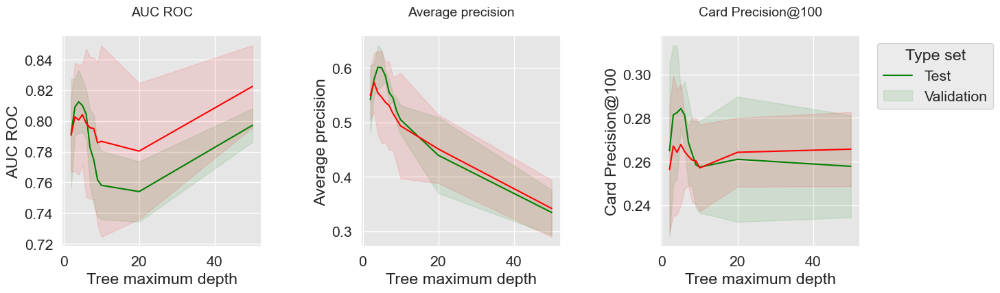

In [182]:
get_performances_plots(performances_df, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'],expe_type_color_list=['#008000','#FF0000'])

In [183]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed
        

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 63257  100 63257    0     0  53894      0  0:00:01  0:00:01 --:--:-- 53973


<Figure size 640x480 with 0 Axes>

In [184]:
# Load data from the 2018-06-11 to the 2018-09-14

DIR_INPUT = 'simulated-data-transformed/data/' 

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df = read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature = "TX_FRAUD"

input_features = ['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

Load  files
CPU times: total: 500 ms
Wall time: 1.16 s
919767 transactions loaded, containing 8195 fraudulent transactions


In [185]:
# Number of folds for the prequential validation
n_folds = 4

# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = delta_valid = delta_assessment = 7

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)

In [186]:
# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom, 
                                                     needs_proba=True, 
                                                     top_k=100, 
                                                     transactions_df=transactions_df_scorer)

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

In [187]:
def model_selection_wrapper(transactions_df, 
                            classifier, 
                            input_features, output_feature,
                            parameters, 
                            scoring, 
                            start_date_training_for_valid,
                            start_date_training_for_test,
                            n_folds=4,
                            delta_train=7, 
                            delta_delay=7, 
                            delta_assessment=7,
                            performance_metrics_list_grid=['roc_auc'],
                            performance_metrics_list=['AUC ROC'],
                            n_jobs=-1):

    # Get performances on the validation set using prequential validation
    performances_df_validation=prequential_grid_search(transactions_df, classifier, 
                            input_features, output_feature,
                            parameters, scoring, 
                            start_date_training=start_date_training_for_valid,
                            n_folds=n_folds,
                            expe_type='Validation',
                            delta_train=delta_train, 
                            delta_delay=delta_delay, 
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            n_jobs=n_jobs)
    
    # Get performances on the test set using prequential validation
    performances_df_test=prequential_grid_search(transactions_df, classifier, 
                            input_features, output_feature,
                            parameters, scoring, 
                            start_date_training=start_date_training_for_test,
                            n_folds=n_folds,
                            expe_type='Test',
                            delta_train=delta_train, 
                            delta_delay=delta_delay, 
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            n_jobs=n_jobs)
    
    # Bind the two resulting DataFrames
    performances_df_validation.drop(columns=['Parameters','Execution time'], inplace=True)
    performances_df=pd.concat([performances_df_test,performances_df_validation],axis=1)

    # And return as a single DataFrame
    return performances_df

In [188]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[2,3,4,5,6,7,8,9,10,20,50], 'clf__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_dt = time.time()-start_time

# Select parameter of interest (max_depth)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__max_depth'] for i in range(len(parameters_dict))]

# Rename to performances_df_dt for model performance comparison at the end of this notebook
performances_df_dt=performances_df

In [189]:
performances_df_dt

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.791909,0.017769,0.541761,0.031476,0.265000,0.019756,"{'clf__max_depth': 2, 'clf__random_state': 0}",0.295178,0.790786,0.012035,0.549767,0.022134,0.256429,0.014481,2
1,0.809012,0.009125,0.578885,0.014434,0.281429,0.015940,"{'clf__max_depth': 3, 'clf__random_state': 0}",0.368798,0.802717,0.017607,0.573414,0.027186,0.267143,0.016067,3
2,0.812555,0.010319,0.601088,0.020216,0.282500,0.015199,"{'clf__max_depth': 4, 'clf__random_state': 0}",0.403651,0.800690,0.017878,0.554134,0.038293,0.264286,0.014321,4
3,0.810138,0.008586,0.600306,0.016797,0.284286,0.004286,"{'clf__max_depth': 5, 'clf__random_state': 0}",0.459464,0.804218,0.016505,0.546094,0.042197,0.267857,0.013869,5
4,0.804437,0.007974,0.585132,0.005053,0.281429,0.007626,"{'clf__max_depth': 6, 'clf__random_state': 0}",0.545219,0.798603,0.024225,0.537006,0.037056,0.264643,0.008474,6
5,0.782710,0.012483,0.554860,0.011771,0.268929,0.009813,"{'clf__max_depth': 7, 'clf__random_state': 0}",0.576979,0.795636,0.023144,0.530609,0.040323,0.262500,0.006804,7
6,0.774783,0.014568,0.544933,0.003392,0.263571,0.007593,"{'clf__max_depth': 8, 'clf__random_state': 0}",0.645344,0.795142,0.023081,0.516246,0.033545,0.260714,0.009715,8
7,0.761763,0.012098,0.520208,0.012309,0.258571,0.009949,"{'clf__max_depth': 9, 'clf__random_state': 0}",0.714922,0.785849,0.026249,0.505189,0.040393,0.260357,0.009813,9
8,0.758138,0.011140,0.504909,0.013154,0.257500,0.010467,"{'clf__max_depth': 10, 'clf__random_state': 0}",0.789528,0.786784,0.031165,0.493543,0.048307,0.257143,0.009949,10
9,0.754024,0.009848,0.439422,0.034828,0.261071,0.014335,"{'clf__max_depth': 20, 'clf__random_state': 0}",1.255795,0.780408,0.022168,0.450980,0.031413,0.264286,0.007890,20


In [190]:
def get_summary_performances(performances_df, parameter_column_name="Parameters summary"):

    # Three performance metrics
    metrics = ['AUC ROC','Average precision','Card Precision@100']
    performances_results=pd.DataFrame(columns=metrics)
    
    # Reset indices in case a subset of a performane DataFrame is provided as input
    performances_df.reset_index(drop=True,inplace=True)

    # Lists of parameters/performances that will be retrieved for the best estimated parameters
    best_estimated_parameters = []
    validation_performance = []
    test_performance = []
    
    # For each performance metric, get the validation and test performance for the best estimated parameter
    for metric in metrics:
    
        # Find the index which provides the best validation performance
        index_best_validation_performance = performances_df.index[np.argmax(performances_df[metric+' Validation'].values)]
    
        # Retrieve the corresponding parameters
        best_estimated_parameters.append(performances_df[parameter_column_name].iloc[index_best_validation_performance])
        
        # Add validation performance to the validation_performance list (mean+/-std)
        validation_performance.append(
                str(round(performances_df[metric+' Validation'].iloc[index_best_validation_performance],3))+
                '+/-'+
                str(round(performances_df[metric+' Validation'+' Std'].iloc[index_best_validation_performance],2))
        )
        
        # Add test performance to the test_performance list (mean+/-std)
        test_performance.append(
                str(round(performances_df[metric+' Test'].iloc[index_best_validation_performance],3))+
                '+/-'+
                str(round(performances_df[metric+' Test'+' Std'].iloc[index_best_validation_performance],2))
        )
    
    # Add results to the performances_results DataFrame
    performances_results.loc["Best estimated parameters"]=best_estimated_parameters
    performances_results.loc["Validation performance"]=validation_performance
    performances_results.loc["Test performance"]=test_performance

    # Lists of parameters/performances that will be retrieved for the optimal parameters
    optimal_test_performance = []
    optimal_parameters = []

    # For each performance metric, get the performance for the optimal parameter
    for metric in ['AUC ROC Test','Average precision Test','Card Precision@100 Test']:
    
        # Find the index which provides the optimal performance
        index_optimal_test_performance = performances_df.index[np.argmax(performances_df[metric].values)]
    
        # Retrieve the corresponding parameters
        optimal_parameters.append(performances_df[parameter_column_name].iloc[index_optimal_test_performance])
    
        # Add test performance to the test_performance list (mean+/-std)
        optimal_test_performance.append(
                str(round(performances_df[metric].iloc[index_optimal_test_performance],3))+
                '+/-'+
                str(round(performances_df[metric+' Std'].iloc[index_optimal_test_performance],2))
        )

    # Add results to the performances_results DataFrame
    performances_results.loc["Optimal parameters"]=optimal_parameters
    performances_results.loc["Optimal test performance"]=optimal_test_performance
    
    return performances_results

In [191]:
summary_performances_dt=get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")
summary_performances_dt

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,50,3,5
Validation performance,0.823+/-0.01,0.573+/-0.03,0.268+/-0.01
Test performance,0.797+/-0.01,0.579+/-0.01,0.284+/-0.0
Optimal parameters,4,4,5
Optimal test performance,0.813+/-0.01,0.601+/-0.02,0.284+/-0.0


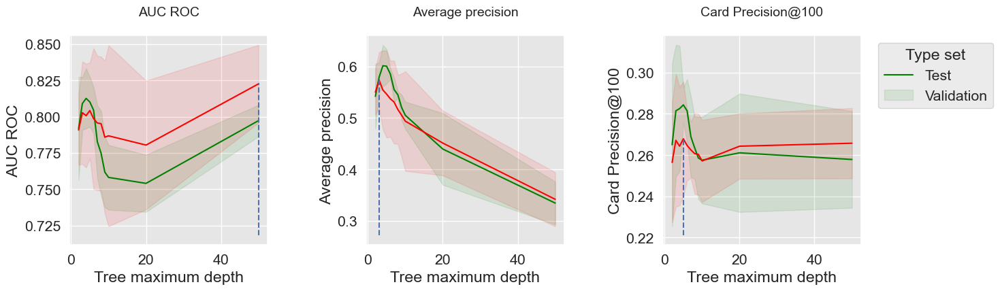

In [192]:
get_performances_plots(performances_df_dt, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       summary_performances=summary_performances_dt)

In [193]:
classifier = sklearn.linear_model.LogisticRegression()

parameters = {'clf__C':[0.1,1,10,100], 'clf__random_state':[0]}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_lr = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__C'] for i in range(len(parameters_dict))]

# Rename to performances_df_lr for model performance comparison at the end of this notebook
performances_df_lr=performances_df

In [194]:
performances_df_lr

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.866972,0.014858,0.620231,0.015977,0.297143,0.008207,"{'clf__C': 0.1, 'clf__random_state': 0}",0.317806,0.865052,0.009591,0.608330,0.022740,0.278929,0.016300,0.1
1,0.867643,0.015404,0.623081,0.016204,0.297143,0.008806,"{'clf__C': 1, 'clf__random_state': 0}",0.321662,0.866861,0.008988,0.612264,0.023474,0.278214,0.016914,1.0
2,0.867678,0.015415,0.623224,0.016087,0.297500,0.008828,"{'clf__C': 10, 'clf__random_state': 0}",0.339167,0.867050,0.008918,0.612526,0.023715,0.277500,0.016763,10.0
3,0.867680,0.015419,0.623253,0.016074,0.297500,0.008828,"{'clf__C': 100, 'clf__random_state': 0}",0.310650,0.867071,0.008912,0.612537,0.023712,0.277500,0.016763,100.0


In [195]:
summary_performances_lr=get_summary_performances(performances_df_lr, parameter_column_name="Parameters summary")
summary_performances_lr

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,100.0,100.0,0.1
Validation performance,0.867+/-0.01,0.613+/-0.02,0.279+/-0.02
Test performance,0.868+/-0.02,0.623+/-0.02,0.297+/-0.01
Optimal parameters,100.0,100.0,10.0
Optimal test performance,0.868+/-0.02,0.623+/-0.02,0.298+/-0.01


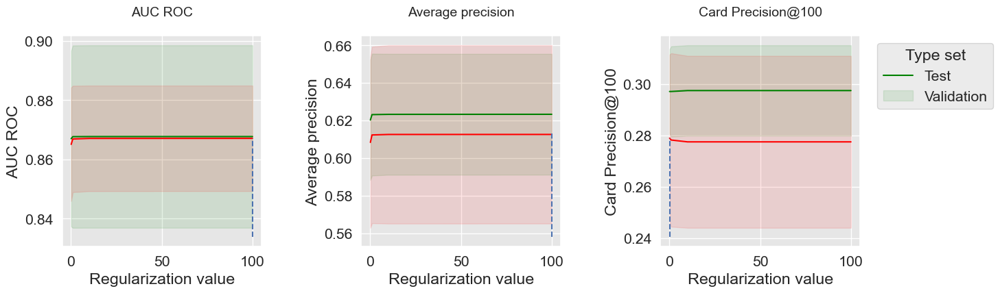

In [196]:
get_performances_plots(performances_df_lr, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Regularization value",
                       summary_performances=summary_performances_lr)

In [197]:
classifier = sklearn.ensemble.RandomForestClassifier()

# Note: n_jobs set to one for getting true execution times
parameters = {'clf__max_depth':[5,10,20,50], 'clf__n_estimators':[25,50,100],
              'clf__random_state':[0],'clf__n_jobs':[1]}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_rf = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__n_estimators'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_depth'])
                                   for i in range(len(parameters_dict))]

# Rename to performances_df_rf for model performance comparison at the end of this notebook
performances_df_rf=performances_df

In [198]:
performances_df_rf

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.845287,0.003872,0.620712,0.022145,0.289286,0.010570,"{'clf__max_depth': 5, 'clf__n_estimators': 25,...",1.380414,0.834147,0.009100,0.610413,0.023740,0.274286,0.015551,25/5
1,0.850968,0.007508,0.620932,0.023824,0.290714,0.010996,"{'clf__max_depth': 5, 'clf__n_estimators': 50,...",2.611073,0.844140,0.007473,0.609801,0.027459,0.272857,0.015085,50/5
2,0.855230,0.007315,0.627034,0.021852,0.292500,0.010850,"{'clf__max_depth': 5, 'clf__n_estimators': 100...",5.047414,0.849065,0.011019,0.619450,0.026249,0.275000,0.016614,100/5
3,0.867271,0.006166,0.648583,0.012831,0.300714,0.010950,"{'clf__max_depth': 10, 'clf__n_estimators': 25...",2.518242,0.865000,0.002259,0.651858,0.020059,0.285357,0.012305,25/10
4,0.869225,0.007955,0.655050,0.014192,0.300000,0.012495,"{'clf__max_depth': 10, 'clf__n_estimators': 50...",4.648729,0.871323,0.004542,0.659386,0.021993,0.286786,0.015531,50/10
5,0.874949,0.011903,0.664613,0.014215,0.303214,0.013030,"{'clf__max_depth': 10, 'clf__n_estimators': 10...",8.952293,0.872388,0.005256,0.663481,0.024010,0.286429,0.017627,100/10
6,0.853581,0.014851,0.660131,0.013713,0.296429,0.012016,"{'clf__max_depth': 20, 'clf__n_estimators': 25...",3.143638,0.869824,0.005664,0.680407,0.016981,0.285357,0.014962,25/20
7,0.862653,0.016004,0.673352,0.011485,0.297143,0.013439,"{'clf__max_depth': 20, 'clf__n_estimators': 50...",7.199725,0.876311,0.006772,0.690434,0.019828,0.287143,0.016506,50/20
8,0.870378,0.016910,0.677675,0.011698,0.299286,0.013190,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",15.878039,0.879728,0.006367,0.694063,0.020657,0.288571,0.016690,100/20
9,0.858527,0.008786,0.651899,0.009478,0.296429,0.010996,"{'clf__max_depth': 50, 'clf__n_estimators': 25...",3.244263,0.869956,0.003717,0.674013,0.021356,0.283929,0.016671,25/50


In [199]:
summary_performances_rf=get_summary_performances(performances_df_rf, parameter_column_name="Parameters summary")
summary_performances_rf

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,100/20,100/20,100/20
Validation performance,0.88+/-0.01,0.694+/-0.02,0.289+/-0.02
Test performance,0.87+/-0.02,0.678+/-0.01,0.299+/-0.01
Optimal parameters,100/10,100/20,100/10
Optimal test performance,0.875+/-0.01,0.678+/-0.01,0.303+/-0.01


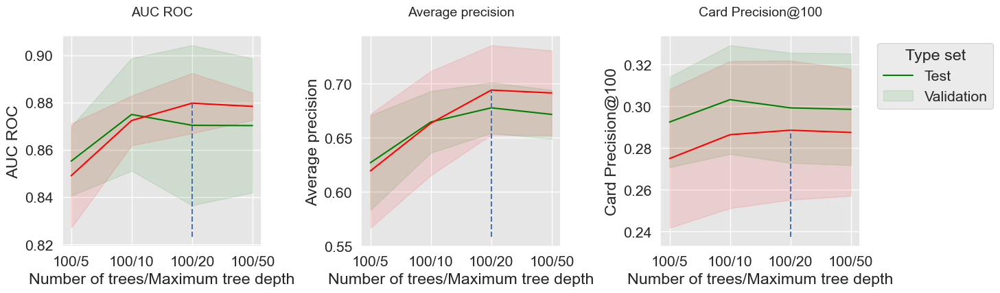

In [200]:
performances_df_rf_fixed_number_of_trees=performances_df_rf[performances_df_rf["Parameters summary"].str.startswith("100")]

summary_performances_fixed_number_of_trees=get_summary_performances(performances_df_rf_fixed_number_of_trees, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_rf_fixed_number_of_trees, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_number_of_trees)

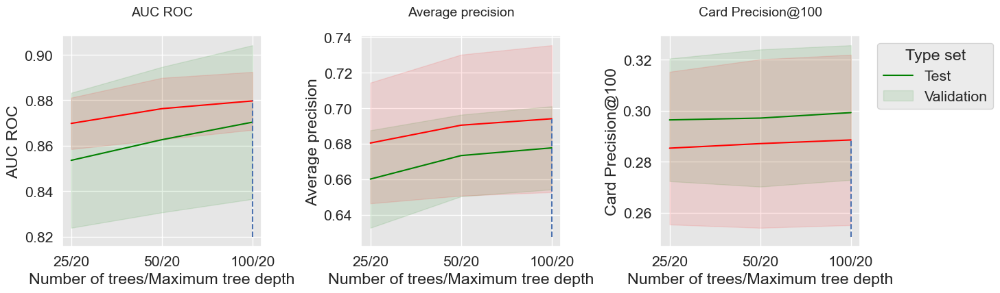

In [201]:
performances_df_rf_fixed_max_tree_depth=performances_df_rf[performances_df_rf["Parameters summary"].str.endswith("20")]

summary_performances_fixed_max_tree_depth=get_summary_performances(performances_df_rf_fixed_max_tree_depth, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_rf_fixed_max_tree_depth, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_max_tree_depth)

In [202]:
# Get the performance plot for a single performance metric
def get_execution_times_plot(performances_df,
                             title="",
                             parameter_name="Tree maximum depth"):
    
    fig, ax = plt.subplots(1,1, figsize=(5,4))
    
    # Plot data on graph
    ax.plot(performances_df['Parameters summary'], performances_df["Execution time"], 
            color="black")
        
    # Set title, and x and y axes labels
    ax.set_title(title, fontsize=14)
    ax.set(xlabel = parameter_name, ylabel="Execution time (seconds)")

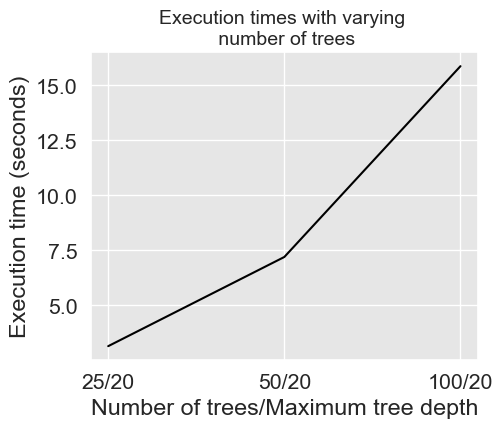

In [203]:
get_execution_times_plot(performances_df_rf_fixed_max_tree_depth, 
                         title="Execution times with varying \n number of trees",
                         parameter_name="Number of trees/Maximum tree depth")

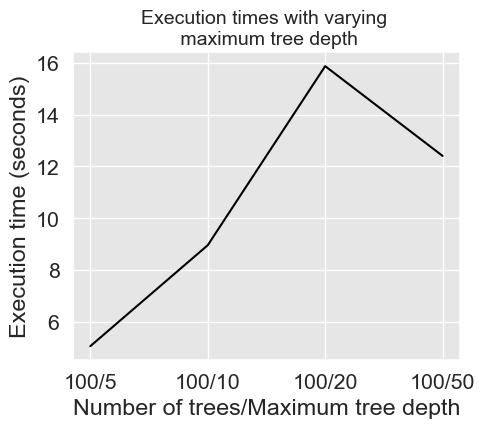

In [204]:
get_execution_times_plot(performances_df_rf_fixed_number_of_trees, 
                         title="Execution times with varying \n maximum tree depth",
                         parameter_name="Number of trees/Maximum tree depth")

In [205]:
print("Total execution time for the model selection procedure: "+str(round(execution_time_rf,2))+"s")

Total execution time for the model selection procedure: 654.82s


In [206]:
classifier = xgboost.XGBClassifier()

parameters = {'clf__max_depth':[3,6,9], 'clf__n_estimators':[25,50,100], 'clf__learning_rate':[0.1, 0.3],
              'clf__random_state':[0], 'clf__n_jobs':[1], 'clf__verbosity':[0]}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_boosting = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__n_estimators'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__learning_rate'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_depth'])
                                   for i in range(len(parameters_dict))]

# Rename to performances_df_xgboost for model performance comparison at the end of this notebook
performances_df_xgboost=performances_df

In [207]:
performances_df_xgboost

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.833094,0.012257,0.635603,0.022225,0.296071,0.014859,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",0.983271,0.825157,0.009026,0.617990,0.025069,0.278214,0.015563,25/0.1/3
1,0.864766,0.006604,0.666130,0.012722,0.301429,0.013439,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",1.725596,0.863627,0.003203,0.651369,0.030279,0.280714,0.014932,50/0.1/3
2,0.870792,0.012352,0.694030,0.008394,0.303929,0.012305,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",3.783924,0.878438,0.009221,0.705235,0.019756,0.288214,0.015694,100/0.1/3
3,0.835862,0.012705,0.638593,0.025976,0.297500,0.014928,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",1.646383,0.843097,0.014918,0.640099,0.026283,0.278571,0.015551,25/0.1/6
4,0.871558,0.014238,0.686319,0.012066,0.301786,0.009603,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",3.741976,0.869654,0.002863,0.699780,0.016875,0.288214,0.016884,50/0.1/6
5,0.870699,0.012282,0.685875,0.008983,0.297857,0.011089,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",6.866185,0.881340,0.004587,0.706922,0.017461,0.286429,0.017217,100/0.1/6
6,0.851328,0.003119,0.655970,0.011626,0.303571,0.011715,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",2.273563,0.854394,0.008558,0.656965,0.023941,0.281786,0.013377,25/0.1/9
7,0.868157,0.015451,0.682082,0.011898,0.300714,0.009286,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",4.913657,0.876052,0.002309,0.699764,0.019455,0.287143,0.016721,50/0.1/9
8,0.862069,0.008130,0.673361,0.008322,0.293571,0.012797,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",10.379793,0.879924,0.004621,0.702057,0.017547,0.284643,0.018333,100/0.1/9
9,0.870988,0.014197,0.678544,0.012501,0.303214,0.012592,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",0.952391,0.877231,0.006120,0.698490,0.022835,0.288929,0.015131,25/0.3/3


In [208]:
summary_performances_xgboost=get_summary_performances(performances_df_xgboost, parameter_column_name="Parameters summary")
summary_performances_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,100/0.3/3,50/0.3/3,25/0.3/3
Validation performance,0.887+/-0.01,0.708+/-0.02,0.289+/-0.02
Test performance,0.869+/-0.01,0.687+/-0.01,0.303+/-0.01
Optimal parameters,50/0.3/3,100/0.1/3,100/0.1/3
Optimal test performance,0.872+/-0.01,0.694+/-0.01,0.304+/-0.01


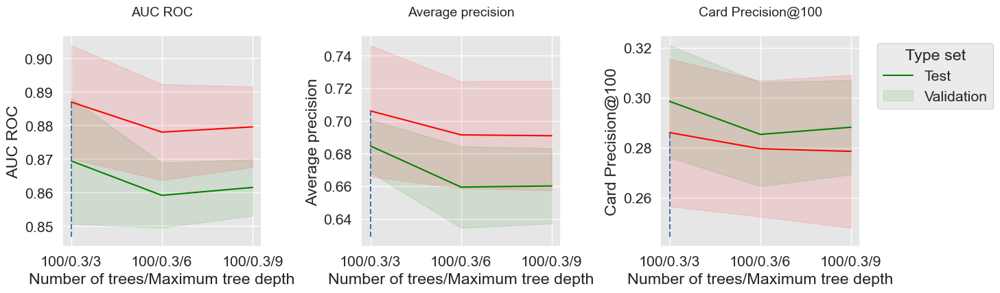

In [209]:
performances_df_xgboost_fixed_number_of_trees=performances_df_xgboost[performances_df_xgboost["Parameters summary"].str.startswith("100/0.3")]

summary_performances_fixed_number_of_trees=get_summary_performances(performances_df_xgboost_fixed_number_of_trees, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_xgboost_fixed_number_of_trees, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_number_of_trees)

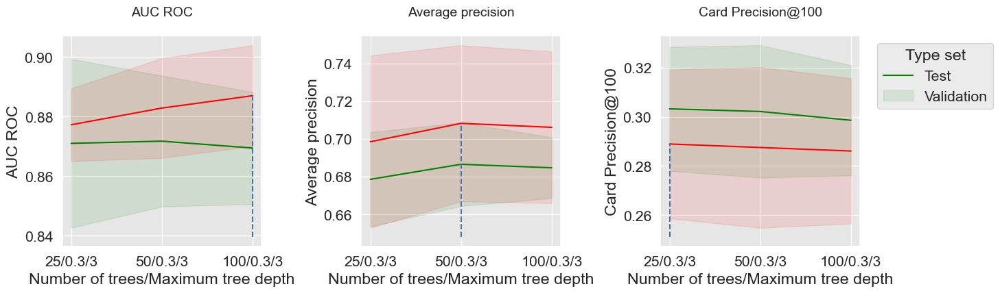

In [210]:
performances_df_xgboost_fixed_max_tree_depth=performances_df_xgboost[performances_df_xgboost["Parameters summary"].str.endswith("0.3/3")]

summary_performances_fixed_max_tree_depth=get_summary_performances(performances_df_xgboost_fixed_max_tree_depth, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_xgboost_fixed_max_tree_depth, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_max_tree_depth)

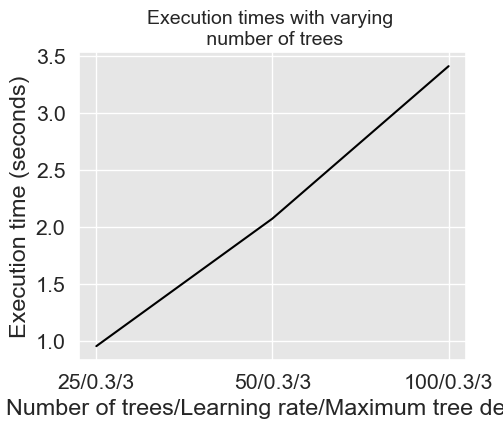

In [211]:
get_execution_times_plot(performances_df_xgboost_fixed_max_tree_depth, 
                         title="Execution times with varying \n number of trees",
                         parameter_name="Number of trees/Learning rate/Maximum tree depth")

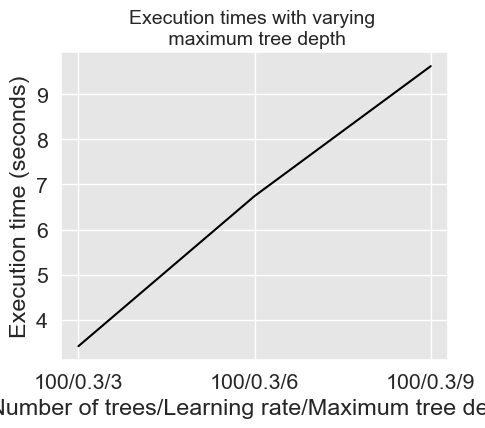

In [212]:
get_execution_times_plot(performances_df_xgboost_fixed_number_of_trees, 
                         title="Execution times with varying \n maximum tree depth",
                         parameter_name="Number of trees/Learning rate/Maximum tree depth")

In [213]:
print("Total execution time for the model selection procedure: "+str(round(execution_time_boosting,2))+"s")

Total execution time for the model selection procedure: 593.72s


In [214]:
performances_df_dictionary={
    "Decision Tree": performances_df_dt,
    "Logistic Regression": performances_df_lr,
    "Random Forest": performances_df_rf,
    "XGBoost": performances_df_xgboost
}

In [215]:
def model_selection_performances(performances_df_dictionary,
                                 performance_metric='AUC ROC',
                                 model_classes=['Decision Tree', 
                                                'Logistic Regression', 
                                                'Random Forest', 
                                                'XGBoost'],
                                 default_parameters_dictionary={
                                                "Decision Tree": 50,
                                                "Logistic Regression": 1,
                                                "Random Forest": "100/50",
                                                "XGBoost": "100/0.3/6"
                                            }):
    
    mean_performances_dictionary={
        "Default parameters": [],
        "Best validation parameters": [],
        "Optimal parameters": []
    }
    
    std_performances_dictionary={
        "Default parameters": [],
        "Best validation parameters": [],
        "Optimal parameters": []
    }
    
    # For each model class
    for model_class in model_classes:
        
        performances_df=performances_df_dictionary[model_class]
        
        # Get the performances for the default paramaters
        default_performances=performances_df[performances_df['Parameters summary']==default_parameters_dictionary[model_class]]
        default_performances=default_performances.round(decimals=3)
        
        mean_performances_dictionary["Default parameters"].append(default_performances[performance_metric+" Test"].values[0])
        std_performances_dictionary["Default parameters"].append(default_performances[performance_metric+" Test Std"].values[0])
        
        # Get the performances for the best estimated parameters
        performances_summary=get_summary_performances(performances_df, parameter_column_name="Parameters summary")
        mean_std_performances=performances_summary.loc[["Test performance"]][performance_metric].values[0]
        mean_std_performances=mean_std_performances.split("+/-")
        mean_performances_dictionary["Best validation parameters"].append(float(mean_std_performances[0]))
        std_performances_dictionary["Best validation parameters"].append(float(mean_std_performances[1]))
        
        # Get the performances for the boptimal parameters
        mean_std_performances=performances_summary.loc[["Optimal test performance"]][performance_metric].values[0]
        mean_std_performances=mean_std_performances.split("+/-")
        mean_performances_dictionary["Optimal parameters"].append(float(mean_std_performances[0]))
        std_performances_dictionary["Optimal parameters"].append(float(mean_std_performances[1]))
        
    # Return the mean performances and their standard deviations    
    return (mean_performances_dictionary,std_performances_dictionary)

In [216]:
model_selection_performances(performances_df_dictionary,
                             performance_metric='AUC ROC')

({'Default parameters': [0.797, 0.868, 0.87, 0.859],
  'Best validation parameters': [0.797, 0.868, 0.87, 0.869],
  'Optimal parameters': [0.813, 0.868, 0.875, 0.872]},
 {'Default parameters': [0.005, 0.015, 0.014, 0.005],
  'Best validation parameters': [0.01, 0.02, 0.02, 0.01],
  'Optimal parameters': [0.01, 0.02, 0.01, 0.01]})

In [217]:
# Get the performance plot for a single performance metric
def get_model_selection_performance_plot(performances_df_dictionary, 
                                         ax, 
                                         performance_metric,
                                         ylim=[0,1],
                                         model_classes=['Decision Tree', 
                                                        'Logistic Regression', 
                                                        'Random Forest', 
                                                        'XGBoost']):
    
    
    (mean_performances_dictionary,std_performances_dictionary) = \
        model_selection_performances(performances_df_dictionary=performances_df_dictionary,
                                     performance_metric=performance_metric)
    
    
    # width of the bars
    barWidth = 0.3
    # The x position of bars
    r1 = np.arange(len(model_classes))
    r2 = r1+barWidth
    r3 = r1+2*barWidth
    
    # Create Default parameters bars (Orange)
    ax.bar(r1, mean_performances_dictionary['Default parameters'], 
           width = barWidth, color = '#CA8035', edgecolor = 'black', 
           yerr=std_performances_dictionary['Default parameters'], capsize=7, label='Default parameters')
 
    # Create Best validation parameters bars (Red)
    ax.bar(r2, mean_performances_dictionary['Best validation parameters'], 
           width = barWidth, color = '#008000', edgecolor = 'black', 
           yerr=std_performances_dictionary['Best validation parameters'], capsize=7, label='Best validation parameters')

    # Create Optimal parameters bars (Green)
    ax.bar(r3, mean_performances_dictionary['Optimal parameters'], 
           width = barWidth, color = '#2F4D7E', edgecolor = 'black', 
           yerr=std_performances_dictionary['Optimal parameters'], capsize=7, label='Optimal parameters')
 

    # Set title, and x and y axes labels
    ax.set_ylim(ylim[0],ylim[1])
    ax.set_xticks(r2+barWidth/2)
    ax.set_xticklabels(model_classes, rotation = 45, ha="right", fontsize=12)
    ax.set_title(performance_metric+'\n', fontsize=18)
    ax.set_xlabel("Model class", fontsize=16)
    ax.set_ylabel(performance_metric, fontsize=15)

In [218]:
def get_model_selection_performances_plots(performances_df_dictionary, 
                                           performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                                           ylim_list=[[0.6,0.9],[0.2,0.8],[0.2,0.35]],
                                           model_classes=['Decision Tree', 
                                                          'Logistic Regression', 
                                                          'Random Forest', 
                                                          'XGBoost']):
    
    # Create as many graphs as there are performance metrics to display
    n_performance_metrics = len(performance_metrics_list)
    fig, ax = plt.subplots(1, n_performance_metrics, figsize=(5*n_performance_metrics,4))
    
    parameter_types=['Default parameters','Best validation parameters','Optimal parameters']
    
    # Plot performance metric for each metric in performance_metrics_list
    for i in range(n_performance_metrics):
    
        get_model_selection_performance_plot(performances_df_dictionary, 
                                             ax[i], 
                                             performance_metrics_list[i],
                                             ylim=ylim_list[i],
                                             model_classes=model_classes
                                            )
    
    ax[n_performance_metrics-1].legend(loc='upper left', 
                                       labels=parameter_types, 
                                       bbox_to_anchor=(1.05, 1),
                                       title="Parameter type",
                                       prop={'size': 12},
                                       title_fontsize=12)

    plt.subplots_adjust(wspace=0.5, 
                        hspace=0.8)

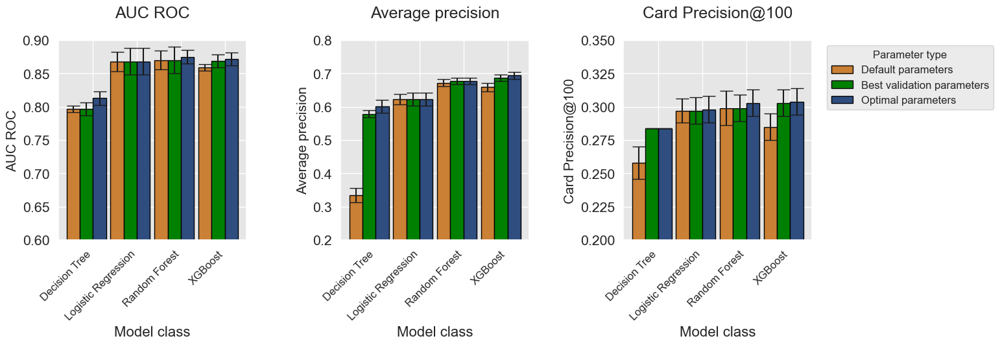

In [219]:
get_model_selection_performances_plots(performances_df_dictionary, 
                                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'])
    

In [220]:
execution_times=[execution_time_dt,execution_time_lr,
                 execution_time_rf,execution_time_boosting]

In [221]:
%%capture

fig_model_selection_execution_times_for_each_model_class, ax = plt.subplots(1, 1, figsize=(5,4))

model_classes=['Decision Tree','Logistic Regression','Random Forest','XGBoost']
    
# width of the bars
barWidth = 0.3
# The x position of bars
r1 = np.arange(len(model_classes))
    
# Create execution times bars
ax.bar(r1, execution_times[0:4], 
        width = barWidth, color = 'black', edgecolor = 'black', 
        capsize=7)

ax.set_xticks(r1+barWidth/2)
ax.set_xticklabels(model_classes, rotation = 45, ha="right", fontsize=12)
ax.set_title('Model selection execution times \n for different model classes', fontsize=18)
ax.set_xlabel("Model class", fontsize=16)
ax.set_ylabel("Execution times (s)", fontsize=15)

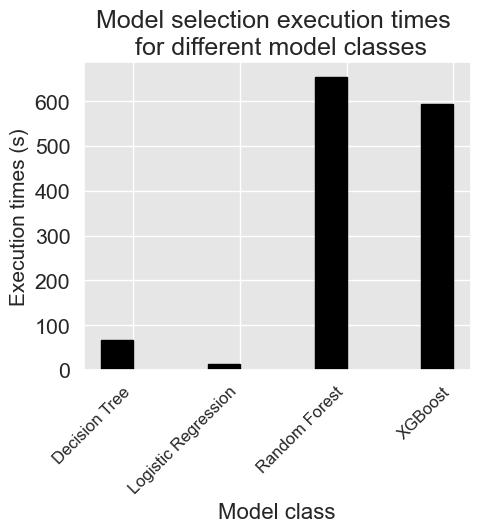

In [222]:
fig_model_selection_execution_times_for_each_model_class

In [223]:
def prequential_parameters_search(transactions_df, 
                            classifier, 
                            input_features, output_feature, 
                            parameters, scoring, 
                            start_date_training, 
                            n_folds=4,
                            expe_type='Test',
                            delta_train=7, 
                            delta_delay=7, 
                            delta_assessment=7,
                            performance_metrics_list_grid=['roc_auc'],
                            performance_metrics_list=['AUC ROC'],
                            type_search='grid',
                            n_iter=10,
                            random_state=0,
                            n_jobs=-1):
    
    estimators = [('scaler', sklearn.preprocessing.StandardScaler()), ('clf', classifier)]
    pipe = sklearn.pipeline.Pipeline(estimators)
    
    prequential_split_indices=prequentialSplit(transactions_df,
                                               start_date_training=start_date_training, 
                                               n_folds=n_folds, 
                                               delta_train=delta_train, 
                                               delta_delay=delta_delay, 
                                               delta_assessment=delta_assessment)
    
    parameters_search = None
    
    if type_search=="grid":
        
        parameters_search = sklearn.model_selection.GridSearchCV(pipe, parameters, scoring=scoring, cv=prequential_split_indices, 
                                         refit=False, n_jobs=n_jobs)
    
    if type_search=="random":
        
        parameters_search = sklearn.model_selection.RandomizedSearchCV(pipe, parameters, scoring=scoring, cv=prequential_split_indices, 
                                     refit=False, n_jobs=n_jobs,n_iter=n_iter,random_state=random_state)

    
    X=transactions_df[input_features]
    y=transactions_df[output_feature]

    parameters_search.fit(X, y)
    
    performances_df=pd.DataFrame()
    
    for i in range(len(performance_metrics_list_grid)):
        performances_df[performance_metrics_list[i]+' '+expe_type]=parameters_search.cv_results_['mean_test_'+performance_metrics_list_grid[i]]
        performances_df[performance_metrics_list[i]+' '+expe_type+' Std']=parameters_search.cv_results_['std_test_'+performance_metrics_list_grid[i]]

    performances_df['Parameters']=parameters_search.cv_results_['params']
    performances_df['Execution time']=parameters_search.cv_results_['mean_fit_time']
    
    return performances_df

In [224]:
def model_selection_wrapper(transactions_df, 
                            classifier, 
                            input_features, output_feature,
                            parameters, 
                            scoring, 
                            start_date_training_for_valid,
                            start_date_training_for_test,
                            n_folds=4,
                            delta_train=7, 
                            delta_delay=7, 
                            delta_assessment=7,
                            performance_metrics_list_grid=['roc_auc'],
                            performance_metrics_list=['AUC ROC'],
                            type_search='grid',
                            n_iter=10,
                            random_state=0,
                            n_jobs=-1):

    # Get performances on the validation set using prequential validation
    performances_df_validation=prequential_parameters_search(transactions_df, classifier, 
                            input_features, output_feature,
                            parameters, scoring, 
                            start_date_training=start_date_training_for_valid,
                            n_folds=n_folds,
                            expe_type='Validation',
                            delta_train=delta_train, 
                            delta_delay=delta_delay, 
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            type_search=type_search,
                            n_iter=n_iter,
                            random_state=random_state,
                            n_jobs=n_jobs)
    
    # Get performances on the test set using prequential validation
    performances_df_test=prequential_parameters_search(transactions_df, classifier, 
                            input_features, output_feature,
                            parameters, scoring, 
                            start_date_training=start_date_training_for_test,
                            n_folds=n_folds,
                            expe_type='Test',
                            delta_train=delta_train, 
                            delta_delay=delta_delay, 
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            type_search=type_search,
                            n_iter=n_iter,
                            random_state=random_state,
                            n_jobs=n_jobs)
    
    # Bind the two resulting DataFrames
    performances_df_validation.drop(columns=['Parameters','Execution time'], inplace=True)
    performances_df=pd.concat([performances_df_test,performances_df_validation],axis=1)

    # And return as a single DataFrame
    return performances_df

In [225]:
classifier = xgboost.XGBClassifier()

parameters = {'clf__max_depth':[3,6,9], 'clf__n_estimators':[25,50,100],'clf__learning_rate':[0.1,0.3],
              'clf__random_state':[0],'clf__n_jobs':[1],'clf__n_verbosity':[0]}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        type_search='random',
                                        n_iter=10,
                                        random_state=0,
                                        n_jobs=1)

execution_time_boosting_random = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__n_estimators'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__learning_rate'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_depth'])
                                   for i in range(len(parameters_dict))]

# Rename to performances_df_xgboost_random for model performance comparison
performances_df_xgboost_random=performances_df

[23:25:29] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not used.

[23:25:32] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not used.

[23:25:34] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not used.

[23:25:36] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not used.

[23:25:38] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not us

[23:28:46] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not used.

[23:28:48] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not used.

[23:28:50] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not used.

[23:28:52] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not used.

[23:28:54] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_verbosity" } are not us

In [226]:
performances_df_xgboost_random

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.864766,0.006604,0.666130,0.012722,0.301429,0.013439,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",1.961327,0.863627,0.003203,0.651369,0.030279,0.280714,0.014932,50/0.1/3
1,0.851328,0.003119,0.655970,0.011626,0.303571,0.011715,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",2.148774,0.854394,0.008558,0.656965,0.023941,0.281786,0.013377,25/0.1/9
2,0.862069,0.008130,0.673361,0.008322,0.293571,0.012797,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",10.528423,0.879924,0.004621,0.702057,0.017547,0.284643,0.018333,100/0.1/9
3,0.871726,0.010990,0.686534,0.011086,0.302143,0.013458,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",1.781929,0.882839,0.008380,0.708226,0.020697,0.287500,0.016331,50/0.3/3
4,0.859138,0.004852,0.659458,0.012488,0.285357,0.010369,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",7.275443,0.878025,0.007150,0.691442,0.016375,0.279643,0.013567,100/0.3/6
5,0.871558,0.014238,0.686319,0.012066,0.301786,0.009603,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",3.379243,0.869654,0.002863,0.699780,0.016875,0.288214,0.016884,50/0.1/6
6,0.870792,0.012352,0.694030,0.008394,0.303929,0.012305,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",3.895612,0.878438,0.009221,0.705235,0.019756,0.288214,0.015694,100/0.1/3
7,0.861064,0.006459,0.661853,0.008886,0.288214,0.008943,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",5.560635,0.876392,0.006354,0.692759,0.017801,0.280357,0.014441,50/0.3/9
8,0.861495,0.004203,0.660145,0.011527,0.288214,0.009442,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",9.772482,0.879577,0.006008,0.690895,0.016712,0.278571,0.015286,100/0.3/9
9,0.870988,0.014197,0.678544,0.012501,0.303214,0.012592,"{'clf__random_state': 0, 'clf__n_verbosity': 0...",1.310534,0.877231,0.006120,0.698490,0.022835,0.288929,0.015131,25/0.3/3


In [227]:
summary_performances_xgboost_random=get_summary_performances(performances_df_xgboost_random, parameter_column_name="Parameters summary")
summary_performances_xgboost_random

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,50/0.3/3,50/0.3/3,25/0.3/3
Validation performance,0.883+/-0.01,0.708+/-0.02,0.289+/-0.02
Test performance,0.872+/-0.01,0.687+/-0.01,0.303+/-0.01
Optimal parameters,50/0.3/3,100/0.1/3,100/0.1/3
Optimal test performance,0.872+/-0.01,0.694+/-0.01,0.304+/-0.01


In [228]:
# Performances with grid search
summary_performances_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,100/0.3/3,50/0.3/3,25/0.3/3
Validation performance,0.887+/-0.01,0.708+/-0.02,0.289+/-0.02
Test performance,0.869+/-0.01,0.687+/-0.01,0.303+/-0.01
Optimal parameters,50/0.3/3,100/0.1/3,100/0.1/3
Optimal test performance,0.872+/-0.01,0.694+/-0.01,0.304+/-0.01


In [229]:
print("Total execution time for XGBoost with grid search: "+str(round(execution_time_boosting,2))+"s")
print("Total execution time for XGBoost with random search: "+str(round(execution_time_boosting_random,2))+"s")

Total execution time for XGBoost with grid search: 593.72s
Total execution time for XGBoost with random search: 392.15s


In [230]:
performances_df_dictionary={
    "Decision Tree": performances_df_dt,
    "Logistic Regression": performances_df_lr,
    "Random Forest": performances_df_rf,
    "XGBoost": performances_df_xgboost,
    "XGBoost Random": performances_df_xgboost_random
}

execution_times=[execution_time_dt,
                 execution_time_lr,
                 execution_time_rf,
                 execution_time_boosting,
                 execution_time_boosting_random]

In [231]:
filehandler = open('performances_model_selection.pkl', 'wb') 
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

In [232]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py
#%run ../Chapter_References/shared_functions.ipynb

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed
        

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:04 --:--:--     0
  0 63257    0     0    0     0      0      0 --:--:--  0:00:05 --:--:--     0
 28 63257   28 18288    0     0   3174      0  0:00:19  0:00:05  0:00:14  4334
100 63257  100 63257    0     0  10222      0  0:00:06  0:00:06 --:--:-- 18094


<Figure size 640x480 with 0 Axes>

In [233]:
import pickle
filehandler = open('images/performances_train_test_real_world_data.pkl', 'rb') 
performances_df = pickle.load(filehandler)

In [234]:
performances_df

,AUC ROC Test,Average precision Test,Card Precision@100 Test,AUC ROC Train,Average precision Train,Card Precision@100 Train,Execution time,Parameters summary
0,0.626,0.024,0.077,0.639,0.063,0.147,19.533309,2
1,0.715,0.032,0.134,0.736,0.094,0.233,22.060830,3
2,0.755,0.037,0.149,0.792,0.121,0.251,24.506536,4
3,0.791,0.045,0.187,0.815,0.154,0.317,27.029386,5
4,0.812,0.049,0.196,0.847,0.184,0.351,29.506857,6
5,0.826,0.029,0.114,0.868,0.213,0.414,32.073183,7
6,0.838,0.020,0.070,0.886,0.244,0.467,34.493712,8
7,0.831,0.020,0.049,0.895,0.282,0.500,37.152258,9
8,0.831,0.018,0.056,0.907,0.322,0.566,39.713055,10
9,0.520,0.008,0.014,0.973,0.758,0.983,63.055570,20


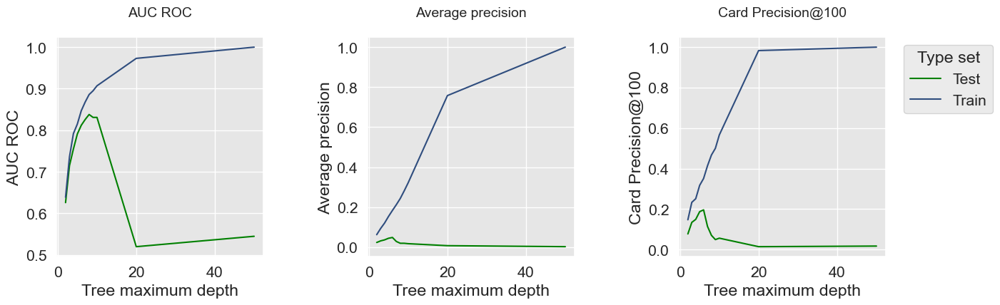

In [235]:
get_performances_plots(performances_df, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Train'],expe_type_color_list=['#008000','#2F4D7E'])

In [236]:
filehandler = open('images/performances_model_selection_real_world_data.pkl', 'rb') 
(performances_df_dictionary, execution_times) = pickle.load(filehandler)

In [237]:
performances_df_dictionary.keys()

dict_keys(['Decision Tree', 'Random Forest', 'XGBoost', 'Logistic Regression', 'XGBoost Random'])

In [238]:
execution_times

[1617.0470759868622,
 694.7196891307831,
 3615.5994658470154,
 8788.51293516159,
 5527.099639177322]

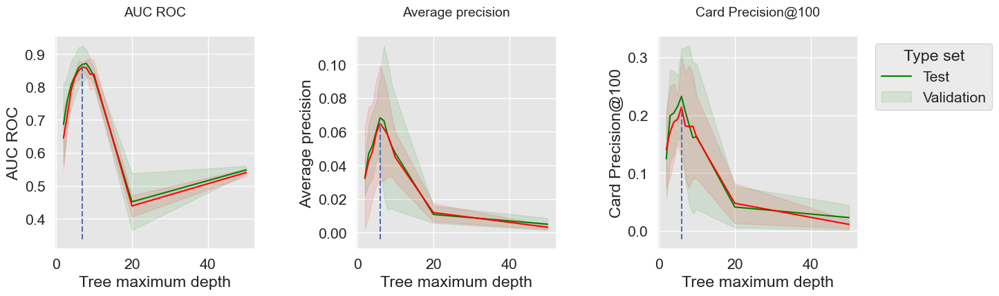

In [239]:
performances_df_dt=performances_df_dictionary['Decision Tree']
summary_performances_dt=get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_dt, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       summary_performances=summary_performances_dt)

In [240]:
summary_performances_dt

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,7,6,6
Validation performance,0.861+/-0.01,0.065+/-0.02,0.214+/-0.04
Test performance,0.869+/-0.03,0.068+/-0.01,0.232+/-0.04
Optimal parameter(s),8,6,6
Optimal test performance,0.872+/-0.02,0.068+/-0.01,0.232+/-0.04


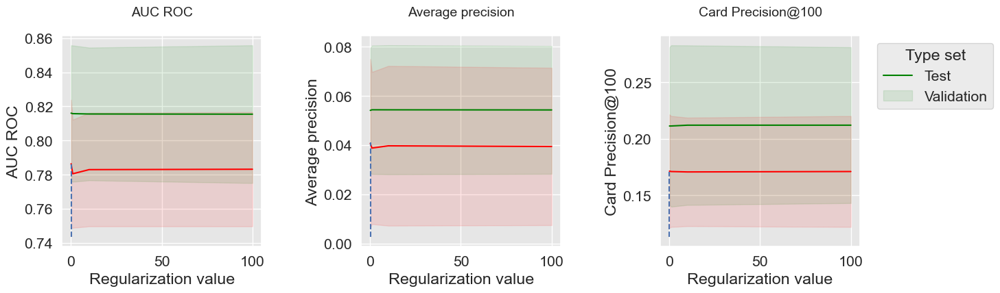

In [241]:
performances_df_lr=performances_df_dictionary['Logistic Regression']
summary_performances_lr=get_summary_performances(performances_df_lr, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_lr, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name='Regularization value',
                       summary_performances=summary_performances_lr)

In [242]:
summary_performances_lr

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.1,0.1,0.1
Validation performance,0.786+/-0.02,0.041+/-0.02,0.171+/-0.03
Test performance,0.816+/-0.02,0.054+/-0.01,0.211+/-0.03
Optimal parameter(s),0.1,1.0,10.0
Optimal test performance,0.816+/-0.02,0.054+/-0.01,0.212+/-0.04


In [243]:
performances_df_rf=performances_df_dictionary['Random Forest']
summary_performances_rf=get_summary_performances(performances_df_rf, parameter_column_name="Parameters summary")
summary_performances_rf

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,25/10,100/10,100/10
Validation performance,0.917+/-0.0,0.093+/-0.02,0.258+/-0.03
Test performance,0.912+/-0.02,0.08+/-0.03,0.227+/-0.05
Optimal parameter(s),100/10,100/10,50/5
Optimal test performance,0.912+/-0.02,0.08+/-0.03,0.227+/-0.04


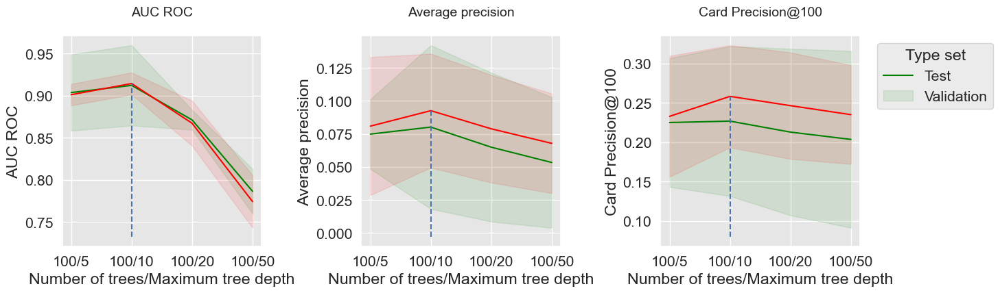

In [244]:
performances_df_rf_fixed_number_of_trees=performances_df_rf[performances_df_rf["Parameters summary"].str.startswith("100")]

summary_performances_fixed_number_of_trees=get_summary_performances(performances_df_rf_fixed_number_of_trees, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_rf_fixed_number_of_trees, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_number_of_trees)

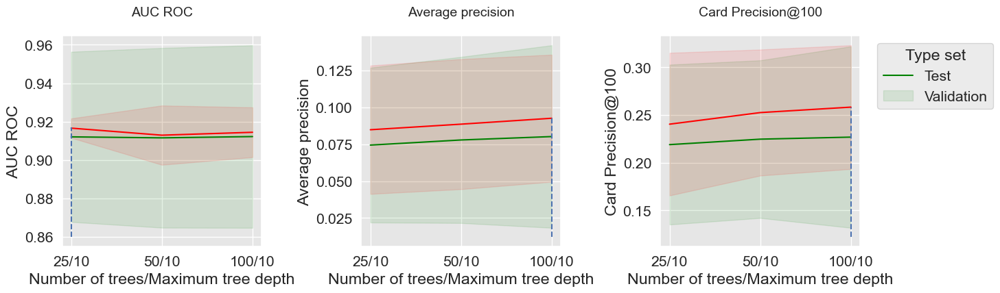

In [245]:
performances_df_rf_fixed_max_tree_depth=performances_df_rf[performances_df_rf["Parameters summary"].str.endswith("10")]

summary_performances_fixed_max_tree_depth=get_summary_performances(performances_df_rf_fixed_max_tree_depth, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_rf_fixed_max_tree_depth, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_max_tree_depth)

In [246]:
performances_df_xgboost=performances_df_dictionary['XGBoost']
summary_performances_xgboost=get_summary_performances(performances_df_xgboost, parameter_column_name="Parameters summary")
summary_performances_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,100/0.1/6,100/0.1/6,100/0.1/6
Validation performance,0.924+/-0.01,0.102+/-0.02,0.261+/-0.02
Test performance,0.928+/-0.01,0.095+/-0.03,0.235+/-0.07
Optimal parameter(s),100/0.1/6,100/0.1/6,50/0.1/6
Optimal test performance,0.928+/-0.01,0.095+/-0.03,0.249+/-0.04


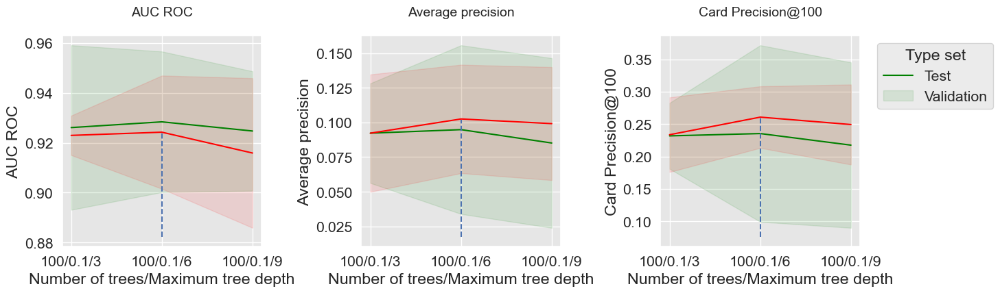

In [247]:
performances_df_xgboost_fixed_number_of_trees=performances_df_xgboost[performances_df_xgboost["Parameters summary"].str.startswith("100/0.1")]

summary_performances_fixed_number_of_trees=get_summary_performances(performances_df_xgboost_fixed_number_of_trees, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_xgboost_fixed_number_of_trees, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_number_of_trees)

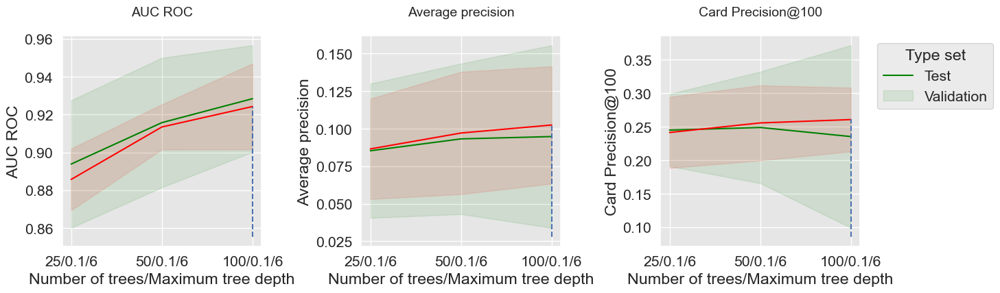

In [248]:
performances_df_xgboost_fixed_max_tree_depth=performances_df_xgboost[performances_df_xgboost["Parameters summary"].str.endswith("0.1/6")]

summary_performances_fixed_max_tree_depth=get_summary_performances(performances_df_xgboost_fixed_max_tree_depth, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_xgboost_fixed_max_tree_depth, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Number of trees/Maximum tree depth",
                       summary_performances=summary_performances_fixed_max_tree_depth)

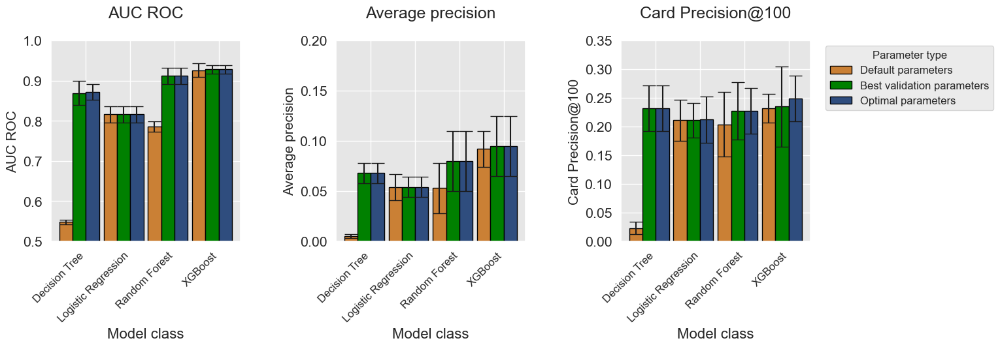

In [249]:
get_model_selection_performances_plots(performances_df_dictionary, 
                                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'],
                                       ylim_list=[[0.5,1],[0,0.2],[0,0.35]],
                                       model_classes=['Decision Tree', 
                                                      'Logistic Regression', 
                                                      'Random Forest', 
                                                      'XGBoost'])
    

In [250]:
%%capture

fig_model_selection_execution_times_for_each_model_class, ax = plt.subplots(1, 1, figsize=(5,4))

model_classes=['Decision Tree','Logistic Regression','Random Forest','XGBoost']
    
# width of the bars
barWidth = 0.3
# The x position of bars
r1 = np.arange(len(model_classes))
    
# Create execution times bars
ax.bar(r1, execution_times[0:4], 
        width = barWidth, color = 'black', edgecolor = 'black', 
        capsize=7)

ax.set_xticks(r1+barWidth/2)
ax.set_xticklabels(model_classes, rotation = 45, ha="right", fontsize=12)
ax.set_title('Model selection execution times \n for different model classes', fontsize=18)
ax.set_xlabel("Model class", fontsize=16)
ax.set_ylabel("Execution times (s)", fontsize=15)

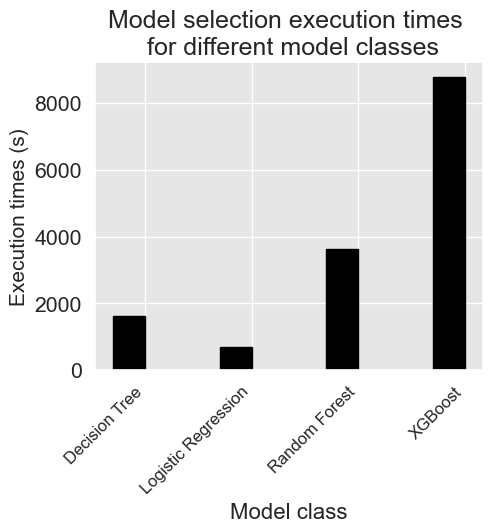

In [251]:
fig_model_selection_execution_times_for_each_model_class

In [252]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py
#%run ../Chapter_References/shared_functions.ipynb

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed
        

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0 63257    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 63257  100 63257    0     0  58181      0  0:00:01  0:00:01 --:--:-- 58247


<Figure size 640x480 with 0 Axes>

In [253]:
X, y = sklearn.datasets.make_classification(n_samples=5000, n_features=2, n_informative=2,
                                            n_redundant=0, n_repeated=0, n_classes=2,
                                            n_clusters_per_class=1,
                                            weights=[0.95, 0.05],
                                            class_sep=0.5, random_state=0)

dataset_df = pd.DataFrame({'X1':X[:,0],'X2':X[:,1], 'Y':y})

In [254]:
%%capture
fig_distribution, ax = plt.subplots(1, 1, figsize=(5,5))

groups = dataset_df.groupby('Y')
for name, group in groups:
    ax.scatter(group.X1, group.X2, edgecolors='k', label=name,alpha=1,marker='o')
    
ax.legend(loc='upper left', 
          bbox_to_anchor=(1.05, 1),
          title="Class")

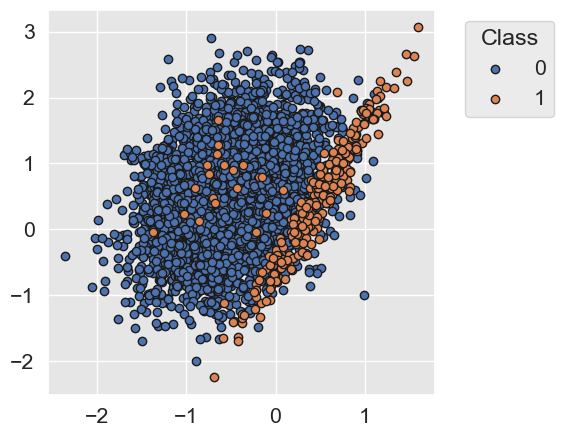

In [255]:
fig_distribution

In [256]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5,class_weight={0:1,1:1},random_state=0)
cv = sklearn.model_selection.StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

In [257]:
cv_results_ = sklearn.model_selection.cross_validate(classifier, X, y, cv=cv,
                                                     scoring=['roc_auc',
                                                              'average_precision',
                                                              'balanced_accuracy'],
                                                     return_estimator=True)

In [258]:
results = round(pd.DataFrame(cv_results_),3)
results

,fit_time,score_time,estimator,test_roc_auc,test_average_precision,test_balanced_accuracy
0,0.006,0.003,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.933,0.616,0.842
1,0.006,0.002,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.871,0.493,0.739
2,0.006,0.002,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.897,0.493,0.799
3,0.006,0.002,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.928,0.591,0.812
4,0.007,0.002,"DecisionTreeClassifier(class_weight={0: 1, 1: ...",0.901,0.447,0.738


In [259]:
results_mean = list(results.mean().values)
results_std = list(results.std().values)

pd.DataFrame([[str(round(results_mean[i],3))+'+/-'+str(round(results_std[i],3)) for i in range(len(results))]],
            columns=['Fit time (s)','Score time (s)','AUC ROC','Average Precision','Balanced accuracy'])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
0,0.006+/-0.0,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046


In [260]:
def plot_decision_boundary_classifier(ax, 
                                      classifier,
                                      train_df,
                                      input_features=['X1','X2'],
                                      output_feature='Y',
                                      title="",
                                      fs=14,
                                      plot_training_data=True):

    plot_colors = ["tab:blue","tab:orange"]

    x1_min, x1_max = train_df[input_features[0]].min() - 1, train_df[input_features[0]].max() + 1
    x2_min, x2_max = train_df[input_features[1]].min() - 1, train_df[input_features[1]].max() + 1
    
    plot_step=0.1
    xx, yy = np.meshgrid(np.arange(x1_min, x1_max, plot_step),
                         np.arange(x2_min, x2_max, plot_step))

    Z = classifier.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:,1]
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu_r,alpha=0.3)

    if plot_training_data:
        # Plot the training points
        groups = train_df.groupby(output_feature)
        for name, group in groups:
            ax.scatter(group[input_features[0]], group[input_features[1]], edgecolors='black', label=name)
        
    ax.set_title(title, fontsize=fs)
    ax.set_xlabel(input_features[0], fontsize=fs)
    ax.set_ylabel(input_features[1], fontsize=fs)
    

In [261]:
# Retrieve the decision tree from the first fold of the cross-validation
classifier_0 = cv_results_['estimator'][0]

In [262]:
# Retrieve the indices used for the training and testing of the first fold of the cross-validation
(train_index, test_index) = next(cv.split(X, y))

# Recreate the train and test DafaFrames from these indices
train_df = pd.DataFrame({'X1':X[train_index,0], 'X2':X[train_index,1], 'Y':y[train_index]})
test_df = pd.DataFrame({'X1':X[test_index,0], 'X2':X[test_index,1], 'Y':y[test_index]})
input_features = ['X1','X2']
output_feature = 'Y'

In [263]:
%%capture
fig_decision_boundary, ax = plt.subplots(1, 3, figsize=(5*3,5))

plot_decision_boundary_classifier(ax[0], classifier_0,
                                  train_df,
                                  title="Decision surface of the decision tree\n With training data",
                                  plot_training_data=True)

plot_decision_boundary_classifier(ax[1], classifier_0,
                                  train_df,
                                  title="Decision surface of the decision tree\n",
                                  plot_training_data=False)


plot_decision_boundary_classifier(ax[2], classifier_0,
                                  test_df,
                                  title="Decision surface of the decision tree\n With test data",
                                  plot_training_data=True)

ax[-1].legend(loc='upper left', 
              bbox_to_anchor=(1.05, 1),
              title="Class")

sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlBu_r, norm=plt.Normalize(vmin=0, vmax=1))
cax = fig_decision_boundary.add_axes([0.93, 0.15, 0.02, 0.5])
fig_decision_boundary.colorbar(sm, cax=cax, alpha=0.3, boundaries=np.linspace(0, 1, 11))

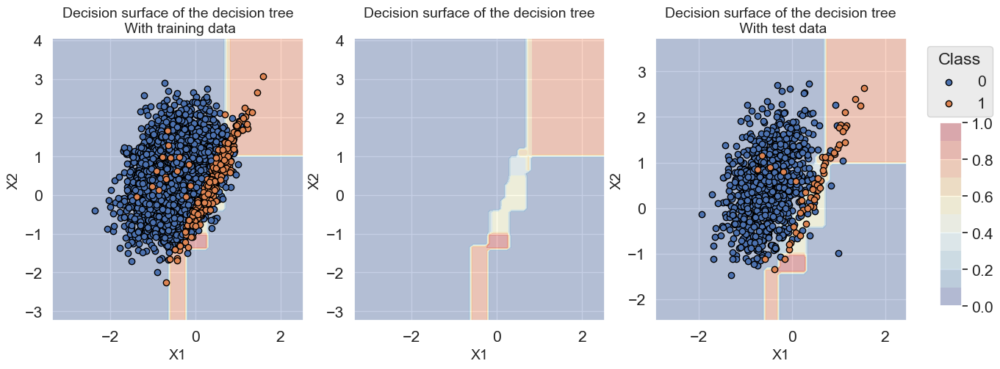

In [264]:
fig_decision_boundary

In [265]:
def kfold_cv_with_classifier(classifier,
                             X,
                             y,
                             n_splits=5,
                             strategy_name="Basline classifier"):
    
    cv = sklearn.model_selection.StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=0)
    
    cv_results_ = sklearn.model_selection.cross_validate(classifier,X,y,cv=cv,
                                                         scoring=['roc_auc',
                                                                  'average_precision',
                                                                  'balanced_accuracy'],
                                                         return_estimator=True)
    
    results = round(pd.DataFrame(cv_results_),3)
    results_mean = list(results.mean().values)
    results_std = list(results.std().values)
    results_df = pd.DataFrame([[str(round(results_mean[i],3))+'+/-'+
                                str(round(results_std[i],3)) for i in range(len(results))]],
                              columns=['Fit time (s)','Score time (s)',
                                       'AUC ROC','Average Precision','Balanced accuracy'])
    results_df.rename(index={0:strategy_name}, inplace=True)
    
    classifier_0 = cv_results_['estimator'][0]
    
    (train_index, test_index) = next(cv.split(X, y))
    train_df = pd.DataFrame({'X1':X[train_index,0], 'X2':X[train_index,1], 'Y':y[train_index]})
    test_df = pd.DataFrame({'X1':X[test_index,0], 'X2':X[test_index,1], 'Y':y[test_index]})
    
    return (results_df, classifier_0, train_df, test_df)

In [266]:
def plot_decision_boundary(classifier_0,
                           train_df, 
                           test_df):
    
    fig_decision_boundary, ax = plt.subplots(1, 3, figsize=(5*3,5))

    plot_decision_boundary_classifier(ax[0], classifier_0,
                                  train_df,
                                  title="Decision surface of the decision tree\n With training data",
                                  plot_training_data=True)

    plot_decision_boundary_classifier(ax[1], classifier_0,
                                  train_df,
                                  title="Decision surface of the decision tree\n",
                                  plot_training_data=False)


    plot_decision_boundary_classifier(ax[2], classifier_0,
                                  test_df,
                                  title="Decision surface of the decision tree\n With test data",
                                  plot_training_data=True)

    ax[-1].legend(loc='upper left', 
                  bbox_to_anchor=(1.05, 1),
                  title="Class")

    sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlBu_r, norm=plt.Normalize(vmin=0, vmax=1))
    cax = fig_decision_boundary.add_axes([0.93, 0.15, 0.02, 0.5])
    fig_decision_boundary.colorbar(sm, cax=cax, alpha=0.3, boundaries=np.linspace(0, 1, 11))
    
    return fig_decision_boundary

In [267]:
%%capture
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5,class_weight={0:1,1:1},random_state=0)


(results_df_dt_baseline, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                                     X, y, 
                                                                                     n_splits=5,
                                                                                     strategy_name="Decision tree - Baseline")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [268]:
results_df_dt_baseline

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.006+/-0.0,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046


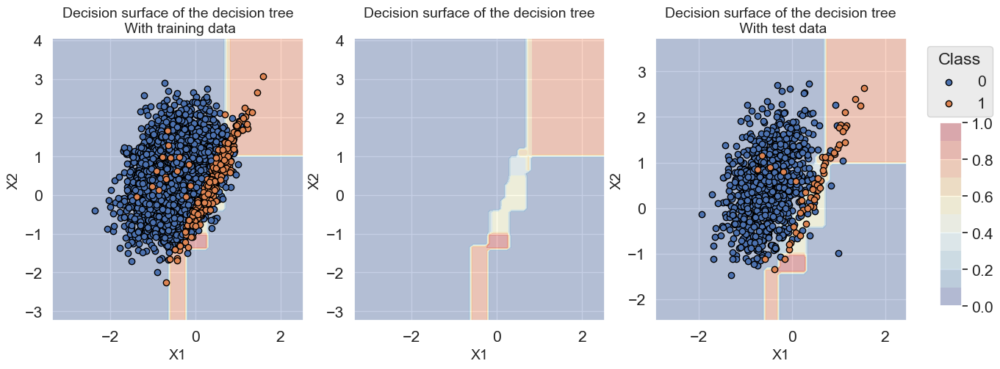

In [269]:
fig_decision_boundary

In [270]:
IR=0.05/0.95

In [271]:
class_weight={0:IR,1:1}

In [272]:
%%capture
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5,class_weight=class_weight,random_state=0)

(results_df_dt_cost_sensitive, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                         X, y, 
                                                                         n_splits=5,
                                                                         strategy_name="Decision tree - Cost-sensitive")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [273]:
pd.concat([results_df_dt_baseline, 
           results_df_dt_cost_sensitive])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.006+/-0.0,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - Cost-sensitive,0.006+/-0.0,0.002+/-0.0,0.887+/-0.034,0.471+/-0.059,0.898+/-0.021


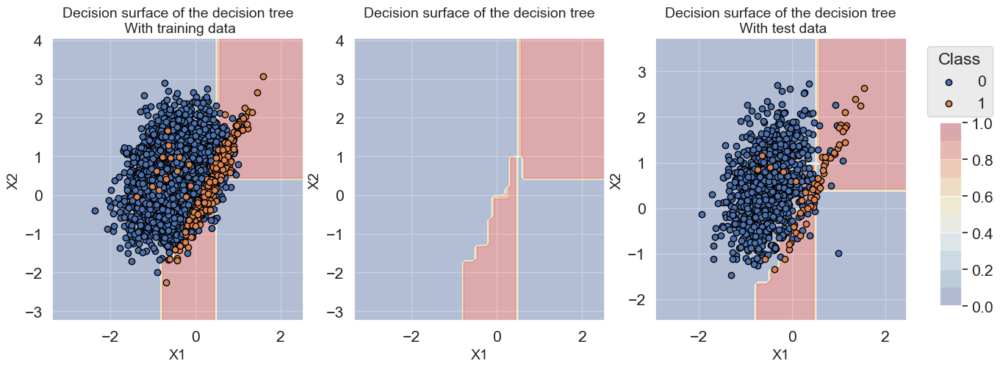

In [274]:
fig_decision_boundary

In [275]:
%%capture
classifier = sklearn.linear_model.LogisticRegression(C=1,class_weight={0:1,1:1},random_state=0)

(results_df_lr_baseline, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                          X, y, 
                                                                          n_splits=5,
                                                                          strategy_name="Logistic regression - Baseline")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [276]:
results_df_lr_baseline

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Logistic regression - Baseline,0.004+/-0.001,0.002+/-0.0,0.937+/-0.012,0.535+/-0.065,0.641+/-0.048


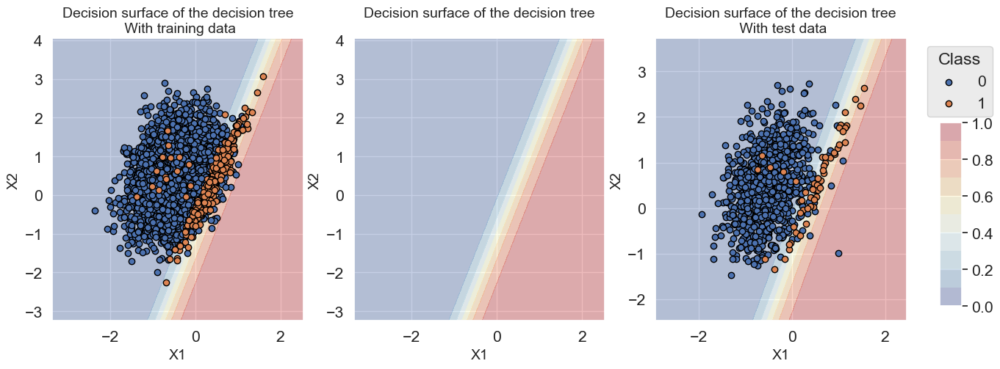

In [277]:
fig_decision_boundary

In [278]:
%%capture
classifier = sklearn.linear_model.LogisticRegression(C=1,class_weight={0:IR,1:1},random_state=0)

(results_df_lr_cost_sensitive, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                         X, y, 
                                                                         n_splits=5,
                                                                         strategy_name="Logistic regression - Cost-sensitive")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [279]:
pd.concat([results_df_lr_baseline, results_df_lr_cost_sensitive])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Logistic regression - Baseline,0.004+/-0.001,0.002+/-0.0,0.937+/-0.012,0.535+/-0.065,0.641+/-0.048
Logistic regression - Cost-sensitive,0.003+/-0.0,0.002+/-0.0,0.937+/-0.012,0.536+/-0.064,0.899+/-0.01


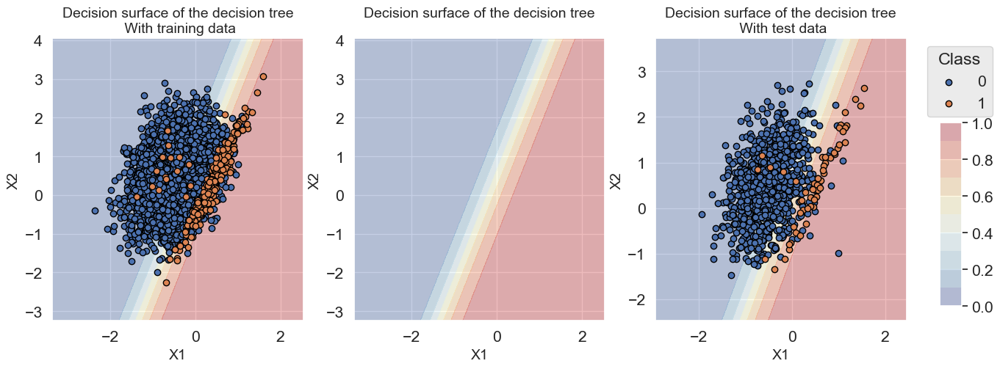

In [280]:
fig_decision_boundary

In [281]:
results_df = pd.concat([results_df_dt_baseline,
                        results_df_dt_cost_sensitive,
                        results_df_lr_baseline,
                        results_df_lr_cost_sensitive])
results_df

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.006+/-0.0,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - Cost-sensitive,0.006+/-0.0,0.002+/-0.0,0.887+/-0.034,0.471+/-0.059,0.898+/-0.021
Logistic regression - Baseline,0.004+/-0.001,0.002+/-0.0,0.937+/-0.012,0.535+/-0.065,0.641+/-0.048
Logistic regression - Cost-sensitive,0.003+/-0.0,0.002+/-0.0,0.937+/-0.012,0.536+/-0.064,0.899+/-0.01


In [282]:
# Load data from the 2018-07-11 to the 2018-09-14

DIR_INPUT = 'simulated-data-transformed/data/' 

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df = read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))


# Number of folds for the prequential validation
n_folds = 4

# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = delta_valid = delta_assessment = 7

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)

output_feature = "TX_FRAUD"

input_features = ['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']


# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom, 
                                                     needs_proba=True, 
                                                     top_k=100, 
                                                     transactions_df=transactions_df_scorer)

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

Load  files
CPU times: total: 500 ms
Wall time: 903 ms
919767 transactions loaded, containing 8195 fraudulent transactions


In [283]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0],
              'clf__class_weight':[{0: w} for w in [0.01, 0.05, 0.1, 0.5, 1]]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df = model_selection_wrapper(transactions_df, classifier, 
                                          input_features, output_feature,
                                          parameters, scoring, 
                                          start_date_training_for_valid,
                                          start_date_training_for_test,
                                          n_folds=n_folds,
                                          delta_train=delta_train, 
                                          delta_delay=delta_delay, 
                                          delta_assessment=delta_assessment,
                                          performance_metrics_list_grid=performance_metrics_list_grid,
                                          performance_metrics_list=performance_metrics_list,
                                          n_jobs=1)

execution_time_dt = time.time()-start_time

In [284]:
# Select parameter of interest (class_weight)
parameters_dict = dict(performances_df['Parameters'])
performances_df['Parameters summary'] = [parameters_dict[i]['clf__class_weight'][0] for i in range(len(parameters_dict))]

# Rename to performances_df_dt for model performance comparison at the end of this notebook
performances_df_dt = performances_df

In [285]:
performances_df_dt

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.825500,0.009464,0.537440,0.033668,0.289286,0.010903,"{'clf__class_weight': {0: 0.01}, 'clf__max_dep...",0.392302,0.837454,0.014356,0.532924,0.025252,0.277500,0.010944,0.01
1,0.792912,0.029734,0.561153,0.046031,0.273571,0.019418,"{'clf__class_weight': {0: 0.05}, 'clf__max_dep...",0.396790,0.808213,0.022140,0.565880,0.027737,0.266071,0.013716,0.05
2,0.784486,0.031698,0.556320,0.031025,0.272143,0.019548,"{'clf__class_weight': {0: 0.1}, 'clf__max_dept...",0.394069,0.814153,0.023492,0.572758,0.029783,0.269643,0.015791,0.10
3,0.798043,0.020988,0.579394,0.016007,0.278214,0.003093,"{'clf__class_weight': {0: 0.5}, 'clf__max_dept...",0.390877,0.799682,0.013524,0.568408,0.018631,0.265000,0.013420,0.50
4,0.810138,0.008586,0.600306,0.016797,0.284286,0.004286,"{'clf__class_weight': {0: 1}, 'clf__max_depth'...",0.400383,0.804218,0.016505,0.546094,0.042197,0.267857,0.013869,1.00


In [286]:
summary_performances_dt = get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")
summary_performances_dt

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.01,0.1,0.01
Validation performance,0.837+/-0.01,0.573+/-0.03,0.278+/-0.01
Test performance,0.825+/-0.01,0.556+/-0.03,0.289+/-0.01
Optimal parameter(s),0.01,1.0,0.01
Optimal test performance,0.825+/-0.01,0.6+/-0.02,0.289+/-0.01


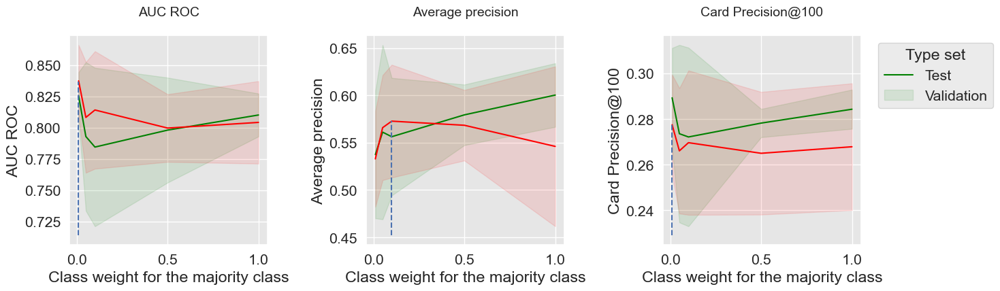

In [287]:
get_performances_plots(performances_df_dt, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Class weight for the majority class",
                       summary_performances=summary_performances_dt)

In [288]:
# Define classifier
classifier = sklearn.linear_model.LogisticRegression()

# Set of parameters for which to assess model performances
parameters = {'clf__C':[1], 'clf__random_state':[0],
              'clf__class_weight':[{0: w} for w in [0.01, 0.05, 0.1, 0.5, 1]]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df = model_selection_wrapper(transactions_df, classifier, 
                                          input_features, output_feature,
                                          parameters, scoring, 
                                          start_date_training_for_valid,
                                          start_date_training_for_test,
                                          n_folds=n_folds,
                                          delta_train=delta_train, 
                                          delta_delay=delta_delay, 
                                          delta_assessment=delta_assessment,
                                          performance_metrics_list_grid=performance_metrics_list_grid,
                                          performance_metrics_list=performance_metrics_list,
                                          n_jobs=1)

execution_time_lr = time.time()-start_time

In [289]:
# Select parameter of interest (class_weight)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__class_weight'][0] for i in range(len(parameters_dict))]

# Rename to performances_df_dt for model performance comparison at the end of this notebook
performances_df_lr=performances_df

In [290]:
performances_df_lr

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.871396,0.017137,0.571129,0.028027,0.293929,0.010120,"{'clf__C': 1, 'clf__class_weight': {0: 0.01}, ...",0.230702,0.871069,0.009955,0.497808,0.039734,0.276429,0.013190,0.01
1,0.870711,0.016332,0.604805,0.015834,0.296786,0.009813,"{'clf__C': 1, 'clf__class_weight': {0: 0.05}, ...",0.255333,0.870584,0.008772,0.550617,0.029466,0.278571,0.015085,0.05
2,0.870083,0.016028,0.613923,0.014765,0.296429,0.008950,"{'clf__C': 1, 'clf__class_weight': {0: 0.1}, '...",0.245768,0.869906,0.008720,0.579392,0.019886,0.278214,0.014156,0.10
3,0.868234,0.015572,0.621852,0.015687,0.297500,0.008770,"{'clf__C': 1, 'clf__class_weight': {0: 0.5}, '...",0.270530,0.867853,0.008948,0.608950,0.023132,0.277143,0.015286,0.50
4,0.867643,0.015404,0.623081,0.016204,0.297143,0.008806,"{'clf__C': 1, 'clf__class_weight': {0: 1}, 'cl...",0.288587,0.866861,0.008988,0.612264,0.023474,0.278214,0.016914,1.00


In [291]:
summary_performances_lr = get_summary_performances(performances_df_lr, parameter_column_name="Parameters summary")
summary_performances_lr

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.01,1.0,0.05
Validation performance,0.871+/-0.01,0.612+/-0.02,0.279+/-0.02
Test performance,0.871+/-0.02,0.623+/-0.02,0.297+/-0.01
Optimal parameter(s),0.01,1.0,0.5
Optimal test performance,0.871+/-0.02,0.623+/-0.02,0.298+/-0.01


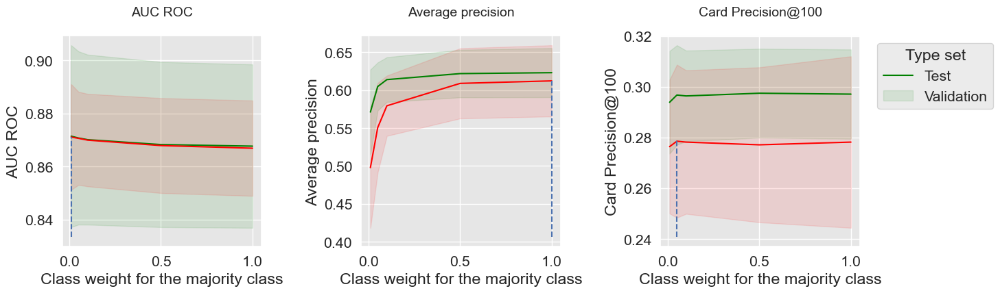

In [292]:
get_performances_plots(performances_df_lr, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Class weight for the majority class",
                       summary_performances=summary_performances_lr)

In [293]:
performances_df_dictionary = {
    "Decision Tree": performances_df_dt,
    "Logistic Regression": performances_df_lr
}

execution_times = [execution_time_dt,
                   execution_time_lr
                  ]

In [294]:
filehandler = open('performances_cost_sensitive.pkl', 'wb') 
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

In [295]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py
#%run ../Chapter_References/shared_functions.ipynb

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed
        

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
 35 63257   35 22423    0     0   9406      0  0:00:06  0:00:02  0:00:04  9409
100 63257  100 63257    0     0  24038      0  0:00:02  0:00:02 --:--:-- 24042


<Figure size 640x480 with 0 Axes>

In [296]:
X, y = sklearn.datasets.make_classification(n_samples=5000, n_features=2, n_informative=2,
                                            n_redundant=0, n_repeated=0, n_classes=2,
                                            n_clusters_per_class=1,
                                            weights=[0.95, 0.05],
                                            class_sep=0.5, random_state=0)

dataset_df = pd.DataFrame({'X1':X[:,0],'X2':X[:,1], 'Y':y})

In [297]:
%%capture
fig_distribution, ax = plt.subplots(1, 1, figsize=(5,5))

groups = dataset_df.groupby('Y')
for name, group in groups:
    ax.scatter(group.X1, group.X2, edgecolors='k', label=name,alpha=1,marker='o')
    
ax.legend(loc='upper left', 
          bbox_to_anchor=(1.05, 1),
          title="Class")

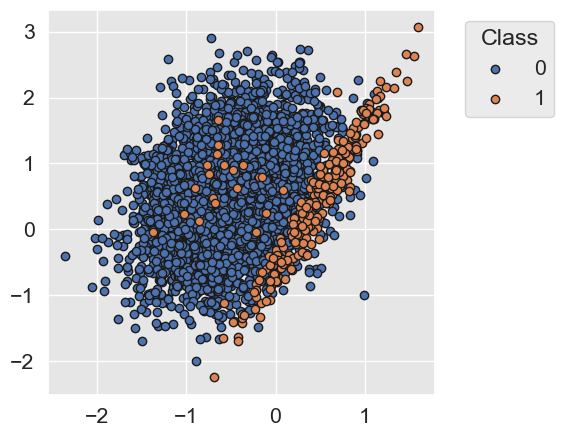

In [298]:
fig_distribution

In [299]:
%%capture
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_dt_baseline, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                                     X, y, 
                                                                                     n_splits=5,
                                                                                     strategy_name="Decision tree - Baseline")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [300]:
results_df_dt_baseline

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.005+/-0.001,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046


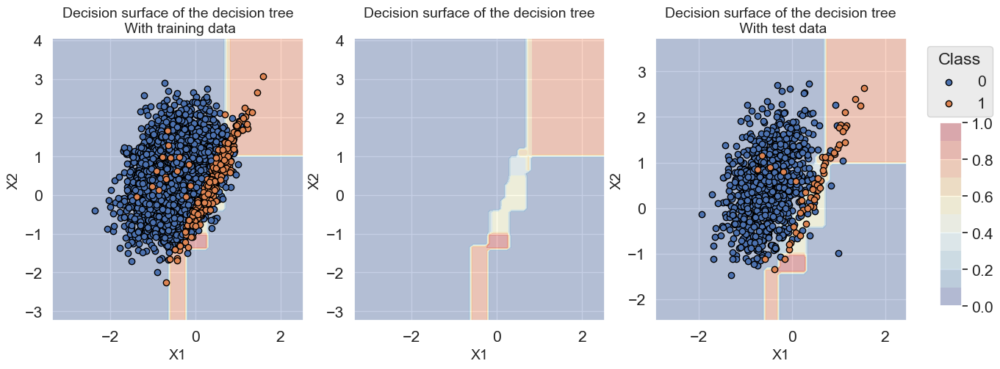

In [301]:
fig_decision_boundary

In [302]:
# random_state is set to 0 for reproducibility
ROS = imblearn.over_sampling.RandomOverSampler(sampling_strategy=1, random_state=0)

In [303]:
train_df['Y'].value_counts()

0    3784
1     216
Name: Y, dtype: int64

In [304]:
X_resampled, Y_resampled = ROS.fit_resample(train_df[['X1','X2']], train_df['Y'])
train_df_ROS = pd.DataFrame({'X1':X_resampled['X1'],'X2':X_resampled['X2'], 'Y':Y_resampled})

In [305]:
train_df_ROS['Y'].value_counts()

0    3784
1    3784
Name: Y, dtype: int64

In [306]:
train_df_ROS['Y'].value_counts()

0    3784
1    3784
Name: Y, dtype: int64

In [307]:
def kfold_cv_with_sampler_and_classifier(classifier,
                                         sampler_list,
                                         X,
                                         y,
                                         n_splits=5,
                                         strategy_name="Baseline classifier"):
    
    # Create a pipeline with the list of samplers, and the estimator
    estimators = sampler_list.copy()
    estimators.extend([('clf', classifier)])
    
    pipe = imblearn.pipeline.Pipeline(estimators)
    
    cv = sklearn.model_selection.StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=0)
    
    cv_results_ = sklearn.model_selection.cross_validate(pipe,X,y,cv=cv,
                                                         scoring=['roc_auc',
                                                                  'average_precision',
                                                                  'balanced_accuracy'],
                                                         return_estimator=True)
    
    results = round(pd.DataFrame(cv_results_),3)
    results_mean = list(results.mean().values)
    results_std = list(results.std().values)
    results_df = pd.DataFrame([[str(round(results_mean[i],3))+'+/-'+
                                str(round(results_std[i],3)) for i in range(len(results))]],
                              columns=['Fit time (s)','Score time (s)',
                                       'AUC ROC','Average Precision','Balanced accuracy'])
    results_df.rename(index={0:strategy_name}, inplace=True)
    
    classifier_0 = cv_results_['estimator'][0]
    
    (train_index, test_index) = next(cv.split(X, y))
    X_resampled, Y_resampled = X[train_index,:], y[train_index]
    for i in range(len(sampler_list)):
        X_resampled, Y_resampled = sampler_list[i][1].fit_resample(X_resampled, Y_resampled)
    
    test_df = pd.DataFrame({'X1':X[test_index,0],'X2':X[test_index,1], 'Y':y[test_index]})
    train_df = pd.DataFrame({'X1':X_resampled[:,0],'X2':X_resampled[:,1], 'Y':Y_resampled})
    
    return (results_df, classifier_0, train_df, test_df)

In [308]:
%%capture

sampler_list = [('sampler',imblearn.over_sampling.RandomOverSampler(sampling_strategy=1, random_state=0))]
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_ROS, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier, 
                                                                                         sampler_list, 
                                                                                         X, y, 
                                                                                         n_splits=5,
                                                                                         strategy_name="Decision tree - ROS")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [309]:
train_df['Y'].value_counts()

0    3784
1    3784
Name: Y, dtype: int64

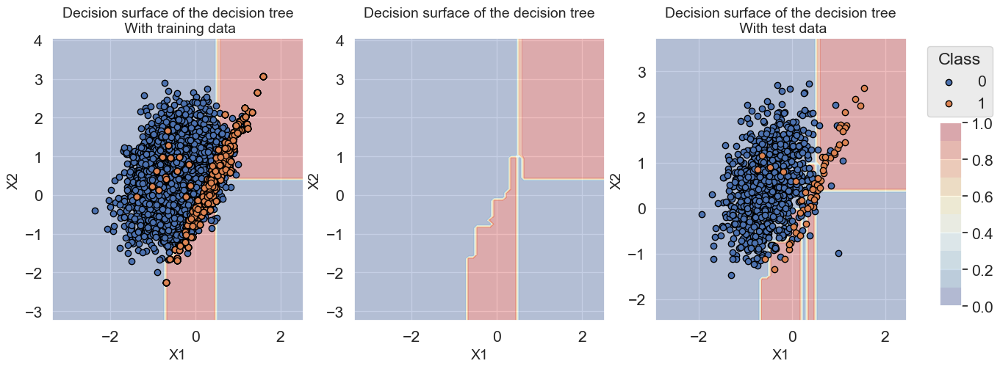

In [310]:
fig_decision_boundary

In [311]:
pd.concat([results_df_dt_baseline, 
           results_df_ROS])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.005+/-0.001,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.009+/-0.001,0.002+/-0.0,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03


In [312]:
%%capture

sampler_list = [('sampler', imblearn.over_sampling.SMOTE(sampling_strategy=1, random_state=0))]
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_SMOTE, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier, 
                                                                                           sampler_list, 
                                                                                           X, y, 
                                                                                           n_splits=5,
                                                                                           strategy_name="Decision tree - SMOTE")


fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [313]:
train_df['Y'].value_counts()

0    3784
1    3784
Name: Y, dtype: int64

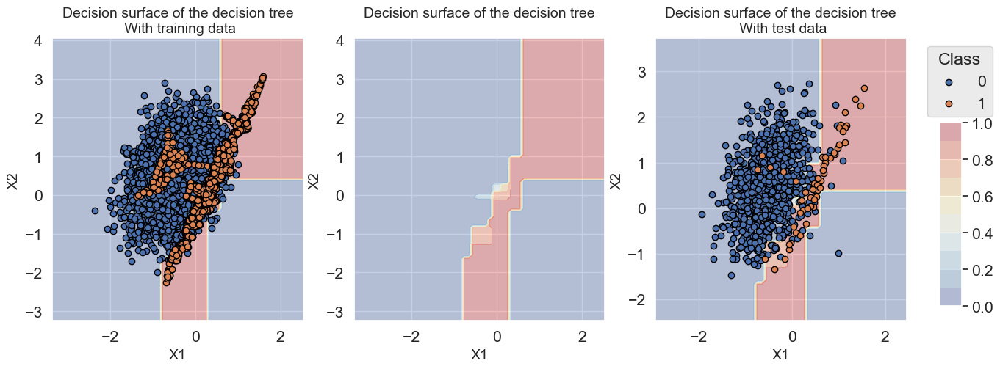

In [314]:
fig_decision_boundary

In [315]:
pd.concat([results_df_dt_baseline, 
           results_df_ROS,
           results_df_SMOTE])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.005+/-0.001,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.009+/-0.001,0.002+/-0.0,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03
Decision tree - SMOTE,0.013+/-0.002,0.003+/-0.001,0.913+/-0.032,0.499+/-0.056,0.91+/-0.019


In [316]:
%%capture

sampler_list = [('sampler', imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1, random_state=0))]

classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_RUS, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier, 
                                                                                         sampler_list, 
                                                                                         X, y, 
                                                                                         n_splits=5,
                                                                                         strategy_name="Decision tree - RUS")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [317]:
train_df['Y'].value_counts()

0    216
1    216
Name: Y, dtype: int64

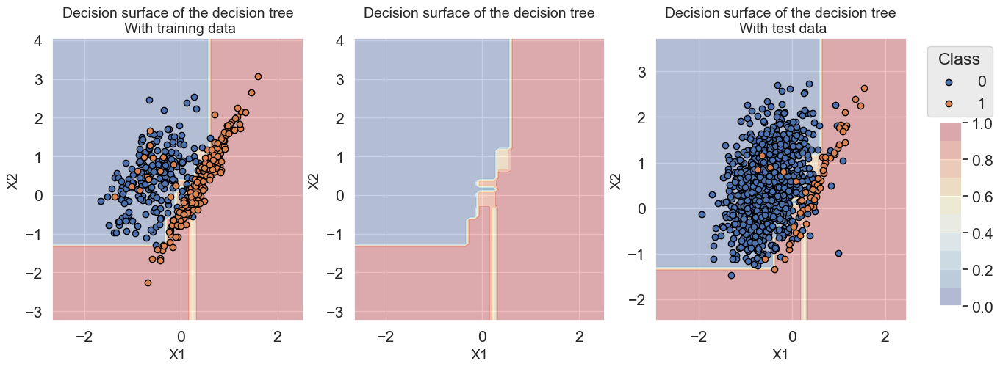

In [318]:
fig_decision_boundary

In [319]:
pd.concat([results_df_dt_baseline, 
           results_df_ROS,
           results_df_SMOTE,
           results_df_RUS])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.005+/-0.001,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.009+/-0.001,0.002+/-0.0,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03
Decision tree - SMOTE,0.013+/-0.002,0.003+/-0.001,0.913+/-0.032,0.499+/-0.056,0.91+/-0.019
Decision tree - RUS,0.002+/-0.0,0.002+/-0.0,0.913+/-0.02,0.408+/-0.058,0.896+/-0.023


In [320]:
%%capture

sampler_list = [('sampler', imblearn.under_sampling.EditedNearestNeighbours(sampling_strategy='majority',n_neighbors=3))]

classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_ENN, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier, 
                                                                                         sampler_list, 
                                                                                         X, y, 
                                                                                         n_splits=5,
                                                                                         strategy_name="Decision tree - ENN")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [321]:
train_df['Y'].value_counts()

0    3572
1     216
Name: Y, dtype: int64

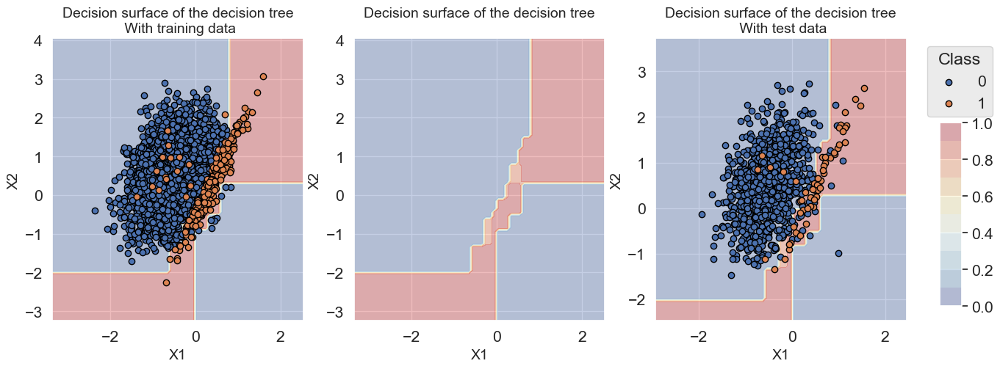

In [322]:
fig_decision_boundary

In [323]:
pd.concat([results_df_dt_baseline, 
           results_df_ROS,
           results_df_SMOTE,
           results_df_RUS,
           results_df_ENN])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.005+/-0.001,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.009+/-0.001,0.002+/-0.0,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03
Decision tree - SMOTE,0.013+/-0.002,0.003+/-0.001,0.913+/-0.032,0.499+/-0.056,0.91+/-0.019
Decision tree - RUS,0.002+/-0.0,0.002+/-0.0,0.913+/-0.02,0.408+/-0.058,0.896+/-0.023
Decision tree - ENN,0.011+/-0.001,0.002+/-0.0,0.879+/-0.038,0.474+/-0.08,0.857+/-0.041


In [324]:
sampler_list = [('sampler1', imblearn.over_sampling.SMOTE(sampling_strategy=0.5,random_state=0)),
                ('sampler2', imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1.0,random_state=0))
               ]

classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

estimators = sampler_list.extend([('clf', classifier)])
    
pipe = imblearn.pipeline.Pipeline(estimators)

In [325]:
%%capture
sampler_list = [('sampler1', imblearn.over_sampling.SMOTE(sampling_strategy=0.5,random_state=0)),
                ('sampler2', imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1.0,random_state=0))
               ]

classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_combined, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier, 
                                                                                              sampler_list, 
                                                                                              X, y, 
                                                                                              n_splits=5,
                                                                                              strategy_name='Decision tree - Combined SMOTE and RUS')

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [326]:
train_df['Y'].value_counts()

0    1892
1    1892
Name: Y, dtype: int64

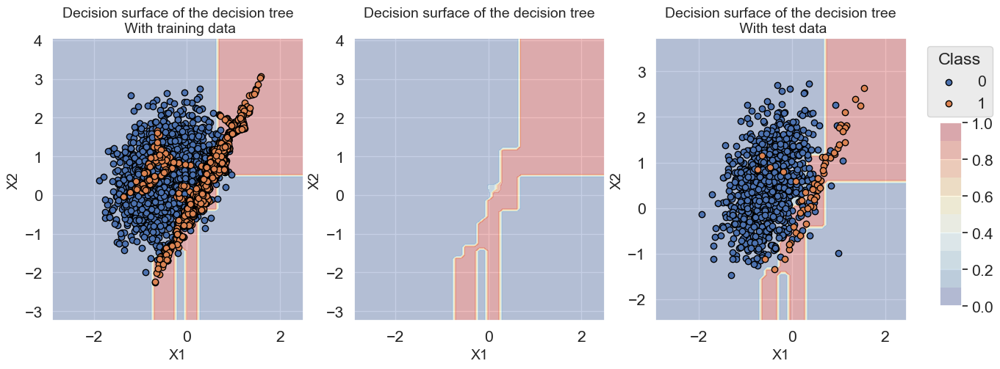

In [327]:
fig_decision_boundary

In [328]:
pd.concat([results_df_dt_baseline, 
           results_df_ROS,
           results_df_SMOTE,
           results_df_RUS,
           results_df_ENN,
           results_df_combined])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.005+/-0.001,0.002+/-0.0,0.906+/-0.025,0.528+/-0.072,0.786+/-0.046
Decision tree - ROS,0.009+/-0.001,0.002+/-0.0,0.88+/-0.038,0.456+/-0.062,0.888+/-0.03
Decision tree - SMOTE,0.013+/-0.002,0.003+/-0.001,0.913+/-0.032,0.499+/-0.056,0.91+/-0.019
Decision tree - RUS,0.002+/-0.0,0.002+/-0.0,0.913+/-0.02,0.408+/-0.058,0.896+/-0.023
Decision tree - ENN,0.011+/-0.001,0.002+/-0.0,0.879+/-0.038,0.474+/-0.08,0.857+/-0.041
Decision tree - Combined SMOTE and RUS,0.007+/-0.0,0.002+/-0.0,0.915+/-0.012,0.494+/-0.062,0.912+/-0.005


In [329]:
# Load data from the 2018-07-11 to the 2018-09-14

DIR_INPUT = 'simulated-data-transformed/data/' 

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df = read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))


# Number of folds for the prequential validation
n_folds = 4

# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = delta_valid = delta_assessment = 7

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)

output_feature = "TX_FRAUD"

input_features = ['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']


# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom, 
                                                     needs_proba=True, 
                                                     top_k=100, 
                                                     transactions_df=transactions_df_scorer)

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

Load  files
CPU times: total: 562 ms
Wall time: 592 ms
919767 transactions loaded, containing 8195 fraudulent transactions


In [330]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_dt = time.time()-start_time

# Select parameter of interest (max_depth)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__max_depth'] for i in range(len(parameters_dict))]

# Rename to performances_df_dt for model performance comparison at the end of this notebook
performances_df_dt=performances_df

In [331]:
summary_performances_dt=get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")
summary_performances_dt

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,5,5,5
Validation performance,0.804+/-0.02,0.546+/-0.04,0.268+/-0.01
Test performance,0.81+/-0.01,0.6+/-0.02,0.284+/-0.0
Optimal parameter(s),5,5,5
Optimal test performance,0.81+/-0.01,0.6+/-0.02,0.284+/-0.0


In [332]:
def prequential_grid_search_with_sampler(transactions_df, 
                                         classifier, sampler_list,
                                         input_features, output_feature, 
                                         parameters, scoring, 
                                         start_date_training, 
                                         n_folds=4,
                                         expe_type='Test',
                                         delta_train=7, 
                                         delta_delay=7, 
                                         delta_assessment=7,
                                         performance_metrics_list_grid=['roc_auc'],
                                         performance_metrics_list=['AUC ROC'],
                                         n_jobs=-1):
    
    estimators = sampler_list.copy()
    estimators.extend([('clf', classifier)])
    
    pipe = imblearn.pipeline.Pipeline(estimators)
    
    prequential_split_indices = prequentialSplit(transactions_df,
                                                 start_date_training=start_date_training, 
                                                 n_folds=n_folds, 
                                                 delta_train=delta_train, 
                                                 delta_delay=delta_delay, 
                                                 delta_assessment=delta_assessment)
    
    grid_search = sklearn.model_selection.GridSearchCV(pipe, parameters, scoring=scoring, cv=prequential_split_indices, refit=False, n_jobs=n_jobs)
    
    X = transactions_df[input_features]
    y = transactions_df[output_feature]

    grid_search.fit(X, y)
    
    performances_df = pd.DataFrame()
    
    for i in range(len(performance_metrics_list_grid)):
        performances_df[performance_metrics_list[i]+' '+expe_type]=grid_search.cv_results_['mean_test_'+performance_metrics_list_grid[i]]
        performances_df[performance_metrics_list[i]+' '+expe_type+' Std']=grid_search.cv_results_['std_test_'+performance_metrics_list_grid[i]]

    performances_df['Parameters'] = grid_search.cv_results_['params']
    performances_df['Execution time'] = grid_search.cv_results_['mean_fit_time']
    
    return performances_df

In [333]:
def model_selection_wrapper_with_sampler(transactions_df, 
                                         classifier, 
                                         sampler_list,
                                         input_features, output_feature,
                                         parameters, 
                                         scoring, 
                                         start_date_training_for_valid,
                                         start_date_training_for_test,
                                         n_folds=4,
                                         delta_train=7, 
                                         delta_delay=7, 
                                         delta_assessment=7,
                                         performance_metrics_list_grid=['roc_auc'],
                                         performance_metrics_list=['AUC ROC'],
                                         n_jobs=-1):

    # Get performances on the validation set using prequential validation
    performances_df_validation = prequential_grid_search_with_sampler(transactions_df, classifier, sampler_list,
                            input_features, output_feature,
                            parameters, scoring, 
                            start_date_training=start_date_training_for_valid,
                            n_folds=n_folds,
                            expe_type='Validation',
                            delta_train=delta_train, 
                            delta_delay=delta_delay, 
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            n_jobs=n_jobs)
    
    # Get performances on the test set using prequential validation
    performances_df_test = prequential_grid_search_with_sampler(transactions_df, classifier, sampler_list,
                            input_features, output_feature,
                            parameters, scoring, 
                            start_date_training=start_date_training_for_test,
                            n_folds=n_folds,
                            expe_type='Test',
                            delta_train=delta_train, 
                            delta_delay=delta_delay, 
                            delta_assessment=delta_assessment,
                            performance_metrics_list_grid=performance_metrics_list_grid,
                            performance_metrics_list=performance_metrics_list,
                            n_jobs=n_jobs)
    
    # Bind the two resulting DataFrames
    performances_df_validation.drop(columns=['Parameters','Execution time'], inplace=True)
    performances_df = pd.concat([performances_df_test,performances_df_validation],axis=1)

    # And return as a single DataFrame
    return performances_df

In [334]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Define sampling strategy
sampler_list = [('sampler', imblearn.over_sampling.SMOTE(random_state=0))]

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0],
              'sampler__sampling_strategy':[0.01, 0.05, 0.1, 0.5, 1], 'sampler__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper_with_sampler(transactions_df, classifier, sampler_list, 
                                                     input_features, output_feature,
                                                     parameters, scoring, 
                                                     start_date_training_for_valid,
                                                     start_date_training_for_test,
                                                     n_folds=n_folds,
                                                     delta_train=delta_train, 
                                                     delta_delay=delta_delay, 
                                                     delta_assessment=delta_assessment,
                                                     performance_metrics_list_grid=performance_metrics_list_grid,
                                                     performance_metrics_list=performance_metrics_list,
                                                     n_jobs=1)

execution_time_dt_SMOTE = time.time()-start_time

In [335]:
# Select parameter of interest (sampling_strategy)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['sampler__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_SMOTE for model performance comparison at the end of this notebook
performances_df_SMOTE = performances_df

In [336]:
performances_df_SMOTE

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.805165,0.005955,0.587136,0.010773,0.282143,0.007389,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.380669,0.803468,0.014269,0.554155,0.032957,0.267500,0.014120,0.01
1,0.823732,0.006235,0.572835,0.024824,0.285357,0.012753,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.382219,0.809590,0.018765,0.558479,0.027820,0.271429,0.010785,0.05
2,0.827219,0.010190,0.544275,0.037686,0.290357,0.010070,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.399742,0.807543,0.016324,0.537672,0.040918,0.268214,0.013224,0.10
3,0.842985,0.018418,0.558118,0.033607,0.289286,0.015860,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.571591,0.849501,0.015830,0.495635,0.052593,0.279286,0.018028,0.50
4,0.845270,0.008136,0.545954,0.031952,0.294643,0.011401,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.807604,0.857367,0.012183,0.493752,0.049094,0.278571,0.014463,1.00


In [337]:
summary_performances_SMOTE = get_summary_performances(performances_df_SMOTE, parameter_column_name="Parameters summary")
summary_performances_SMOTE

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1.0,0.05,0.5
Validation performance,0.857+/-0.01,0.558+/-0.03,0.279+/-0.02
Test performance,0.845+/-0.01,0.573+/-0.02,0.289+/-0.02
Optimal parameter(s),1.0,0.01,1.0
Optimal test performance,0.845+/-0.01,0.587+/-0.01,0.295+/-0.01


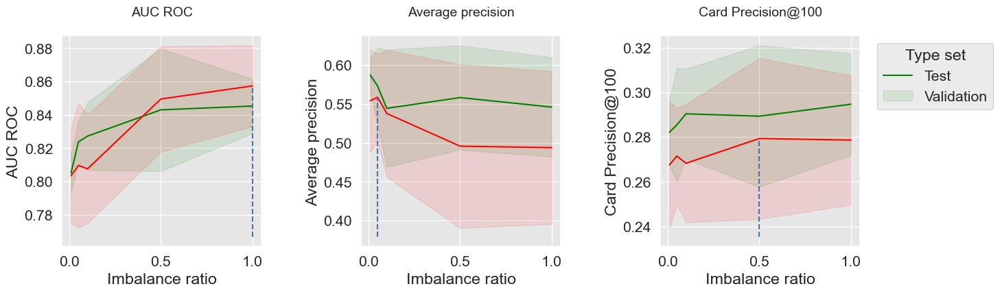

In [338]:
get_performances_plots(performances_df_SMOTE, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_SMOTE)

In [339]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Define sampling strategy
sampler_list = [('sampler', imblearn.under_sampling.RandomUnderSampler())]

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0],
              'sampler__sampling_strategy':[0.01, 0.05, 0.1, 0.5, 1], 'sampler__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper_with_sampler(transactions_df, classifier, sampler_list, 
                                                     input_features, output_feature,
                                                     parameters, scoring, 
                                                     start_date_training_for_valid,
                                                     start_date_training_for_test,
                                                     n_folds=n_folds,
                                                     delta_train=delta_train, 
                                                     delta_delay=delta_delay, 
                                                     delta_assessment=delta_assessment,
                                                     performance_metrics_list_grid=performance_metrics_list_grid,
                                                     performance_metrics_list=performance_metrics_list,
                                                     n_jobs=1)

execution_time_dt_RUS = time.time()-start_time

# Select parameter of interest (sampling_strategy)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['sampler__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_RUS for model performance comparison at the end of this notebook
performances_df_RUS = performances_df

In [340]:
summary_performances_RUS=get_summary_performances(performances_df_RUS, parameter_column_name="Parameters summary")
summary_performances_RUS

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1.0,0.01,0.1
Validation performance,0.845+/-0.01,0.535+/-0.04,0.269+/-0.01
Test performance,0.83+/-0.01,0.594+/-0.02,0.277+/-0.01
Optimal parameter(s),1.0,0.01,0.5
Optimal test performance,0.83+/-0.01,0.594+/-0.02,0.292+/-0.01


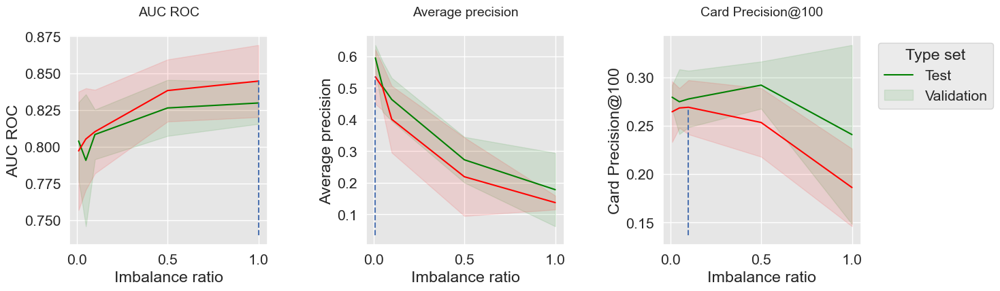

In [341]:
get_performances_plots(performances_df_RUS, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_RUS)

In [342]:
# Define classifier
classifier = sklearn.tree.DecisionTreeClassifier()

# Define sampling strategy
sampler_list = [('sampler1', imblearn.over_sampling.SMOTE()),
                ('sampler2', imblearn.under_sampling.RandomUnderSampler())
               ]

# Set of parameters for which to assess model performances
parameters = {'clf__max_depth':[5], 'clf__random_state':[0],
              'sampler1__sampling_strategy':[0.1], 
              'sampler2__sampling_strategy':[0.1, 0.5, 1], 
              'sampler1__random_state':[0], 'sampler2__random_state':[0]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df = model_selection_wrapper_with_sampler(transactions_df, classifier, sampler_list, 
                                                     input_features, output_feature,
                                                     parameters, scoring, 
                                                     start_date_training_for_valid,
                                                     start_date_training_for_test,
                                                     n_folds=n_folds,
                                                     delta_train=delta_train, 
                                                     delta_delay=delta_delay, 
                                                     delta_assessment=delta_assessment,
                                                     performance_metrics_list_grid=performance_metrics_list_grid,
                                                     performance_metrics_list=performance_metrics_list,
                                                     n_jobs=1)

execution_time_dt_combined = time.time()-start_time

# Select parameter of interest (max_depth)
parameters_dict = dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['sampler2__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_combined for model performance comparison at the end of this notebook
performances_df_combined = performances_df

In [343]:
performances_df_combined

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.827219,0.010190,0.544275,0.037686,0.290357,0.010070,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.428780,0.807543,0.016324,0.537672,0.040918,0.268214,0.013224,0.1
1,0.848464,0.008701,0.471467,0.010144,0.299643,0.011968,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.247186,0.841237,0.015297,0.428576,0.050091,0.279286,0.010903,0.5
2,0.847110,0.010754,0.385133,0.064916,0.287857,0.018364,"{'clf__max_depth': 5, 'clf__random_state': 0, ...",0.225494,0.856399,0.012189,0.342964,0.020342,0.280357,0.017420,1.0


In [344]:
summary_performances_combined = get_summary_performances(performances_df=performances_df_combined, 
                                                         parameter_column_name="Parameters summary")
summary_performances_combined

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1.0,0.1,1.0
Validation performance,0.856+/-0.01,0.538+/-0.04,0.28+/-0.02
Test performance,0.847+/-0.01,0.544+/-0.04,0.288+/-0.02
Optimal parameter(s),0.5,0.1,0.5
Optimal test performance,0.848+/-0.01,0.544+/-0.04,0.3+/-0.01


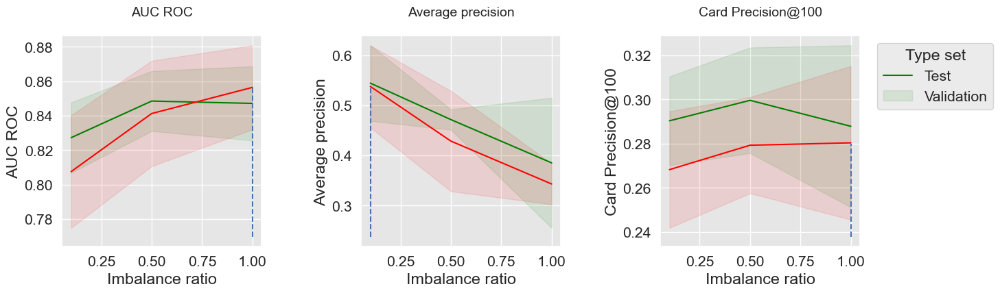

In [345]:
get_performances_plots(performances_df_combined, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_combined)

In [346]:
summary_test_performances = pd.concat([summary_performances_dt.iloc[2,:],
                                       summary_performances_SMOTE.iloc[2,:],
                                       summary_performances_RUS.iloc[2,:],
                                       summary_performances_combined.iloc[2,:],
                                      ],axis=1)
summary_test_performances.columns=['Baseline', 'SMOTE', 'RUS', 'Combined']
summary_test_performances

,Baseline,SMOTE,RUS,Combined
AUC ROC,0.81+/-0.01,0.845+/-0.01,0.83+/-0.01,0.847+/-0.01
Average precision,0.6+/-0.02,0.573+/-0.02,0.594+/-0.02,0.544+/-0.04
Card Precision@100,0.284+/-0.0,0.289+/-0.02,0.277+/-0.01,0.288+/-0.02


In [347]:
performances_df_dictionary={
    "SMOTE": performances_df_SMOTE,
    "RUS": performances_df_RUS,
    "Combined": performances_df_combined
}

execution_times=[execution_time_dt_SMOTE,
                 execution_time_dt_RUS,
                 execution_time_dt_combined,
                ]

In [348]:
filehandler = open('performances_resampling.pkl', 'wb') 
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

In [349]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py
#%run ../Chapter_References/shared_functions.ipynb

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed
   

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:04 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:05 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:06 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:06 --:--:--     0
curl: (35) Recv failure: Connection was reset


<Figure size 640x480 with 0 Axes>

In [350]:
X, y = sklearn.datasets.make_classification(n_samples=5000, n_features=2, n_informative=2,
                                            n_redundant=0, n_repeated=0, n_classes=2,
                                            n_clusters_per_class=1,
                                            weights=[0.95, 0.05],
                                            class_sep=0.5, random_state=0)

dataset_df = pd.DataFrame({'X1':X[:,0],'X2':X[:,1], 'Y':y})

In [351]:
%%capture
fig_distribution, ax = plt.subplots(1, 1, figsize=(5,5))

groups = dataset_df.groupby('Y')
for name, group in groups:
    ax.scatter(group.X1, group.X2, edgecolors='k', label=name,alpha=1,marker='o')
    
ax.legend(loc='upper left', 
          bbox_to_anchor=(1.05, 1),
          title="Class")

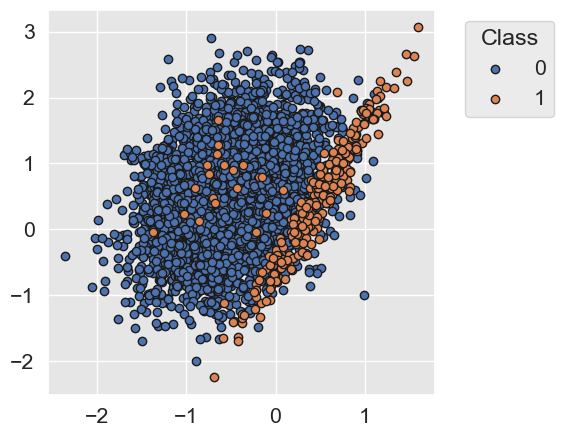

In [352]:
fig_distribution

In [353]:
%%capture
classifier = sklearn.ensemble.BaggingClassifier(base_estimator=sklearn.tree.DecisionTreeClassifier(max_depth=5,random_state=0),
                                                n_estimators=100,
                                                bootstrap=True,
                                                random_state=0)


(results_df_bagging, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                                 X, y, 
                                                                                 n_splits=5,
                                                                                 strategy_name="Bagging")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [354]:
results_df_bagging

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.395+/-0.005,0.022+/-0.001,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041


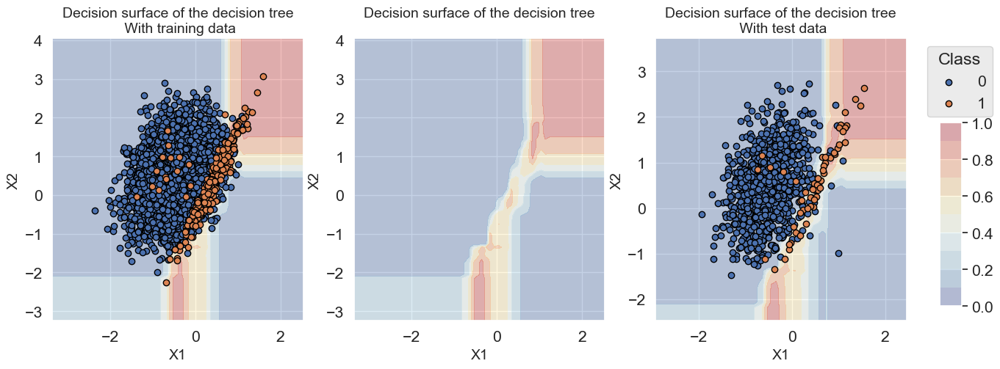

In [355]:
fig_decision_boundary

In [356]:
%%capture
classifier = imblearn.ensemble.BalancedBaggingClassifier(base_estimator=sklearn.tree.DecisionTreeClassifier(max_depth=5,random_state=0),
                                                         n_estimators=100,
                                                         sampling_strategy=1,
                                                         bootstrap=True,
                                                         sampler=imblearn.under_sampling.RandomUnderSampler(),
                                                         random_state=0)


(results_df_balanced_bagging, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                                          X, y, 
                                                                                          n_splits=5,
                                                                                          strategy_name="Balanced bagging")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [357]:
pd.concat([results_df_bagging, 
           results_df_balanced_bagging])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.395+/-0.005,0.022+/-0.001,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.238+/-0.003,0.025+/-0.0,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013


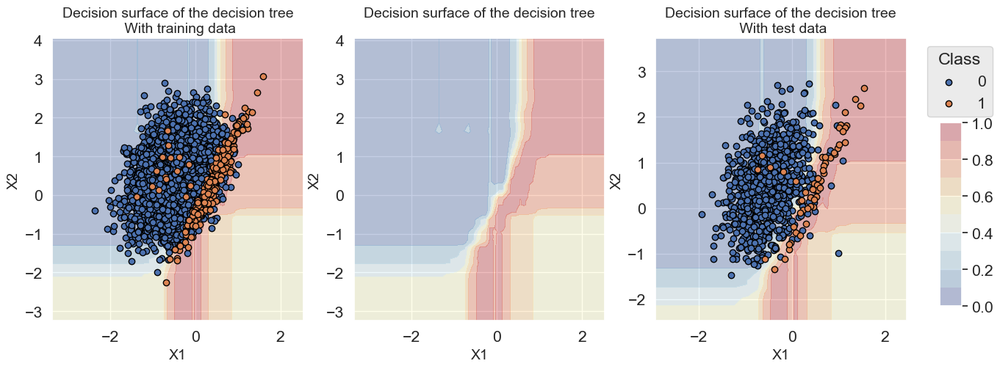

In [358]:
fig_decision_boundary

In [359]:
%%capture
classifier = sklearn.ensemble.RandomForestClassifier(n_estimators=100, 
                                                     max_depth=5,
                                                     random_state=0)

(results_df_rf, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                            X, y, 
                                                                            n_splits=5,
                                                                            strategy_name="Random forest")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [360]:
pd.concat([results_df_bagging, 
           results_df_balanced_bagging,
           results_df_rf])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.395+/-0.005,0.022+/-0.001,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.238+/-0.003,0.025+/-0.0,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013
Random forest,0.252+/-0.003,0.02+/-0.0,0.933+/-0.016,0.593+/-0.087,0.672+/-0.022


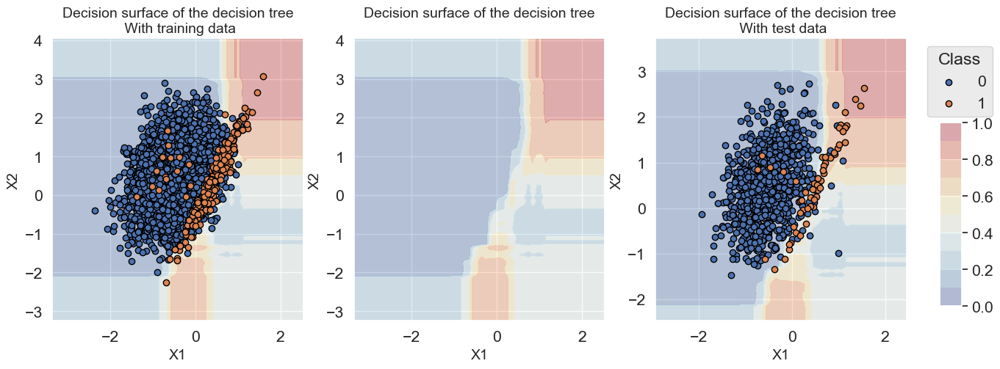

In [361]:
fig_decision_boundary

In [362]:
%%capture
classifier = imblearn.ensemble.BalancedRandomForestClassifier(n_estimators=100, 
                                                              sampling_strategy=1,
                                                              max_depth=5,
                                                              random_state=0)

(results_df_rf_balanced, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                                     X, y, 
                                                                                     n_splits=5,
                                                                                     strategy_name="Balanced random forest")


fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [363]:
pd.concat([results_df_bagging, 
           results_df_balanced_bagging,
           results_df_rf,
           results_df_rf_balanced])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.395+/-0.005,0.022+/-0.001,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.238+/-0.003,0.025+/-0.0,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013
Random forest,0.252+/-0.003,0.02+/-0.0,0.933+/-0.016,0.593+/-0.087,0.672+/-0.022
Balanced random forest,0.215+/-0.006,0.021+/-0.0,0.946+/-0.01,0.58+/-0.083,0.916+/-0.014


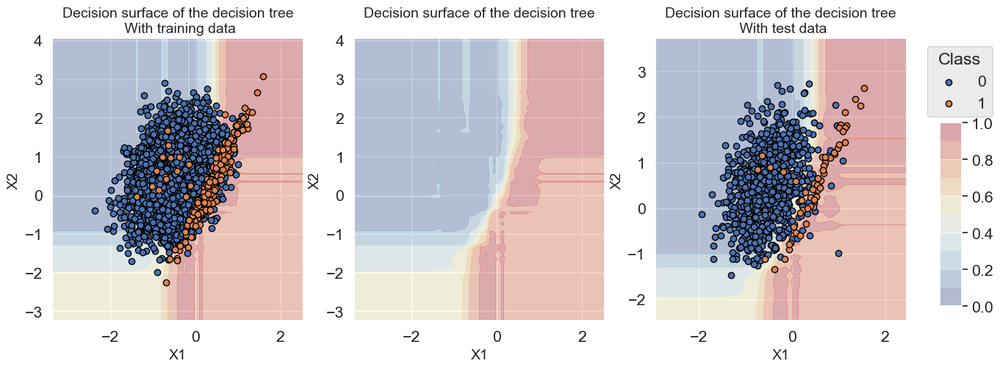

In [364]:
fig_decision_boundary

In [365]:
%%capture
classifier = xgboost.XGBClassifier(n_estimators=100,
                                   max_depth=6,
                                   learning_rate=0.3,
                                   random_state=0)

(results_df_xgboost, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                                 X, y, 
                                                                                 n_splits=5,
                                                                                 strategy_name="XGBoost")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [366]:
pd.concat([results_df_bagging, 
           results_df_balanced_bagging,
           results_df_rf,
           results_df_rf_balanced,
           results_df_xgboost])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.395+/-0.005,0.022+/-0.001,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.238+/-0.003,0.025+/-0.0,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013
Random forest,0.252+/-0.003,0.02+/-0.0,0.933+/-0.016,0.593+/-0.087,0.672+/-0.022
Balanced random forest,0.215+/-0.006,0.021+/-0.0,0.946+/-0.01,0.58+/-0.083,0.916+/-0.014
XGBoost,0.11+/-0.005,0.005+/-0.001,0.95+/-0.008,0.59+/-0.066,0.772+/-0.04


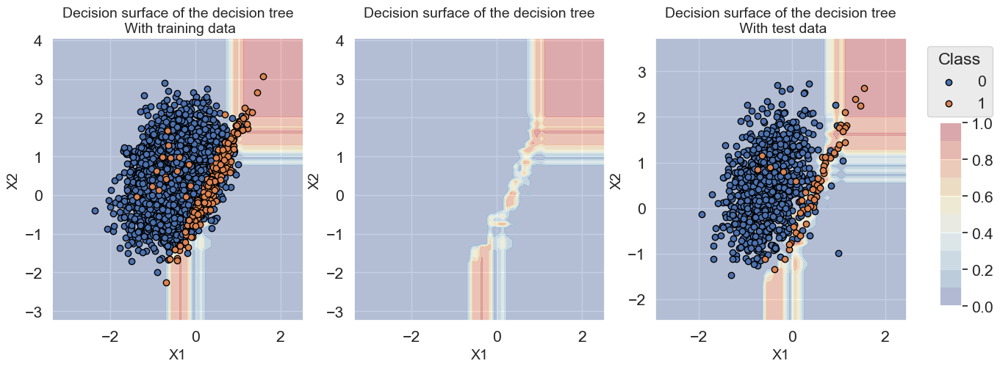

In [367]:
fig_decision_boundary

In [368]:
IR=0.05/0.95 
IR

0.052631578947368425

In [369]:
%%capture
classifier = xgboost.XGBClassifier(n_estimators=100,
                                   max_depth=6,
                                   learning_rate=0.3,
                                   scale_pos_weight=1/IR,
                                   random_state=0)

(results_df_weighted_xgboost, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier, 
                                                                                          X, y, 
                                                                                          n_splits=5,
                                                                                          strategy_name="Weighted XGBoost")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [370]:
pd.concat([results_df_bagging, 
           results_df_balanced_bagging,
           results_df_rf,
           results_df_rf_balanced,
           results_df_xgboost,
           results_df_weighted_xgboost])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.395+/-0.005,0.022+/-0.001,0.943+/-0.01,0.597+/-0.07,0.748+/-0.041
Balanced bagging,0.238+/-0.003,0.025+/-0.0,0.947+/-0.01,0.586+/-0.058,0.92+/-0.013
Random forest,0.252+/-0.003,0.02+/-0.0,0.933+/-0.016,0.593+/-0.087,0.672+/-0.022
Balanced random forest,0.215+/-0.006,0.021+/-0.0,0.946+/-0.01,0.58+/-0.083,0.916+/-0.014
XGBoost,0.11+/-0.005,0.005+/-0.001,0.95+/-0.008,0.59+/-0.066,0.772+/-0.04
Weighted XGBoost,0.117+/-0.004,0.004+/-0.001,0.946+/-0.012,0.598+/-0.061,0.855+/-0.021


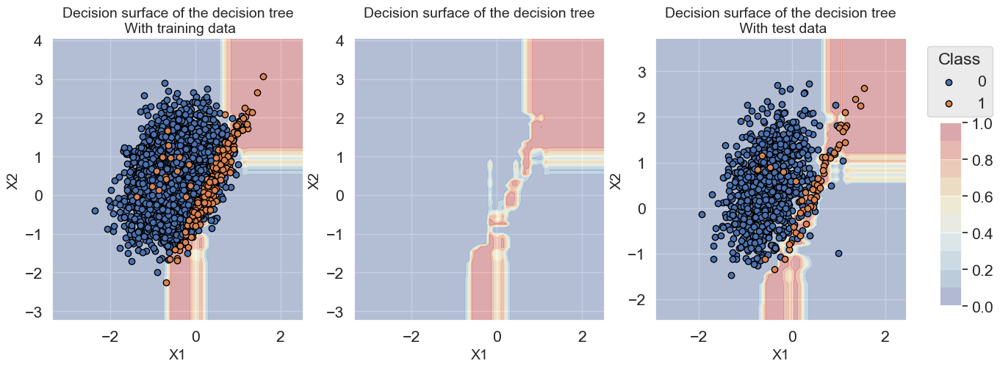

In [371]:
fig_decision_boundary

In [372]:
# Load data from the 2018-07-11 to the 2018-09-14

DIR_INPUT = 'simulated-data-transformed/data/' 

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df = read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))


# Number of folds for the prequential validation
n_folds = 4

# Set the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train = delta_delay = delta_test = delta_valid = delta_assessment = 7

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)

output_feature = "TX_FRAUD"

input_features = ['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']


# Only keep columns that are needed as argument to the custom scoring function
# (in order to reduce the serialization time of transaction dataset)
transactions_df_scorer = transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom, 
                                                     needs_proba=True, 
                                                     top_k=100, 
                                                     transactions_df=transactions_df_scorer)

performance_metrics_list_grid = ['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list = ['AUC ROC', 'Average precision', 'Card Precision@100']

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }

Load  files
CPU times: total: 484 ms
Wall time: 508 ms
919767 transactions loaded, containing 8195 fraudulent transactions


In [373]:
#### Bagging
# Define classifier
classifier = sklearn.ensemble.BaggingClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__base_estimator':[sklearn.tree.DecisionTreeClassifier(max_depth=20,random_state=0)], 
              'clf__bootstrap':[True],
              'clf__n_estimators':[100],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_baseline_bagging = time.time()-start_time

# Select parameter of interest (n_estimators)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__n_estimators'] for i in range(len(parameters_dict))]

# Rename to performances_df_baseline_bagging for model performance comparison later in this section
performances_df_baseline_bagging=performances_df

In [374]:
summary_performances_baseline_bagging=get_summary_performances(performances_df_baseline_bagging, parameter_column_name="Parameters summary")
summary_performances_baseline_bagging

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,100,100,100
Validation performance,0.872+/-0.01,0.704+/-0.01,0.284+/-0.01
Test performance,0.856+/-0.02,0.678+/-0.01,0.293+/-0.01
Optimal parameter(s),100,100,100
Optimal test performance,0.856+/-0.02,0.678+/-0.01,0.293+/-0.01


In [375]:
#### Random forest
# Define classifier
classifier = sklearn.ensemble.RandomForestClassifier()

parameters = {'clf__max_depth':[20], 
              'clf__n_estimators':[100],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_baseline_rf = time.time()-start_time

# Select parameter of interest (n_estimators)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__n_estimators'] for i in range(len(parameters_dict))]

# Rename to performances_df_baseline_rf for model performance comparison later in this section
performances_df_baseline_rf=performances_df

In [376]:
summary_performances_baseline_rf=get_summary_performances(performances_df_baseline_rf, parameter_column_name="Parameters summary")
summary_performances_baseline_rf

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,100,100,100
Validation performance,0.88+/-0.01,0.694+/-0.02,0.289+/-0.02
Test performance,0.87+/-0.02,0.678+/-0.01,0.299+/-0.01
Optimal parameter(s),100,100,100
Optimal test performance,0.87+/-0.02,0.678+/-0.01,0.299+/-0.01


In [377]:
#### XGBoost
# Define classifier
classifier = xgboost.XGBClassifier()

parameters = {'clf__max_depth':[3], 
              'clf__n_estimators':[50],
              'clf__learning_rate':[0.3],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_baseline_xgboost = time.time()-start_time

# Select parameter of interest (n_estimators)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__n_estimators'] for i in range(len(parameters_dict))]

# Rename to performances_df_baseline_xgboost for model performance comparison later in this section
performances_df_baseline_xgboost=performances_df

In [378]:
summary_performances_baseline_xgboost=get_summary_performances(performances_df_baseline_xgboost, parameter_column_name="Parameters summary")
summary_performances_baseline_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,50,50,50
Validation performance,0.883+/-0.01,0.708+/-0.02,0.288+/-0.02
Test performance,0.872+/-0.01,0.687+/-0.01,0.302+/-0.01
Optimal parameter(s),50,50,50
Optimal test performance,0.872+/-0.01,0.687+/-0.01,0.302+/-0.01


In [379]:
summary_test_performances = pd.concat([summary_performances_baseline_bagging.iloc[2,:],
                                       summary_performances_baseline_rf.iloc[2,:],
                                       summary_performances_baseline_xgboost.iloc[2,:],
                                      ],axis=1)
summary_test_performances.columns=['Baseline Bagging', 'Baseline RF', 'Baseline XGBoost']
summary_test_performances

,Baseline Bagging,Baseline RF,Baseline XGBoost
AUC ROC,0.856+/-0.02,0.87+/-0.02,0.872+/-0.01
Average precision,0.678+/-0.01,0.678+/-0.01,0.687+/-0.01
Card Precision@100,0.293+/-0.01,0.299+/-0.01,0.302+/-0.01


In [380]:
# Define classifier
classifier = imblearn.ensemble.BalancedBaggingClassifier()

# Set of parameters for which to assess model performances
parameters = {'clf__base_estimator':[sklearn.tree.DecisionTreeClassifier(max_depth=20,random_state=0)], 
              'clf__n_estimators':[100],
              'clf__sampling_strategy':[0.02, 0.05, 0.1, 0.5, 1], 
              'clf__bootstrap':[True],
              'clf__sampler':[imblearn.under_sampling.RandomUnderSampler()],
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=1)

execution_time_balanced_bagging = time.time()-start_time

In [381]:
# Select parameter of interest (sampling_strategy)
parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[parameters_dict[i]['clf__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_balanced_bagging for model performance comparison later in this section
performances_df_balanced_bagging=performances_df

In [382]:
performances_df_balanced_bagging

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.869210,0.020009,0.679963,0.011158,0.298571,0.010051,{'clf__base_estimator': DecisionTreeClassifier...,9.328793,0.875647,0.009589,0.704491,0.014563,0.287143,0.014604,0.02
1,0.875633,0.018670,0.679319,0.007153,0.301071,0.010369,{'clf__base_estimator': DecisionTreeClassifier...,2.615809,0.877413,0.008182,0.700732,0.017898,0.286786,0.015856,0.05
2,0.876615,0.016223,0.676736,0.008302,0.304643,0.010369,{'clf__base_estimator': DecisionTreeClassifier...,1.800763,0.878204,0.002966,0.699331,0.018432,0.289286,0.015698,0.10
3,0.878820,0.013479,0.652480,0.021309,0.305357,0.012387,{'clf__base_estimator': DecisionTreeClassifier...,0.871705,0.880359,0.004692,0.657773,0.022306,0.287857,0.017800,0.50
4,0.877183,0.013837,0.631045,0.029855,0.301786,0.012592,{'clf__base_estimator': DecisionTreeClassifier...,0.815549,0.877335,0.003366,0.643261,0.022129,0.289286,0.017098,1.00


In [383]:
summary_performances_balanced_bagging = get_summary_performances(performances_df_balanced_bagging, parameter_column_name="Parameters summary")
summary_performances_balanced_bagging

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.5,0.02,0.1
Validation performance,0.88+/-0.0,0.704+/-0.01,0.289+/-0.02
Test performance,0.879+/-0.01,0.68+/-0.01,0.305+/-0.01
Optimal parameter(s),0.5,0.02,0.5
Optimal test performance,0.879+/-0.01,0.68+/-0.01,0.305+/-0.01


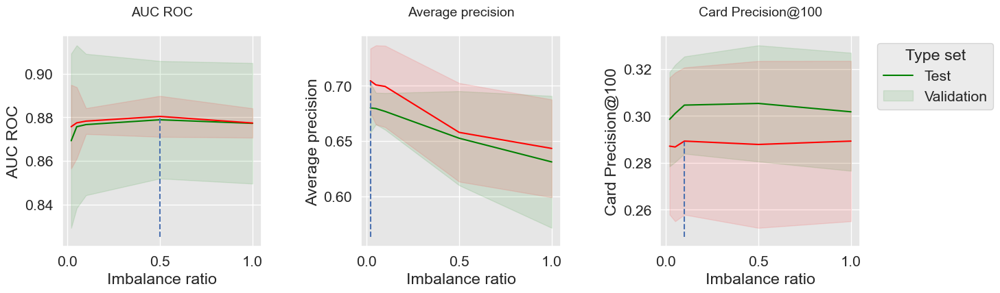

In [384]:
get_performances_plots(performances_df_balanced_bagging, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_balanced_bagging)

In [385]:
summary_test_performances = pd.concat([summary_performances_baseline_bagging.iloc[2,:],
                                       summary_performances_balanced_bagging.iloc[2,:]
                                      ],axis=1)
summary_test_performances.columns=['Baseline Bagging', 'Balanced Bagging']
summary_test_performances

,Baseline Bagging,Balanced Bagging
AUC ROC,0.856+/-0.02,0.879+/-0.01
Average precision,0.678+/-0.01,0.68+/-0.01
Card Precision@100,0.293+/-0.01,0.305+/-0.01


In [386]:
# Define classifier
classifier = imblearn.ensemble.BalancedRandomForestClassifier()

parameters = {'clf__max_depth':[20], 
              'clf__n_estimators':[100],
              'clf__sampling_strategy':[0.01, 0.05, 0.1, 0.5, 1], 
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_rf_balanced = time.time()-start_time

In [387]:
# Select parameter of interest (sampling_strategy)
parameters_dict = dict(performances_df['Parameters'])
performances_df['Parameters summary'] = [parameters_dict[i]['clf__sampling_strategy'] for i in range(len(parameters_dict))]

# Rename to performances_df_balanced_rf for model performance comparison later in this section
performances_df_balanced_rf=performances_df

In [388]:
performances_df_balanced_rf

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.870357,0.016188,0.676942,0.008811,0.303929,0.011534,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",20.043904,0.880145,0.008573,0.694636,0.019742,0.287857,0.015600,0.01
1,0.872143,0.021075,0.658319,0.017522,0.302500,0.011797,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",17.245445,0.881513,0.002490,0.672938,0.024907,0.290714,0.017971,0.05
2,0.874943,0.016199,0.639242,0.026416,0.302500,0.013716,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",16.625182,0.878352,0.001225,0.659061,0.023005,0.290000,0.016382,0.10
3,0.875914,0.014254,0.601545,0.029253,0.302143,0.013609,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",3.457898,0.879629,0.004810,0.602540,0.022916,0.288929,0.015952,0.50
4,0.871298,0.011698,0.571147,0.032975,0.299643,0.013147,"{'clf__max_depth': 20, 'clf__n_estimators': 10...",3.173753,0.872742,0.005466,0.566056,0.032686,0.279643,0.016732,1.00


In [389]:
summary_performances_balanced_rf=get_summary_performances(performances_df=performances_df_balanced_rf, parameter_column_name="Parameters summary")
summary_performances_balanced_rf

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.05,0.01,0.05
Validation performance,0.882+/-0.0,0.695+/-0.02,0.291+/-0.02
Test performance,0.872+/-0.02,0.677+/-0.01,0.302+/-0.01
Optimal parameter(s),0.5,0.01,0.01
Optimal test performance,0.876+/-0.01,0.677+/-0.01,0.304+/-0.01


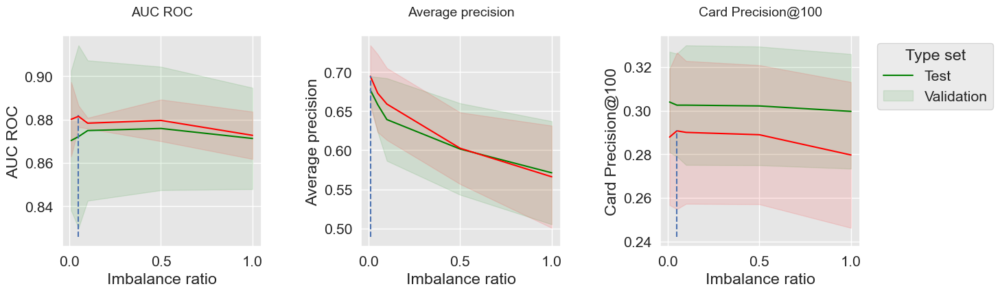

In [390]:
get_performances_plots(performances_df_balanced_rf, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_balanced_rf)

In [391]:
summary_test_performances = pd.concat([summary_performances_baseline_rf.iloc[2,:],
                                       summary_performances_balanced_rf.iloc[2,:]
                                      ],axis=1)
summary_test_performances.columns=['Baseline RF', 'Balanced RF']
summary_test_performances

,Baseline RF,Balanced RF
AUC ROC,0.87+/-0.02,0.872+/-0.02
Average precision,0.678+/-0.01,0.677+/-0.01
Card Precision@100,0.299+/-0.01,0.302+/-0.01


In [392]:
classifier = xgboost.XGBClassifier()

parameters = {'clf__max_depth':[3], 
              'clf__n_estimators':[50],
              'clf__learning_rate':[0.3],
              'clf__scale_pos_weight':[1,5,10,50,100], 
              'clf__random_state':[0],
              'clf__n_jobs':[-1]}

start_time = time.time()

# Fit models and assess performances for all parameters
performances_df=model_selection_wrapper(transactions_df, classifier, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                        n_jobs=-1)

execution_time_weighted_xgboost = time.time()-start_time

In [393]:
# Select parameter of interest (scale_pos_weight)
parameters_dict = dict(performances_df['Parameters'])
performances_df['Parameters summary'] = [parameters_dict[i]['clf__scale_pos_weight'] for i in range(len(parameters_dict))]

# Rename to performances_df_weighted_xgboost for model performance comparison later in this section
performances_df_weighted_xgboost=performances_df

In [394]:
performances_df_weighted_xgboost

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.871726,0.010990,0.686534,0.011086,0.302143,0.013458,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",3.338214,0.882839,0.008380,0.708226,0.020697,0.287500,0.016331,1
1,0.866154,0.008993,0.667997,0.004161,0.300000,0.010351,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",3.398715,0.882704,0.010765,0.697100,0.021795,0.288571,0.013477,5
2,0.865940,0.008009,0.667121,0.007867,0.298214,0.008534,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",3.400967,0.880610,0.005834,0.691400,0.018352,0.287500,0.014996,10
3,0.863178,0.007149,0.648028,0.012585,0.296429,0.011316,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",2.818934,0.882049,0.011948,0.677362,0.021367,0.284643,0.014406,50
4,0.858011,0.006991,0.630036,0.020288,0.292143,0.015403,"{'clf__learning_rate': 0.3, 'clf__max_depth': ...",2.704713,0.880666,0.012492,0.661458,0.020015,0.285000,0.016736,100


In [395]:
summary_performances_weighted_xgboost=get_summary_performances(performances_df=performances_df_weighted_xgboost, parameter_column_name="Parameters summary")
summary_performances_weighted_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1,1,5
Validation performance,0.883+/-0.01,0.708+/-0.02,0.289+/-0.01
Test performance,0.872+/-0.01,0.687+/-0.01,0.3+/-0.01
Optimal parameter(s),1,1,1
Optimal test performance,0.872+/-0.01,0.687+/-0.01,0.302+/-0.01


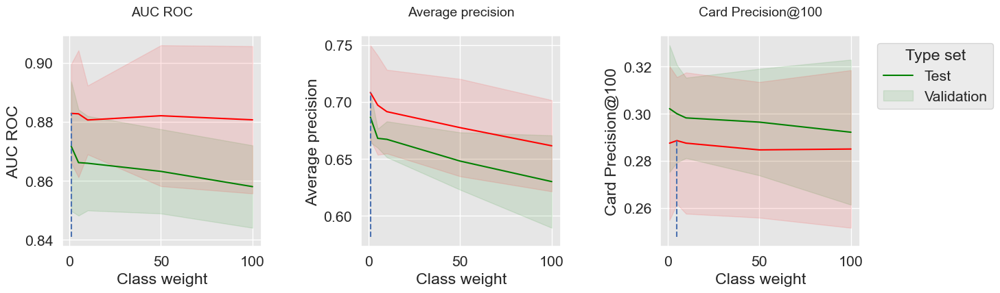

In [396]:
get_performances_plots(performances_df_weighted_xgboost, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Class weight",
                       summary_performances=summary_performances_weighted_xgboost)

In [397]:
summary_test_performances = pd.concat([summary_performances_baseline_xgboost.iloc[2,:],
                                       summary_performances_weighted_xgboost.iloc[2,:]
                                      ],axis=1)
summary_test_performances.columns=['Baseline XGBoost', 'Weighted XGBoost']
summary_test_performances

,Baseline XGBoost,Weighted XGBoost
AUC ROC,0.872+/-0.01,0.872+/-0.01
Average precision,0.687+/-0.01,0.687+/-0.01
Card Precision@100,0.302+/-0.01,0.3+/-0.01


In [398]:
summary_test_performances = pd.concat([summary_performances_baseline_bagging.iloc[2,:],
                                       summary_performances_balanced_bagging.iloc[2,:],
                                       summary_performances_baseline_rf.iloc[2,:],
                                       summary_performances_balanced_rf.iloc[2,:],
                                       summary_performances_baseline_xgboost.iloc[2,:],
                                       summary_performances_weighted_xgboost.iloc[2,:],
                                      ],axis=1)
summary_test_performances.columns=['Baseline Bagging', 'Balanced Bagging', 
                                   'Baseline RF', 'Balanced RF', 
                                   'Baseline XGBoost', 'Weighted XGBoost']

In [399]:
summary_test_performances

,Baseline Bagging,Balanced Bagging,Baseline RF,Balanced RF,Baseline XGBoost,Weighted XGBoost
AUC ROC,0.856+/-0.02,0.879+/-0.01,0.87+/-0.02,0.872+/-0.02,0.872+/-0.01,0.872+/-0.01
Average precision,0.678+/-0.01,0.68+/-0.01,0.678+/-0.01,0.677+/-0.01,0.687+/-0.01,0.687+/-0.01
Card Precision@100,0.293+/-0.01,0.305+/-0.01,0.299+/-0.01,0.302+/-0.01,0.302+/-0.01,0.3+/-0.01


In [400]:
performances_df_dictionary={
    "Baseline Bagging": performances_df_baseline_bagging,
    "Baseline RF": performances_df_baseline_rf,
    "Baseline XGBoost": performances_df_baseline_xgboost,
    "Balanced Bagging": performances_df_balanced_bagging,
    "Balanced RF": performances_df_balanced_rf,
    "Weighted XGBoost": performances_df_weighted_xgboost
}

execution_times=[execution_time_baseline_bagging,
                 execution_time_baseline_rf,
                 execution_time_baseline_xgboost,
                 execution_time_balanced_bagging,
                 execution_time_rf_balanced,
                 execution_time_weighted_xgboost
                 ]

In [401]:
filehandler = open('performances_ensembles.pkl', 'wb') 
pickle.dump((performances_df_dictionary, execution_times), filehandler)
filehandler.close()

In [402]:
# Initialization: Load shared functions

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py
#%run ../Chapter_References/shared_functions.ipynb

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0 63257    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
 81 63257   81 51352    0     0  10750      0  0:00:05  0:00:04  0:00:01 10752
100 63257  100 63257    0     0  12752      0  0:00:04  0:00:04 --:--:-- 15238


<Figure size 640x480 with 0 Axes>

In [403]:
filehandler = open('images/performances_cost_sensitive_real_world_data.pkl', 'rb') 
(performances_df_dictionary, execution_times) = pickle.load(filehandler)

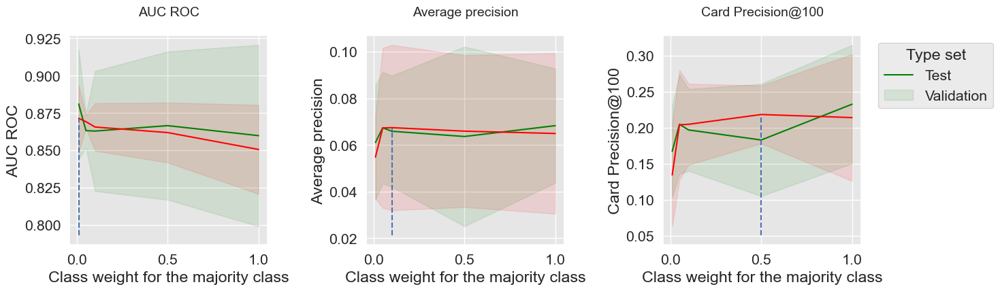

In [404]:
performances_df_dt=performances_df_dictionary['Decision Tree']
summary_performances_dt=get_summary_performances(performances_df_dt, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_dt, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Class weight for the majority class",
                       summary_performances=summary_performances_dt)

In [405]:
summary_performances_dt

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.01,0.1,0.5
Validation performance,0.871+/-0.01,0.067+/-0.02,0.218+/-0.02
Test performance,0.881+/-0.02,0.066+/-0.01,0.183+/-0.04
Optimal parameter(s),0.01,1.0,1.0
Optimal test performance,0.881+/-0.02,0.068+/-0.01,0.232+/-0.04


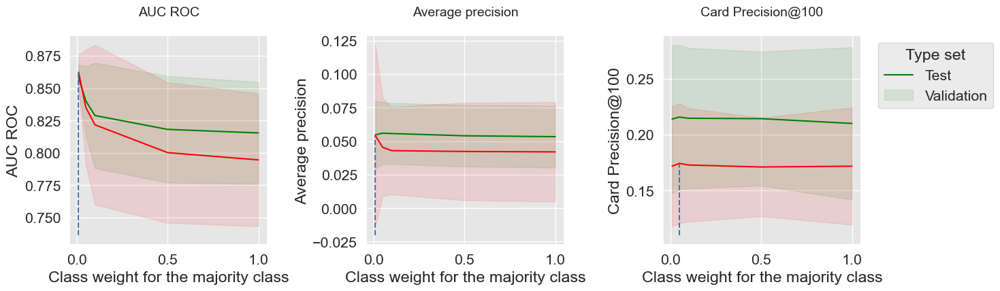

In [406]:
performances_df_lr=performances_df_dictionary['Logistic Regression']
summary_performances_lr=get_summary_performances(performances_df_lr, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_lr, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Class weight for the majority class",
                       summary_performances=summary_performances_lr)

In [407]:
summary_performances_lr

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.01,0.01,0.05
Validation performance,0.862+/-0.01,0.054+/-0.03,0.174+/-0.03
Test performance,0.858+/-0.01,0.055+/-0.01,0.216+/-0.03
Optimal parameter(s),0.01,0.05,0.05
Optimal test performance,0.858+/-0.01,0.056+/-0.01,0.216+/-0.03


In [408]:
filehandler = open('images/performances_resampling_real_world_data.pkl', 'rb') 
(performances_df_dictionary, execution_times) = pickle.load(filehandler)

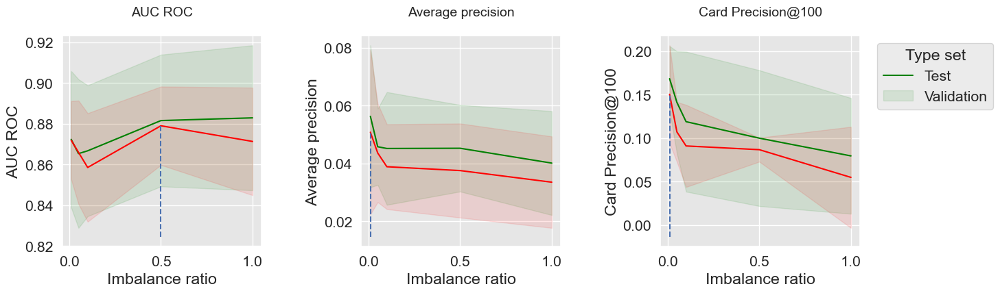

In [409]:
performances_df_SMOTE=performances_df_dictionary['SMOTE']
summary_performances_SMOTE=get_summary_performances(performances_df_SMOTE, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_SMOTE, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_SMOTE)

In [410]:
summary_performances_SMOTE

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.5,0.01,0.01
Validation performance,0.879+/-0.01,0.051+/-0.01,0.15+/-0.03
Test performance,0.882+/-0.02,0.056+/-0.01,0.168+/-0.02
Optimal parameter(s),1.0,0.01,0.01
Optimal test performance,0.883+/-0.02,0.056+/-0.01,0.168+/-0.02


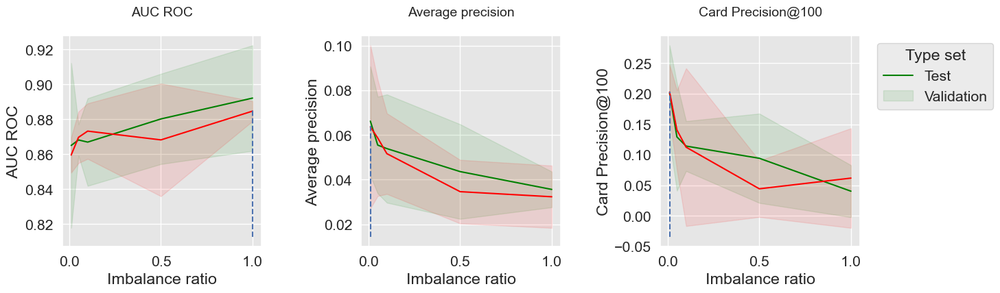

In [411]:
performances_df_RUS=performances_df_dictionary['RUS']
summary_performances_RUS=get_summary_performances(performances_df_RUS, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_RUS, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_RUS)

In [412]:
summary_performances_RUS

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1.0,0.01,0.01
Validation performance,0.885+/-0.0,0.064+/-0.02,0.203+/-0.02
Test performance,0.892+/-0.02,0.066+/-0.01,0.201+/-0.04
Optimal parameter(s),1.0,0.01,0.01
Optimal test performance,0.892+/-0.02,0.066+/-0.01,0.201+/-0.04


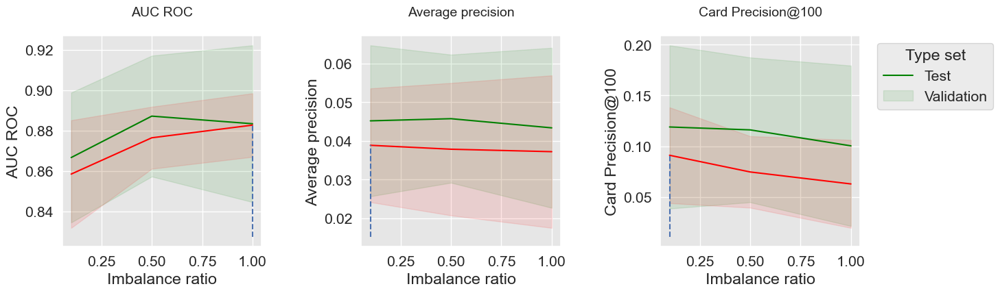

In [413]:
performances_df_combined=performances_df_dictionary['Combined']
summary_performances_combined=get_summary_performances(performances_df_combined, parameter_column_name="Parameters summary")

get_performances_plots(performances_df_combined, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_combined)

In [414]:
summary_performances_combined

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1.0,0.1,0.1
Validation performance,0.883+/-0.01,0.039+/-0.01,0.091+/-0.02
Test performance,0.883+/-0.02,0.045+/-0.01,0.119+/-0.04
Optimal parameter(s),0.5,0.5,0.1
Optimal test performance,0.887+/-0.01,0.046+/-0.01,0.119+/-0.04


In [415]:
filehandler = open('images/performances_ensembles_real_world_data.pkl', 'rb') 
(performances_df_dictionary, execution_times) = pickle.load(filehandler)

In [416]:
performances_df_baseline_bagging=performances_df_dictionary['Baseline Bagging']
summary_performances_baseline_bagging=get_summary_performances(performances_df_baseline_bagging, parameter_column_name="Parameters summary")

performances_df_baseline_rf=performances_df_dictionary['Baseline RF']
summary_performances_baseline_rf=get_summary_performances(performances_df_baseline_rf, parameter_column_name="Parameters summary")

performances_df_baseline_xgboost=performances_df_dictionary['Baseline XGBoost']
summary_performances_baseline_xgboost=get_summary_performances(performances_df_baseline_xgboost, parameter_column_name="Parameters summary")

summary_test_performances = pd.concat([summary_performances_baseline_bagging.iloc[2,:],
                                       summary_performances_baseline_rf.iloc[2,:],
                                       summary_performances_baseline_xgboost.iloc[2,:],
                                      ],axis=1)
summary_test_performances.columns=['Baseline Bagging', 'Baseline RF', 'Baseline XGBoost']

In [417]:
summary_test_performances

,Baseline Bagging,Baseline RF,Baseline XGBoost
AUC ROC,0.912+/-0.02,0.912+/-0.02,0.928+/-0.01
Average precision,0.072+/-0.03,0.08+/-0.03,0.095+/-0.03
Card Precision@100,0.209+/-0.07,0.227+/-0.05,0.235+/-0.07


In [418]:
performances_df_balanced_bagging=performances_df_dictionary['Balanced Bagging']
performances_df_balanced_bagging

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.917228,0.017889,0.086163,0.022412,0.247857,0.041656,{'clf__base_estimator': DecisionTreeClassifier...,260.625890,0.913089,0.006379,0.094850,0.017160,0.258929,0.025140,0.02
1,0.918801,0.015721,0.090421,0.017192,0.247500,0.037422,{'clf__base_estimator': DecisionTreeClassifier...,289.001823,0.914338,0.006752,0.089633,0.017394,0.255000,0.037095,0.05
2,0.919477,0.013627,0.087215,0.016194,0.240000,0.039448,{'clf__base_estimator': DecisionTreeClassifier...,251.555288,0.914954,0.008718,0.085063,0.017055,0.241071,0.034998,0.10
3,0.921931,0.012261,0.076810,0.015141,0.209643,0.035962,{'clf__base_estimator': DecisionTreeClassifier...,238.826444,0.913580,0.012917,0.069417,0.010087,0.195714,0.013209,0.50
4,0.921426,0.013367,0.069408,0.011683,0.189286,0.023332,{'clf__base_estimator': DecisionTreeClassifier...,197.796464,0.914754,0.011732,0.060259,0.008555,0.160357,0.021556,1.00


In [419]:
summary_performances_balanced_bagging=get_summary_performances(performances_df_balanced_bagging, parameter_column_name="Parameters summary")
summary_performances_balanced_bagging

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.1,0.02,0.02
Validation performance,0.915+/-0.01,0.095+/-0.02,0.259+/-0.03
Test performance,0.919+/-0.01,0.086+/-0.02,0.248+/-0.04
Optimal parameter(s),0.5,0.05,0.02
Optimal test performance,0.922+/-0.01,0.09+/-0.02,0.248+/-0.04


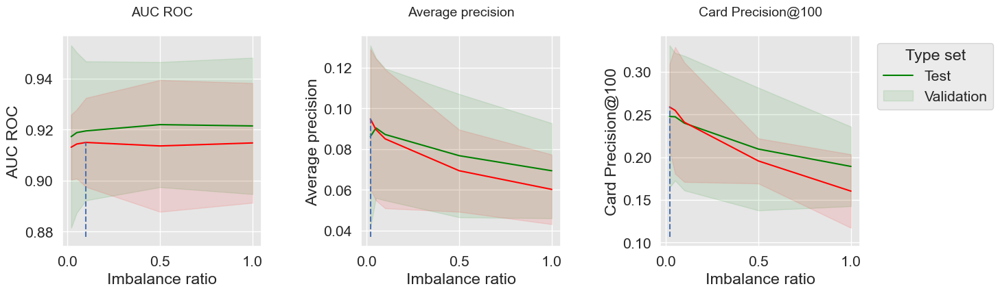

In [420]:
get_performances_plots(performances_df_balanced_bagging, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_balanced_bagging)

In [421]:
performances_df_balanced_rf=performances_df_dictionary['Balanced RF']
performances_df_balanced_rf

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.918636,0.020386,0.093255,0.018644,0.253929,0.026733,"{'clf__max_depth': 10, 'clf__n_estimators': 10...",138.678571,0.918772,0.005630,0.099003,0.021238,0.263571,0.031274,0.01
1,0.922445,0.018733,0.092084,0.017847,0.245000,0.025425,"{'clf__max_depth': 10, 'clf__n_estimators': 10...",140.741641,0.920488,0.005681,0.094071,0.018980,0.255000,0.033480,0.05
2,0.925383,0.015810,0.088692,0.017844,0.238929,0.027244,"{'clf__max_depth': 10, 'clf__n_estimators': 10...",130.145606,0.921882,0.004630,0.091078,0.019971,0.247500,0.037490,0.10
3,0.926452,0.013919,0.075340,0.013228,0.200714,0.032490,"{'clf__max_depth': 10, 'clf__n_estimators': 10...",125.557530,0.921611,0.007349,0.074475,0.016815,0.202857,0.034949,0.50
4,0.924311,0.013693,0.069106,0.011243,0.176786,0.015498,"{'clf__max_depth': 10, 'clf__n_estimators': 10...",115.135572,0.919174,0.008283,0.066712,0.015405,0.180714,0.037109,1.00


In [422]:
summary_performances_balanced_rf=get_summary_performances(performances_df_balanced_rf, parameter_column_name="Parameters summary")
summary_performances_balanced_rf

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,0.1,0.01,0.01
Validation performance,0.922+/-0.0,0.099+/-0.02,0.264+/-0.03
Test performance,0.925+/-0.02,0.093+/-0.02,0.254+/-0.03
Optimal parameter(s),0.5,0.01,0.01
Optimal test performance,0.926+/-0.01,0.093+/-0.02,0.254+/-0.03


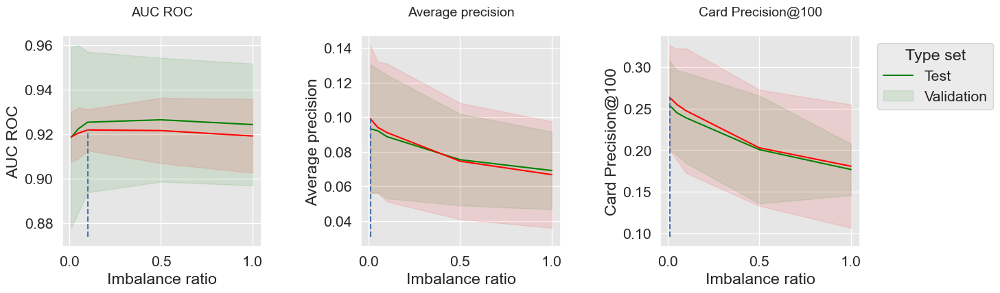

In [423]:
get_performances_plots(performances_df_balanced_rf, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Imbalance ratio",
                       summary_performances=summary_performances_balanced_rf)

In [424]:
performances_df_weighted_xgboost=performances_df_dictionary['Weighted XGBoost']
performances_df_weighted_xgboost

,AUC ROC Test,AUC ROC Test Std,Average precision Test,Average precision Test Std,Card Precision@100 Test,Card Precision@100 Test Std,Parameters,Execution time,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters summary
0,0.928408,0.014108,0.094781,0.030425,0.235357,0.068111,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",518.837213,0.924261,0.011350,0.102488,0.019552,0.260714,0.023765,1
1,0.927328,0.013481,0.096711,0.025309,0.248929,0.056887,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",626.773925,0.920673,0.016914,0.106036,0.021723,0.268571,0.021213,5
2,0.926817,0.013696,0.093330,0.026236,0.231071,0.057821,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",639.092060,0.920256,0.015958,0.098559,0.019405,0.262143,0.021888,10
3,0.925220,0.012177,0.095823,0.024201,0.240000,0.041367,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",627.310905,0.912374,0.027515,0.093519,0.014645,0.244643,0.032739,50
4,0.924530,0.012777,0.089102,0.030194,0.237857,0.043910,"{'clf__learning_rate': 0.1, 'clf__max_depth': ...",480.403027,0.912332,0.023152,0.086822,0.013398,0.238929,0.039453,100


In [425]:
summary_performances_weighted_xgboost=get_summary_performances(performances_df_weighted_xgboost, parameter_column_name="Parameters summary")
summary_performances_weighted_xgboost

,AUC ROC,Average precision,Card Precision@100
Best estimated parameters,1,5,5
Validation performance,0.924+/-0.01,0.106+/-0.02,0.269+/-0.02
Test performance,0.928+/-0.01,0.097+/-0.03,0.249+/-0.06
Optimal parameter(s),1,5,5
Optimal test performance,0.928+/-0.01,0.097+/-0.03,0.249+/-0.06


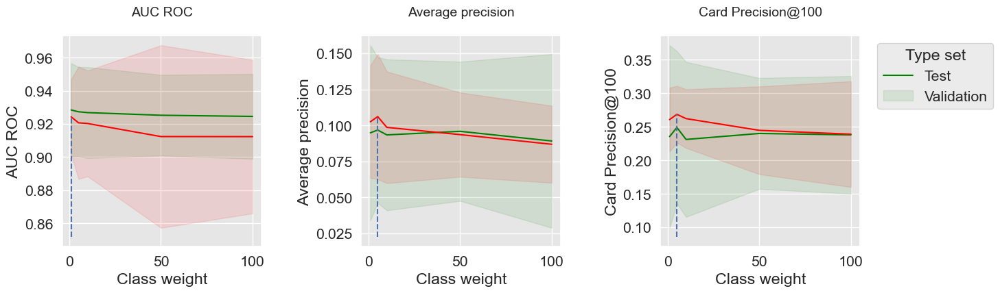

In [426]:
get_performances_plots(performances_df_weighted_xgboost, 
                       performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100'], 
                       expe_type_list=['Test','Validation'], expe_type_color_list=['#008000','#FF0000'],
                       parameter_name="Class weight",
                       summary_performances=summary_performances_weighted_xgboost)

In [427]:
summary_test_performances = pd.concat([summary_performances_baseline_bagging.iloc[2,:],
                                       summary_performances_balanced_bagging.iloc[2,:],
                                       summary_performances_baseline_rf.iloc[2,:],
                                       summary_performances_balanced_rf.iloc[2,:],
                                       summary_performances_baseline_xgboost.iloc[2,:],
                                       summary_performances_weighted_xgboost.iloc[2,:],
                                      ],axis=1)
summary_test_performances.columns=['Baseline Bagging', 'Balanced Bagging', 
                                   'Baseline RF', 'Balanced RF', 
                                   'Baseline XGBoost', 'Weighted XGBoost']


In [428]:
summary_test_performances

,Baseline Bagging,Balanced Bagging,Baseline RF,Balanced RF,Baseline XGBoost,Weighted XGBoost
AUC ROC,0.912+/-0.02,0.919+/-0.01,0.912+/-0.02,0.925+/-0.02,0.928+/-0.01,0.928+/-0.01
Average precision,0.072+/-0.03,0.086+/-0.02,0.08+/-0.03,0.093+/-0.02,0.095+/-0.03,0.097+/-0.03
Card Precision@100,0.209+/-0.07,0.248+/-0.04,0.227+/-0.05,0.254+/-0.03,0.235+/-0.07,0.249+/-0.06


In [429]:
# Initialization: Load shared functions and simulated data 

# Load shared functions
!curl -O https://raw.githubusercontent.com/Fraud-Detection-Handbook/fraud-detection-handbook/main/Chapter_References/shared_functions.py
%run shared_functions.py

# Get simulated data from Github repository
if not os.path.exists("simulated-data-transformed"):
    !git clone https://github.com/Fraud-Detection-Handbook/simulated-data-transformed

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:02 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  4 63257    4  2756    0     0    795      0  0:01:19  0:00:03  0:01:16   795
100 63257  100 63257    0     0  16307      0  0:00:03  0:00:03 --:--:-- 16311


<Figure size 640x480 with 0 Axes>

In [430]:
DIR_INPUT='simulated-data-transformed/data/' 

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

Load  files
CPU times: total: 906 ms
Wall time: 1.41 s
919767 transactions loaded, containing 8195 fraudulent transactions


In [431]:
# Setting the starting day for the training period, and the deltas
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7
(train_df, test_df)=get_train_test_set(transactions_df,start_date_training,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)
# By default, scaling the input data
(train_df, test_df)=scaleData(train_df,test_df,input_features)

In [432]:
import torch

In [433]:
if torch.cuda.is_available():
    DEVICE = "cuda" 
else:
    DEVICE = "cpu"
print("Selected device is",DEVICE)

Selected device is cpu


In [434]:
SEED = 42

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

seed_everything(SEED)

In [435]:
x_train = torch.FloatTensor(train_df[input_features].values)
x_test = torch.FloatTensor(test_df[input_features].values)
y_train = torch.FloatTensor(train_df[output_feature].values)
y_test = torch.FloatTensor(test_df[output_feature].values)

In [436]:
class FraudDataset(torch.utils.data.Dataset):
    
    def __init__(self, x, y):
        'Initialization'
        self.x = x
        self.y = y

    def __len__(self):
        'Returns the total number of samples'
        return len(self.x)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample index
        if self.y is not None:
            return self.x[index].to(DEVICE), self.y[index].to(DEVICE)
        else:
            return self.x[index].to(DEVICE)

In [437]:
train_loader_params = {'batch_size': 64,
          'shuffle': True,
          'num_workers': 0}
test_loader_params = {'batch_size': 64,
          'num_workers': 0}

# Generators

training_set = FraudDataset(x_train, y_train)

testing_set = FraudDataset(x_test, y_test)


training_generator = torch.utils.data.DataLoader(training_set, **train_loader_params)
testing_generator = torch.utils.data.DataLoader(testing_set, **test_loader_params)

In [438]:
%%capture

fig_activation, axs = plt.subplots(3, 2,figsize=(11, 13))

input_values = torch.arange(-5, 5, 0.05)

#linear activation
output_values = input_values
axs[0, 0].plot(input_values, output_values)
axs[0, 0].set_title('Linear')
axs[0, 0].set_ylim([-5.1,5.1])

#heavyside activation
output_values = input_values>0
axs[0, 1].plot(input_values, output_values)
axs[0, 1].set_title('Heavyside (perceptron)')
axs[0, 1].set_ylim([-0.1,1.1])

#sigmoid activation
activation = torch.nn.Sigmoid()
output_values = activation(input_values)
axs[1, 0].plot(input_values, output_values)
axs[1, 0].set_title('Sigmoid')
axs[1, 0].set_ylim([-1.1,1.1])

#tanh activation
activation = torch.nn.Tanh()
output_values = activation(input_values)
axs[1, 1].plot(input_values, output_values)
axs[1, 1].set_title('Tanh')
axs[1, 1].set_ylim([-1.1,1.1])

#relu activation
activation = torch.nn.ReLU()
output_values = activation(input_values)
axs[2, 0].plot(input_values, output_values)
axs[2, 0].set_title('ReLU')
axs[2, 0].set_ylim([-0.5,5.1])

#leaky relu activation
activation = torch.nn.LeakyReLU(negative_slope=0.05)
output_values = activation(input_values)
axs[2, 1].plot(input_values, output_values)
axs[2, 1].set_title('Leaky ReLU')
axs[2, 1].set_ylim([-0.5,5.1])

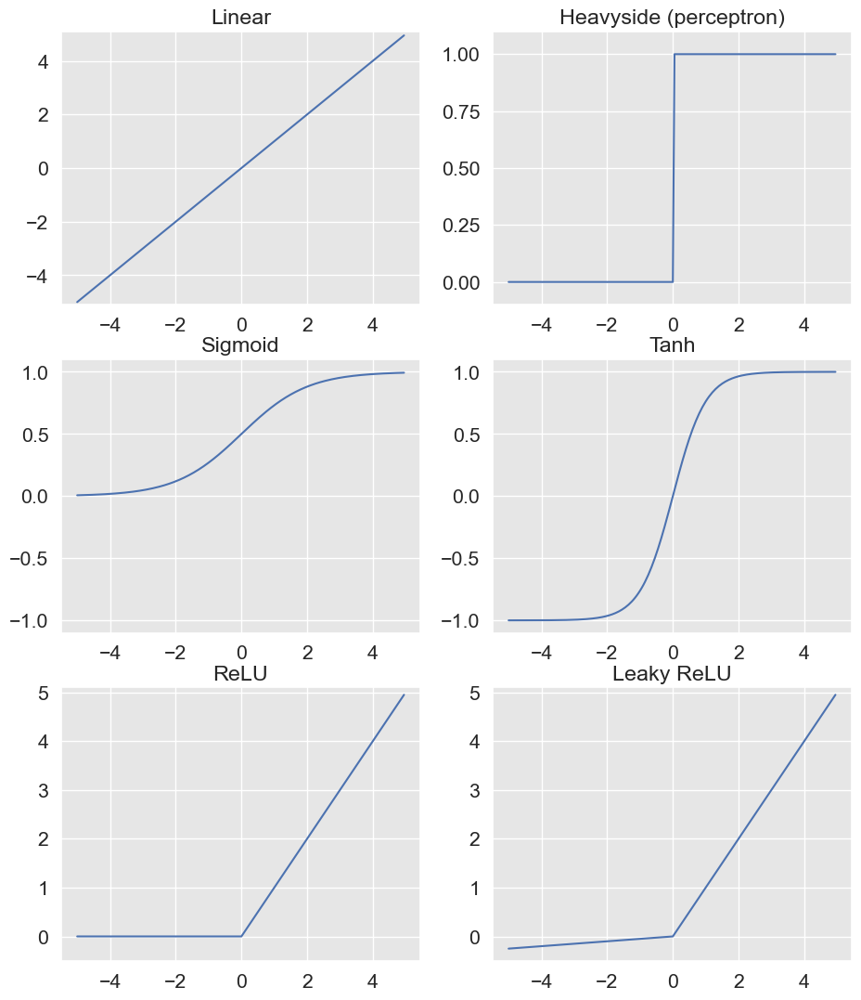

In [439]:
fig_activation

In [440]:
class SimpleFraudMLP(torch.nn.Module):
    
        def __init__(self, input_size, hidden_size):
            super(SimpleFraudMLP, self).__init__()
            # parameters
            self.input_size = input_size
            self.hidden_size  = hidden_size
            
            #input to hidden
            self.fc1 = torch.nn.Linear(self.input_size, self.hidden_size)
            self.relu = torch.nn.ReLU()
            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 1)
            self.sigmoid = torch.nn.Sigmoid()
            
        def forward(self, x):
            
            hidden = self.fc1(x)
            relu = self.relu(hidden)
            output = self.fc2(relu)
            output = self.sigmoid(output)
            
            return output

In [441]:
model = SimpleFraudMLP(len(input_features), 1000).to(DEVICE)

In [442]:
criterion = torch.nn.BCELoss().to(DEVICE)

In [443]:
model.eval()

SimpleFraudMLP(
  (fc1): Linear(in_features=15, out_features=1000, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=1000, out_features=1, bias=True)
  (sigmoid): Sigmoid()
)

In [444]:
def evaluate_model(model,generator,criterion):
    model.eval()
    batch_losses = []
    for x_batch, y_batch in generator:
        # Forward pass
        y_pred = model(x_batch)
        # Compute Loss
        loss = criterion(y_pred.squeeze(), y_batch)
        batch_losses.append(loss.item())
    mean_loss = np.mean(batch_losses)    
    return mean_loss
    
evaluate_model(model,testing_generator,criterion)

0.6754083162343332

In [445]:
optimizer = torch.optim.SGD(model.parameters(), lr = 0.07)

In [446]:
n_epochs = 150
#Setting the model in training mode
model.train()

#Training loop
start_time=time.time()
epochs_train_losses = []
epochs_test_losses = []
for epoch in range(n_epochs):
    model.train()
    train_loss=[]
    for x_batch, y_batch in training_generator:
        # Removing previously computed gradients
        optimizer.zero_grad()
        # Performing the forward pass on the current batch
        y_pred = model(x_batch)
        # Computing the loss given the current predictions
        loss = criterion(y_pred.squeeze(), y_batch)
        # Computing the gradients over the backward pass
        loss.backward()
        # Performing an optimization step from the current gradients
        optimizer.step()
        # Storing the current step's loss for display purposes
        train_loss.append(loss.item())
    
    #showing last training loss after each epoch
    epochs_train_losses.append(np.mean(train_loss))
    print('Epoch {}: train loss: {}'.format(epoch, np.mean(train_loss)))
    
    #evaluating the model on the test set after each epoch    
    val_loss = evaluate_model(model,testing_generator,criterion)    
    epochs_test_losses.append(val_loss)
    print('test loss: {}'.format(val_loss))   
    print("")
    
training_execution_time=time.time()-start_time

Epoch 0: train loss: 0.035700161696334574
test loss: 0.0223587492006012

Epoch 1: train loss: 0.026285224144907932
test loss: 0.021145284301361107

Epoch 2: train loss: 0.024935485261690038
test loss: 0.021621912571373594

Epoch 3: train loss: 0.024153651295785394
test loss: 0.02016681447675253

Epoch 4: train loss: 0.023543032270468077
test loss: 0.0207343944425068

Epoch 5: train loss: 0.02311610361261224
test loss: 0.020283860091833576

Epoch 6: train loss: 0.022610568789699664
test loss: 0.019814793005918943

Epoch 7: train loss: 0.022428529573977524
test loss: 0.021500719662624873

Epoch 8: train loss: 0.02185745342476444
test loss: 0.022040686079144528

Epoch 9: train loss: 0.02172904514291587
test loss: 0.020336871623479722

Epoch 10: train loss: 0.02154080734963039
test loss: 0.019787190709483905

Epoch 11: train loss: 0.021363750129156558
test loss: 0.019339693887322797

Epoch 12: train loss: 0.02109399007699345
test loss: 0.02080312066938438

Epoch 13: train loss: 0.020856365

Epoch 109: train loss: 0.014703186312832158
test loss: 0.020221071958108155

Epoch 110: train loss: 0.014991320341672184
test loss: 0.01893026423773449

Epoch 111: train loss: 0.014768711909329204
test loss: 0.01894487982537111

Epoch 112: train loss: 0.014395053586395338
test loss: 0.01951509243229166

Epoch 113: train loss: 0.014479357220425664
test loss: 0.018957565723910455

Epoch 114: train loss: 0.01455988671214583
test loss: 0.01977089079915782

Epoch 115: train loss: 0.014559689452087455
test loss: 0.0198156576786133

Epoch 116: train loss: 0.014344581482368392
test loss: 0.019834620420617573

Epoch 117: train loss: 0.014375708587248353
test loss: 0.021812603263250623

Epoch 118: train loss: 0.014308227943294158
test loss: 0.019195376802593648

Epoch 119: train loss: 0.014229876067071575
test loss: 0.020736864255968063

Epoch 120: train loss: 0.014318183662653852
test loss: 0.020718012059528612

Epoch 121: train loss: 0.014269156879492876
test loss: 0.021120962751242124

Epoch 

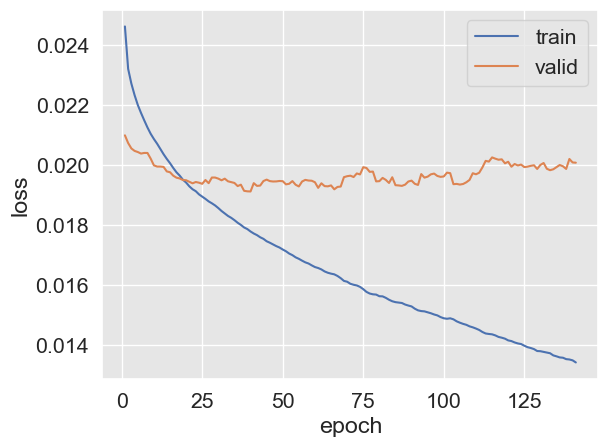

In [447]:
ma_window = 10

plt.plot(np.arange(len(epochs_train_losses)-ma_window + 1)+1, np.convolve(epochs_train_losses, np.ones(ma_window)/ma_window, mode='valid'))
plt.plot(np.arange(len(epochs_test_losses)-ma_window + 1)+1, np.convolve(epochs_test_losses, np.ones(ma_window)/ma_window, mode='valid'))
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train','valid'])
#plt.ylim([0.01,0.06])

In [448]:
print(training_execution_time)

398.9914994239807


In [449]:
start_time=time.time() 
predictions_test = model(x_test.to(DEVICE))
prediction_execution_time = time.time()-start_time
predictions_train = model(x_train.to(DEVICE))
print("Predictions took", prediction_execution_time,"seconds.")

Predictions took 0.16488885879516602 seconds.


In [450]:
predictions_df=test_df
predictions_df['predictions']=predictions_test.detach().cpu().numpy()
    
performance_assessment(predictions_df, top_k_list=[100])

,AUC ROC,Average precision,Card Precision@100
0,0.859,0.638,0.269


In [451]:
delta_valid = delta_test

start_date_training_with_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))

(train_df, valid_df)=get_train_test_set(transactions_df,start_date_training_with_valid,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

# By default, scales input data
(train_df, valid_df)=scaleData(train_df, valid_df, input_features)

In [452]:
class EarlyStopping:
    
    def __init__(self, patience=2, verbose=False):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = np.Inf
    
    def continue_training(self,current_score):
        if self.best_score > current_score:
            self.best_score = current_score
            self.counter = 0
            if self.verbose:
                print("New best score:", current_score)
        else:
            self.counter+=1
            if self.verbose:
                print(self.counter, " iterations since best score.")
                
        return self.counter <= self.patience        

In [453]:
seed_everything(SEED)

model = SimpleFraudMLP(len(input_features), 1000).to(DEVICE)

def prepare_generators(train_df,valid_df,batch_size=64):
    x_train = torch.FloatTensor(train_df[input_features].values)
    x_valid = torch.FloatTensor(valid_df[input_features].values)
    y_train = torch.FloatTensor(train_df[output_feature].values)
    y_valid = torch.FloatTensor(valid_df[output_feature].values)
    train_loader_params = {'batch_size': batch_size,
              'shuffle': True,
              'num_workers': 0}
    valid_loader_params = {'batch_size': batch_size,
              'num_workers': 0}
    # Generators
    
    training_set = FraudDataset(x_train, y_train)
    valid_set = FraudDataset(x_valid, y_valid)
    
    training_generator = torch.utils.data.DataLoader(training_set, **train_loader_params)
    valid_generator = torch.utils.data.DataLoader(valid_set, **valid_loader_params)
    
    return training_generator,valid_generator

training_generator,valid_generator = prepare_generators(train_df,valid_df,batch_size=64)

criterion = torch.nn.BCELoss().to(DEVICE)
optimizer = torch.optim.SGD(model.parameters(), lr = 0.0005)

In [454]:
seed_everything(SEED)

model = SimpleFraudMLP(len(input_features), 1000).to(DEVICE)

def prepare_generators(train_df,valid_df,batch_size=64):
    x_train = torch.FloatTensor(train_df[input_features].values)
    x_valid = torch.FloatTensor(valid_df[input_features].values)
    y_train = torch.FloatTensor(train_df[output_feature].values)
    y_valid = torch.FloatTensor(valid_df[output_feature].values)
    train_loader_params = {'batch_size': batch_size,
              'shuffle': True,
              'num_workers': 0}
    valid_loader_params = {'batch_size': batch_size,
              'num_workers': 0}
    # Generators
    
    training_set = FraudDataset(x_train, y_train)
    valid_set = FraudDataset(x_valid, y_valid)
    
    training_generator = torch.utils.data.DataLoader(training_set, **train_loader_params)
    valid_generator = torch.utils.data.DataLoader(valid_set, **valid_loader_params)
    
    return training_generator,valid_generator

training_generator,valid_generator = prepare_generators(train_df,valid_df,batch_size=64)

criterion = torch.nn.BCELoss().to(DEVICE)
optimizer = torch.optim.SGD(model.parameters(), lr = 0.0005)

In [455]:
def training_loop(model,training_generator,valid_generator,optimizer,criterion,max_epochs=100,apply_early_stopping=True,patience=2,verbose=False):
    #Setting the model in training mode
    model.train()

    if apply_early_stopping:
        early_stopping = EarlyStopping(verbose=verbose,patience=patience)
    
    all_train_losses = []
    all_valid_losses = []
    
    #Training loop
    start_time=time.time()
    for epoch in range(max_epochs):
        model.train()
        train_loss=[]
        for x_batch, y_batch in training_generator:
            optimizer.zero_grad()
            y_pred = model(x_batch)
            loss = criterion(y_pred.squeeze(), y_batch)
            loss.backward()
            optimizer.step()   
            train_loss.append(loss.item())
        
        #showing last training loss after each epoch
        all_train_losses.append(np.mean(train_loss))
        if verbose:
            print('')
            print('Epoch {}: train loss: {}'.format(epoch, np.mean(train_loss)))
        #evaluating the model on the test set after each epoch    
        valid_loss = evaluate_model(model,valid_generator,criterion)
        all_valid_losses.append(valid_loss)
        if verbose:
            print('valid loss: {}'.format(valid_loss))
        if apply_early_stopping:
            if not early_stopping.continue_training(valid_loss):
                if verbose:
                    print("Early stopping")
                break
        
    training_execution_time=time.time()-start_time
    return model,training_execution_time,all_train_losses,all_valid_losses

model,training_execution_time,train_losses,valid_losses = training_loop(model,training_generator,valid_generator,optimizer,criterion,max_epochs=500,verbose=True)


Epoch 0: train loss: 0.19094532917665022
valid loss: 0.093631992827022
New best score: 0.093631992827022

Epoch 1: train loss: 0.09756324295289316
valid loss: 0.06975944536061235
New best score: 0.06975944536061235

Epoch 2: train loss: 0.07713193200656834
valid loss: 0.057125550021972164
New best score: 0.057125550021972164

Epoch 3: train loss: 0.06579174279960061
valid loss: 0.050298154303203516
New best score: 0.050298154303203516

Epoch 4: train loss: 0.06037377719420149
valid loss: 0.04628613648600265
New best score: 0.04628613648600265

Epoch 5: train loss: 0.05693923256557656
valid loss: 0.04364783475531744
New best score: 0.04364783475531744

Epoch 6: train loss: 0.05446632008333593
valid loss: 0.04166071959898446
New best score: 0.04166071959898446

Epoch 7: train loss: 0.05247876251447611
valid loss: 0.04006742319407684
New best score: 0.04006742319407684

Epoch 8: train loss: 0.050844424602755456
valid loss: 0.038856804643660946
New best score: 0.038856804643660946

Epoch 


Epoch 73: train loss: 0.030186914618707567
valid loss: 0.024147748656296094
New best score: 0.024147748656296094

Epoch 74: train loss: 0.0301294832318544
valid loss: 0.02412401592649031
New best score: 0.02412401592649031

Epoch 75: train loss: 0.030075406447546218
valid loss: 0.024066191559270676
New best score: 0.024066191559270676

Epoch 76: train loss: 0.030022259766011576
valid loss: 0.02404336822219193
New best score: 0.02404336822219193

Epoch 77: train loss: 0.02997145698678254
valid loss: 0.024010276222917064
New best score: 0.024010276222917064

Epoch 78: train loss: 0.02991715257802184
valid loss: 0.023943996162769574
New best score: 0.023943996162769574

Epoch 79: train loss: 0.029870490228354817
valid loss: 0.023916417515780674
New best score: 0.023916417515780674

Epoch 80: train loss: 0.029818955057854434
valid loss: 0.023909771738349985
New best score: 0.023909771738349985

Epoch 81: train loss: 0.029772801581150487
valid loss: 0.02386643894047278
New best score: 0.02


Epoch 146: train loss: 0.027840775260915464
valid loss: 0.022583765393031426
New best score: 0.022583765393031426

Epoch 147: train loss: 0.027829151325921456
valid loss: 0.02259095023091007
1  iterations since best score.

Epoch 148: train loss: 0.02780032653831672
valid loss: 0.02255713342017204
New best score: 0.02255713342017204

Epoch 149: train loss: 0.02778188313266715
valid loss: 0.022554721861640044
New best score: 0.022554721861640044

Epoch 150: train loss: 0.02776208455183759
valid loss: 0.022544778165117393
New best score: 0.022544778165117393

Epoch 151: train loss: 0.027745425395300723
valid loss: 0.022546226215228195
1  iterations since best score.

Epoch 152: train loss: 0.02772658645802215
valid loss: 0.02251878311384286
New best score: 0.02251878311384286

Epoch 153: train loss: 0.027708370233868136
valid loss: 0.022511778183566415
New best score: 0.022511778183566415

Epoch 154: train loss: 0.02768476155095059
valid loss: 0.022528743868836208
1  iterations since be

In [456]:
seed_everything(SEED)
model = SimpleFraudMLP(len(input_features), 1000).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0005)
model,training_execution_time,train_losses_adam,valid_losses_adam = training_loop(model,training_generator,valid_generator,optimizer,criterion,verbose=True)


Epoch 0: train loss: 0.04549543463948216
valid loss: 0.022971064474209737
New best score: 0.022971064474209737

Epoch 1: train loss: 0.026674127313272802
valid loss: 0.020753461200123034
New best score: 0.020753461200123034

Epoch 2: train loss: 0.02477466033330458
valid loss: 0.02212113438866259
1  iterations since best score.

Epoch 3: train loss: 0.023550003413538346
valid loss: 0.021126147241031373
2  iterations since best score.

Epoch 4: train loss: 0.022702402998510764
valid loss: 0.01978605232911459
New best score: 0.01978605232911459

Epoch 5: train loss: 0.02225553793541065
valid loss: 0.019101696941731854
New best score: 0.019101696941731854

Epoch 6: train loss: 0.021778277211856403
valid loss: 0.019237928009398608
1  iterations since best score.

Epoch 7: train loss: 0.021253410979872125
valid loss: 0.01938195025148837
2  iterations since best score.

Epoch 8: train loss: 0.02083368486104654
valid loss: 0.01843274051140322
New best score: 0.01843274051140322

Epoch 9: tra

(0.01, 0.06)

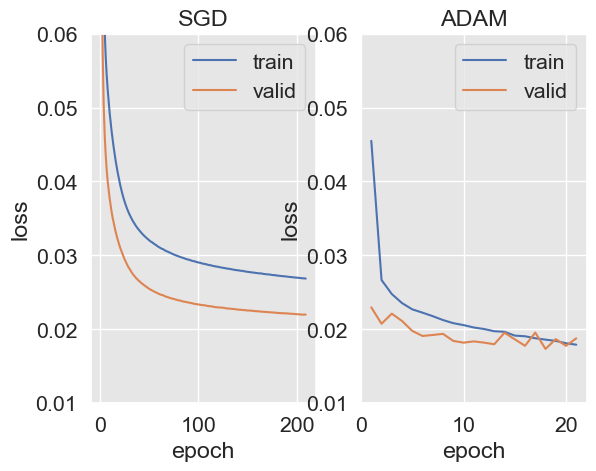

In [457]:
plt.subplot(1, 2, 1)
plt.plot(np.arange(len(train_losses))+1, train_losses)
plt.plot(np.arange(len(valid_losses))+1, valid_losses)
plt.title("SGD")
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train','valid'])
plt.ylim([0.01,0.06])

plt.subplot(1, 2, 2) 
plt.plot(np.arange(len(train_losses_adam))+1, train_losses_adam)
plt.plot(np.arange(len(valid_losses_adam))+1, valid_losses_adam)
plt.title("ADAM")
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train','valid'])
plt.ylim([0.01,0.06])

In [458]:
class SimpleFraudMLPWithDropout(torch.nn.Module):
    
        def __init__(self, input_size, hidden_size,p):
            super(SimpleFraudMLPWithDropout, self).__init__()
            # parameters
            self.input_size = input_size
            self.hidden_size  = hidden_size
            self.p = p
            
            #input to hidden
            self.fc1 = torch.nn.Linear(self.input_size, self.hidden_size)
            self.relu = torch.nn.ReLU()
            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 1)
            self.sigmoid = torch.nn.Sigmoid()
            
            self.dropout = torch.nn.Dropout(self.p)
            
        def forward(self, x):
            
            hidden = self.fc1(x)
            hidden = self.relu(hidden)
            
            hidden = self.dropout(hidden)
            
            output = self.fc2(hidden)
            output = self.sigmoid(output)
            
            return output

In [459]:
seed_everything(SEED)
model = SimpleFraudMLPWithDropout(len(input_features), 1000,0.2).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0005)
model,training_execution_time,train_losses_dropout,valid_losses_dropout = training_loop(model,training_generator,valid_generator,optimizer,criterion,verbose=False)

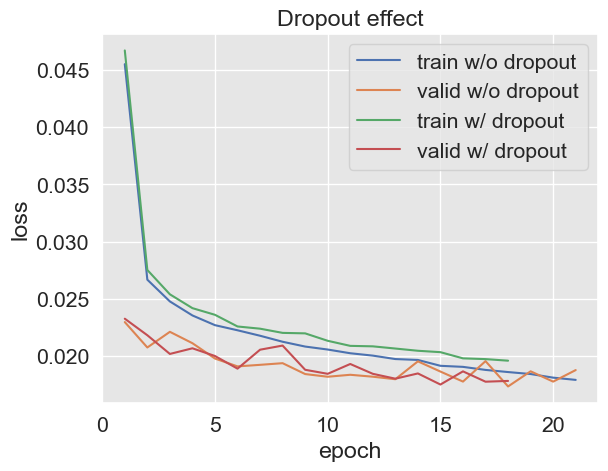

In [460]:
plt.plot(np.arange(len(train_losses_adam))+1, train_losses_adam)
plt.plot(np.arange(len(valid_losses_adam))+1, valid_losses_adam)
plt.plot(np.arange(len(train_losses_dropout))+1, train_losses_dropout)
plt.plot(np.arange(len(valid_losses_dropout))+1, valid_losses_dropout)
plt.title("Dropout effect")
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train w/o dropout','valid w/o dropout','train w/ dropout','valid w/ dropout'])

In [461]:
(train_df, valid_df)=get_train_test_set(transactions_df,start_date_training_with_valid,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

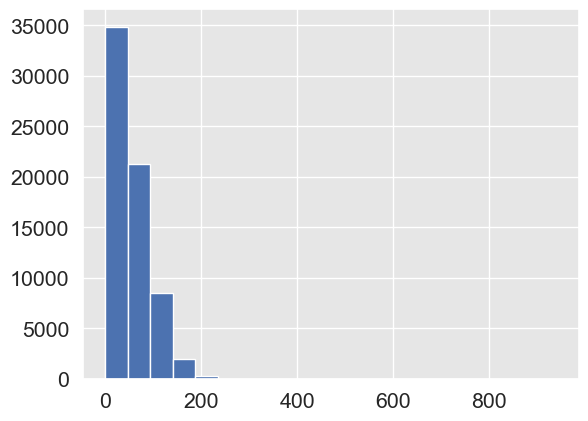

In [462]:
_ = plt.hist(train_df['TX_AMOUNT'].values,bins=20)

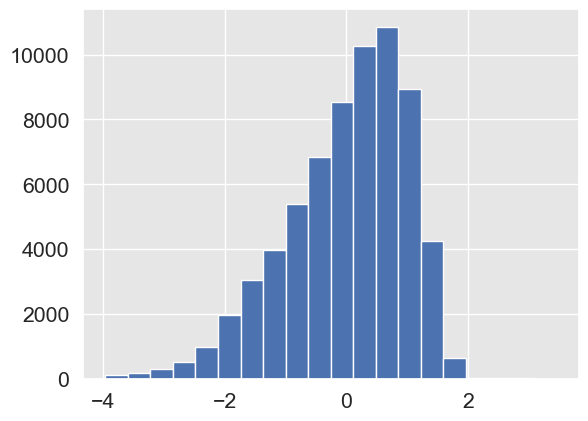

In [463]:
_ = plt.hist(sklearn.preprocessing.StandardScaler().fit_transform(np.log1p(train_df['TX_AMOUNT'].values).reshape(-1, 1)),bins=20)

In [464]:
#we did not call the function scaleData this time
seed_everything(SEED)
training_generator,valid_generator = prepare_generators(train_df,valid_df,batch_size=64)

model = SimpleFraudMLPWithDropout(len(input_features), 1000,0.2).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001)
model,training_execution_time,train_losses_without_scaling,valid_losses_without_scaling = training_loop(model,training_generator,valid_generator,optimizer,criterion,verbose=False)

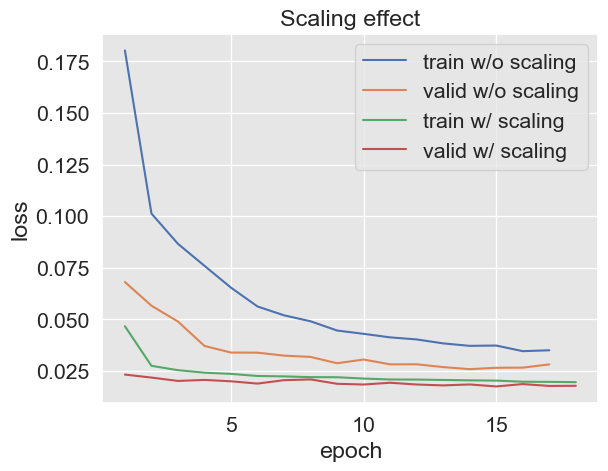

In [465]:
plt.plot(np.arange(len(train_losses_without_scaling))+1, train_losses_without_scaling)
plt.plot(np.arange(len(valid_losses_without_scaling))+1, valid_losses_without_scaling)
plt.plot(np.arange(len(train_losses_dropout))+1, train_losses_dropout)
plt.plot(np.arange(len(valid_losses_dropout))+1, valid_losses_dropout)
plt.title('Scaling effect')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train w/o scaling','valid w/o scaling','train w/ scaling','valid w/ scaling'])

In [466]:
# Let us rescale data for the next parts
(train_df, valid_df)=scaleData(train_df, valid_df,input_features)

In [467]:
input_features

['TX_AMOUNT',
 'TX_DURING_WEEKEND',
 'TX_DURING_NIGHT',
 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
 'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW',
 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
 'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW',
 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
 'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW',
 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
 'TERMINAL_ID_RISK_1DAY_WINDOW',
 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
 'TERMINAL_ID_RISK_7DAY_WINDOW',
 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
 'TERMINAL_ID_RISK_30DAY_WINDOW']

In [468]:
def weekday(tx_datetime):
    
    # Transform date into weekday (0 is Monday, 6 is Sunday)
    weekday = tx_datetime.weekday()
    
    return int(weekday)

In [469]:
train_df['TX_WEEKDAY'] = train_df.TX_DATETIME.apply(weekday)
valid_df['TX_WEEKDAY'] = valid_df.TX_DATETIME.apply(weekday)
input_categorical_features = ['TX_WEEKDAY','TERMINAL_ID']

In [470]:
class FraudMLPWithEmbedding(torch.nn.Module):
    
        def __init__(self, categorical_inputs_modalities,numerical_inputs_size,embedding_sizes, hidden_size,p):
            super(FraudMLPWithEmbedding, self).__init__()
            # parameters
            self.categorical_inputs_modalities = categorical_inputs_modalities
            self.numerical_inputs_size = numerical_inputs_size
            self.embedding_sizes = embedding_sizes
            self.hidden_size  = hidden_size
            self.p = p
            
            assert len(categorical_inputs_modalities)==len(embedding_sizes), 'categorical_inputs_modalities and embedding_sizes must have the same length'
            
            #embedding layers
            self.emb = []
            for i in range(len(categorical_inputs_modalities)):
                self.emb.append(torch.nn.Embedding(int(categorical_inputs_modalities[i]), int(embedding_sizes[i])).to(DEVICE))
                
            
            #contenated inputs to hidden
            self.fc1 = torch.nn.Linear(self.numerical_inputs_size+int(np.sum(embedding_sizes)), self.hidden_size)
            self.relu = torch.nn.ReLU()
            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 1)
            self.sigmoid = torch.nn.Sigmoid()
            
            self.dropout = torch.nn.Dropout(self.p)
            
        def forward(self, x):
            #we assume that x start with numerical features then categorical features
            inputs = [x[:,:self.numerical_inputs_size]]
            for i in range(len(self.categorical_inputs_modalities)):
                inputs.append(self.emb[i](x[:,self.numerical_inputs_size+i].to(torch.int64)))
            
            x = torch.cat(inputs,axis=1)
            
            
            hidden = self.fc1(x)
            hidden = self.relu(hidden)
            
            hidden = self.dropout(hidden)
            
            output = self.fc2(hidden)
            output = self.sigmoid(output)
            
            return output

In [471]:
def prepare_generators_with_categorical_features(train_df,valid_df,input_categorical_features,batch_size=64):
    x_train = torch.FloatTensor(train_df[input_features].values)
    x_valid = torch.FloatTensor(valid_df[input_features].values)
    y_train = torch.FloatTensor(train_df[output_feature].values)
    y_valid = torch.FloatTensor(valid_df[output_feature].values)
    
    #categorical variables : encoding valid according to train
    encoder = sklearn.preprocessing.OrdinalEncoder(handle_unknown='use_encoded_value',unknown_value=-1)
    x_train_cat = encoder.fit_transform(train_df[input_categorical_features].values) + 1
    categorical_inputs_modalities = np.max(x_train_cat,axis=0)+1
    
    x_train_cat = torch.IntTensor(x_train_cat)
    x_valid_cat = torch.IntTensor(encoder.transform(valid_df[input_categorical_features].values) + 1)
    
    x_train = torch.cat([x_train,x_train_cat],axis=1)
    x_valid = torch.cat([x_valid,x_valid_cat],axis=1)
    
    train_loader_params = {'batch_size': batch_size,
              'shuffle': True,
              'num_workers': 0}
    valid_loader_params = {'batch_size': batch_size,
              'num_workers': 0}
    
    # Generators
    training_set = FraudDataset(x_train, y_train)
    valid_set = FraudDataset(x_valid, y_valid)
    
    training_generator = torch.utils.data.DataLoader(training_set, **train_loader_params)
    valid_generator = torch.utils.data.DataLoader(valid_set, **valid_loader_params)
    
    return training_generator,valid_generator, categorical_inputs_modalities

In [472]:
seed_everything(SEED)
training_generator,valid_generator,categorical_inputs_modalities = prepare_generators_with_categorical_features(train_df,valid_df,input_categorical_features,batch_size=64)

embedding_sizes = [10]*len(categorical_inputs_modalities)

model = FraudMLPWithEmbedding(categorical_inputs_modalities,len(input_features),embedding_sizes, 1000,0.2).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001)
model,training_execution_time,train_losses_embedding,valid_losses_embedding = training_loop(model,training_generator,valid_generator,optimizer,criterion,verbose=False)

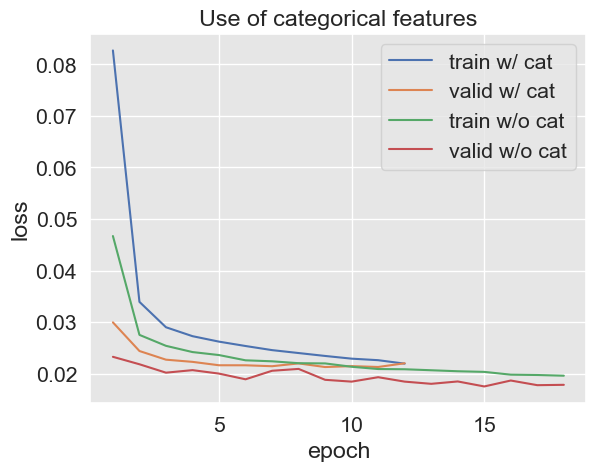

In [473]:
plt.plot(np.arange(len(train_losses_embedding))+1, train_losses_embedding)
plt.plot(np.arange(len(valid_losses_embedding))+1, valid_losses_embedding)
plt.plot(np.arange(len(train_losses_dropout))+1, train_losses_dropout)
plt.plot(np.arange(len(valid_losses_dropout))+1, valid_losses_dropout)
plt.title('Use of categorical features')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train w/ cat','valid w/ cat','train w/o cat','valid w/o cat'])

In [474]:
!pip install skorch


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [475]:
from skorch import NeuralNetClassifier

In [476]:
class FraudMLP(torch.nn.Module):
    
        def __init__(self, hidden_size=100,num_layers=1,p=0, input_size=len(input_features)):
            super(FraudMLP, self).__init__()
            # parameters
            self.input_size = input_size
            self.hidden_size  = hidden_size
            self.p = p
            
            #input to hidden
            self.fc1 = torch.nn.Linear(self.input_size, self.hidden_size)
            self.relu = torch.nn.ReLU()
            
            self.fc_hidden=[]
            for i in range(num_layers-1):
                self.fc_hidden.append(torch.nn.Linear(self.hidden_size, self.hidden_size))
                self.fc_hidden.append(torch.nn.ReLU())
                
            #hidden to output
            self.fc2 = torch.nn.Linear(self.hidden_size, 2)
            self.softmax = torch.nn.Softmax()
            
            self.dropout = torch.nn.Dropout(self.p)
            
        def forward(self, x):
            
            hidden = self.fc1(x)
            hidden = self.relu(hidden)             
            hidden = self.dropout(hidden)
            
            for layer in self.fc_hidden:
                hidden=layer(hidden)
                hidden = self.dropout(hidden)
            
            output = self.fc2(hidden)
            output = self.softmax(output)
            
            return output

In [477]:
class FraudDatasetForPipe(torch.utils.data.Dataset):
    
    def __init__(self, x, y):
        'Initialization'
        self.x = torch.FloatTensor(x)
        self.y = None
        if y is not None:
            self.y = torch.LongTensor(y.values)
        

    def __len__(self):
        'Returns the total number of samples'
        return len(self.x)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample index
        if self.y is not None:
            return self.x[index], self.y[index]
        else:
            return self.x[index], -1       

In [478]:
net = NeuralNetClassifier(
    FraudMLP,
    max_epochs=2,
    lr=0.001,
    optimizer=torch.optim.Adam,
    batch_size=64,
    dataset=FraudDatasetForPipe,
    iterator_train__shuffle=True
)
net.set_params(train_split=False, verbose=0)

<class 'skorch.classifier.NeuralNetClassifier'>[uninitialized](
  module=<class '__main__.FraudMLP'>,
)

In [479]:
# Testing the wrapper

#X=train_df[input_features].values
#y=train_df[output_feature]
#
#net.fit(X, y)
#net.predict_proba(X)

In [480]:
# Only keep columns that are needed as argument to custom scoring function
# to reduce serialization time of transaction dataset
transactions_df_scorer=transactions_df[['CUSTOMER_ID', 'TX_FRAUD','TX_TIME_DAYS']]

# Make scorer using card_precision_top_k_custom
card_precision_top_100 = sklearn.metrics.make_scorer(card_precision_top_k_custom, 
                                                     needs_proba=True, 
                                                     top_k=100, 
                                                     transactions_df=transactions_df_scorer)

n_folds=4
start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)
delta_assessment = delta_valid

In [481]:
seed_everything(SEED)
start_time=time.time()

parameters = {
    'clf__lr': [0.001 ],
    'clf__batch_size': [64],
    'clf__max_epochs': [10, 20],
    'clf__module__hidden_size': [100],
    'clf__module__num_layers': [1,2],
    'clf__module__p': [0],
}

scoring = {'roc_auc':'roc_auc',
           'average_precision': 'average_precision',
           'card_precision@100': card_precision_top_100,
           }


performance_metrics_list_grid=['roc_auc', 'average_precision', 'card_precision@100']
performance_metrics_list=['AUC ROC', 'Average precision', 'Card Precision@100']

performances_df_validation=prequential_grid_search(
    transactions_df, net, 
    input_features, output_feature,
    parameters, scoring, 
    start_date_training=start_date_training_with_valid,
    n_folds=n_folds,
    expe_type='Validation',
    delta_train=delta_train, 
    delta_delay=delta_delay, 
    delta_assessment=delta_valid,
    performance_metrics_list_grid=performance_metrics_list_grid,
    performance_metrics_list=performance_metrics_list)

print("Validation: Total execution time: "+str(round(time.time()-start_time,2))+"s")

Validation: Total execution time: 110.97s


In [482]:
performances_df_validation

,AUC ROC Validation,AUC ROC Validation Std,Average precision Validation,Average precision Validation Std,Card Precision@100 Validation,Card Precision@100 Validation Std,Parameters,Execution time
0,0.877232,0.010889,0.666342,0.008639,0.282857,0.010926,"{'clf__batch_size': 64, 'clf__lr': 0.001, 'clf...",37.252151
1,0.877042,0.012948,0.664635,0.013878,0.283214,0.012138,"{'clf__batch_size': 64, 'clf__lr': 0.001, 'clf...",42.660987
2,0.877760,0.011185,0.685873,0.010203,0.282500,0.014263,"{'clf__batch_size': 64, 'clf__lr': 0.001, 'clf...",59.833629
3,0.875451,0.012871,0.677248,0.017310,0.281429,0.012897,"{'clf__batch_size': 64, 'clf__lr': 0.001, 'clf...",61.108448


In [ ]:
seed_everything(SEED)


parameters = {
    'clf__lr': [0.001 , 0.0001, 0.0002],
    'clf__batch_size': [64,128,256],
    'clf__max_epochs': [10,20,40],
    'clf__module__hidden_size': [500],
    'clf__module__num_layers': [1,2],
    'clf__module__p': [0,0.2,0.4],
    'clf__module__input_size': [int(len(input_features))],
}

start_time=time.time()

performances_df=model_selection_wrapper(transactions_df, net, 
                                        input_features, output_feature,
                                        parameters, scoring, 
                                        start_date_training_for_valid,
                                        start_date_training_for_test,
                                        n_folds=n_folds,
                                        delta_train=delta_train, 
                                        delta_delay=delta_delay, 
                                        delta_assessment=delta_assessment,
                                        performance_metrics_list_grid=performance_metrics_list_grid,
                                        performance_metrics_list=performance_metrics_list,
                                         n_jobs=10)


execution_time_nn = time.time()-start_time

parameters_dict=dict(performances_df['Parameters'])
performances_df['Parameters summary']=[str(parameters_dict[i]['clf__lr'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__batch_size'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__max_epochs'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__p'])+
                                   '/'+
                                   str(parameters_dict[i]['clf__module__num_layers'])
                                   for i in range(len(parameters_dict))]

performances_df_nn=performances_df

In [ ]:
performances_df_nn

In [ ]:
execution_time_nn

In [ ]:
summary_performances_nn=get_summary_performances(performances_df_nn, parameter_column_name="Parameters summary")
summary_performances_nn